In [1]:
import json
import os
import numpy as np
import requests
import pandas as pd
from bs4 import BeautifulSoup
import re
from docx import Document
from docx.shared import Pt
import pickle
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import collections
from IPython.display import display

import math
import statistics
from scipy.stats import norm

from IPython.display import display


from matplotlib.pyplot import figure

from sklearn.metrics import classification_report, ConfusionMatrixDisplay, confusion_matrix, accuracy_score

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from scipy.stats import shapiro, mannwhitneyu, normaltest, kstest

from deepdiff import DeepDiff
import random
import prettytable
from prettytable import PrettyTable
from textwrap import fill

In [2]:
def plot_classification_report(y_test, y_pred, lista_clf_report, cmap):
    
    model_report = classification_report(y_test, y_pred, output_dict=True)
    
    model_r = pd.DataFrame(model_report).iloc[:-1, :].T
    
    g = sns.heatmap(model_r, annot=True, cmap=cmap, cbar=False)
    
    plt.title("{} Test classification report".format(risorsa))
    
    lista_clf_report.append(model_r)
    
    plt.show()

In [3]:
def plot_classification_results(diz_df, bf, cmap):
        
    y_test = 'y_test' if not bf else 'gold_classes'
    y_pred = 'y_pred' if not bf else 'system_classes'
    y_score = 'y_score' if not bf else 'probabilities'
    
    lista_cm_normalizzate = []
    lista_clf_report = []
    
    for clf in diz_df:
        
        #classificatore del livello
        print("\033[1m{}\033[0m".format(clf.title()))
        
        print("------------------------")
        print("  Summary")
        print("------------------------")
        print(classification_report(diz_df[clf][y_test], diz_df[clf][y_pred]))
        
        plot_classification_report(diz_df[clf][y_test], diz_df[clf][y_pred], lista_clf_report, cmap)

        print("\n------------------------")
        print("  Confusion Matrix")
        print("------------------------")
        
        cm1 = ConfusionMatrixDisplay.from_predictions(diz_df[clf][y_test], \
                                                      diz_df[clf][y_pred], cmap=cmap)

        
        cm2 = ConfusionMatrixDisplay.from_predictions(diz_df[clf][y_test], \
                                                      diz_df[clf][y_pred], normalize = 'true', cmap=cmap)
        
        cm1.ax_.set_title("{} Confusion matrix {}".format(risorsa, clf))
        cm2.ax_.set_title("{} Confusion matrix normalized {}".format(risorsa, clf))
                
        lista_cm_normalizzate.append(cm2)
        
        plot_roc(diz_df[clf][y_test], \
                  diz_df[clf][y_score])
        
        plot_precision_recall(diz_df[clf][y_test], \
                  diz_df[clf][y_score])
        
        plot_cumulative_gain(diz_df[clf][y_test], \
                  diz_df[clf][y_score])
        
        plot_lift_curve(diz_df[clf][y_test], \
                  diz_df[clf][y_score])

        plt.show()
        
        print("------------------------------------------------------------------------------------------------")
        
    return lista_cm_normalizzate, lista_clf_report

In [4]:
path_pickle = "../pickle"

In [5]:
def controlla_ids(diz):
    
    lista_ids = []
    
    for clf in diz:
        
        if not lista_ids:
            print("inizializzo la lista con il classificatore {}".format(clf))
            lista_ids = list(diz[clf]['ids_preds'].keys())
            
        if list(diz[clf]['ids_preds'].keys()) != lista_ids:
            print("Ho trovato degli id diversi per il classificatore {}".format(clf))
            
    return lista_ids

In [6]:
diz_cmap = {'5': 'Blues',
            '10': 'YlOrBr',
            '20': 'PuRd',
            '30': 'Reds',
            'random_speech': 'YlGn'}
risorsa = 'ParlaMint'

In [7]:
def plot_all_normalized_confusion_matrices(lista_grafici, model, dist, cmap):
    
    n_cols = ''
    figsize=(20, 12)
    fontsize = 15
    fontsize_plots = 10
    
    if 'SVM' in model:
        n_cols = 12
    else:
        n_cols = 5
        figsize=(10, 12)
        fontsize = 13
        
    fig,ax = plt.subplots(1, n_cols, figsize = figsize)

    for i, f in enumerate(lista_grafici):
        f.plot(ax=ax[i], cmap=cmap)
        f.im_.colorbar.remove()
        f.ax_.set_xlabel('')
        if i!=0:
            f.ax_.set_ylabel('')
        if i==0:
            f.ax_.set_ylabel(f.ax_.get_ylabel(), fontsize=fontsize_plots)
        f.ax_.set_title('epoch {}'.format(i+1), fontsize=fontsize_plots)

    fig.text(0.5, 0.41, 'Predicted label', ha='left', fontsize = fontsize_plots)
    plt.subplots_adjust(wspace=0.3, hspace=3)
    #cax = fig.add_axes([0.14, 0.38, 0.75, 0.01])
    #fig.colorbar(f.im_, orientation='horizontal', cax=cax)
    title = "{} Normalized confusion matrices for {} classification on distance {}".format(risorsa, model, dist)
    if model == 'BERT fine-tuned':
        title = "{} Normalized confusion matrices for {} classification on distance {}".format(risorsa, model, dist)
    plt.suptitle(title, y=0.62, fontsize=fontsize)
    plt.show()

In [8]:
def plot_all_classification_report(lista_clf_report, dist, cmap, model):
    
    nrows = ''
    ncols = ''
    figsize=(15, 8)
    
    if 'SVM' in model:
        nrows = 3
        ncols = 4
    else:
        nrows = 1
        ncols = 5
        figsize=(19,4)
        
    fig,ax = plt.subplots(nrows, ncols, figsize=figsize)
    n_row = -1

    if "SVM" in model:
        for j in list(range(nrows)):
            for i in list(range(ncols)):
                n_row +=1
                g = sns.heatmap(lista_clf_report[n_row], annot=True, cmap=cmap, cbar=False, ax= ax[j, i])
                title = "{} {} \nclf {} Test classification report \nDistance {}".format(risorsa, model, n_row+1, dist)
                if 'scaled' in model:
                    title = "{} {} \nclf {} Test classification report \nDistance {}".format(risorsa, model, n_row+1, dist)
                g.set_title(title)
            plt.tight_layout()
        
    if not "SVM" in model:
        for i in list(range(ncols)):
            n_row +=1
            g = sns.heatmap(lista_clf_report[n_row], annot=True, cmap=cmap, cbar=False, ax= ax[i])
            title =  "{} {} epoch {}\n Test classification report \nDistance {}".format(risorsa, model, n_row+1, dist)
            g.set_title(title)
        plt.tight_layout()

### Performance measurements
- **ROC curve**: https://towardsdatascience.com/understanding-auc-roc-curve-68b2303cc9c5
    AUC (Area Under The Curve) ROC (Receiver Operating Characteristics) curve (or AUROC - Area Under the Receiver Operating Characteristics). It is one of the most important evaluation metrics for checking any classification model’s performance. ROC is a probability curve and AUC represents the degree or measure of separability. It tells how much the model is capable of distinguishing between classes. 
    Higher the AUC, the better the model is at predicting 0 classes as 0 and 1 classes as 1. An excellent model has AUC near to the 1 which means it has a good measure of separability. A poor model has an AUC near 0 which means it has the worst measure of separability. In fact, it means it is reciprocating the result. It is predicting 0s as 1s and 1s as 0s. And when AUC is 0.5, it means the model has no class separation capacity whatsoever.
-  **Lift curve**: The lift curve describes a performance coefficient (the lift) over the cumulative proportion of a population. The Lift Chart measures the effectiveness of models by calculating the ratio between the result obtained with a model and the result obtained without a model. The result obtained without a model is based on randomly selected records. In the chart, it is represented by the random curve. In the Lift Chart, the random curve is always represented as a horizontal line. At that point in the chart where the model curve declines below the random curve, the lift factor is smaller than 1. This means that the records of the model contain fewer target values than a random sample with equally distributed target values.
- **Precision recall curve**: 
    Precision can be thought of as the fraction of positive predictions that actually belong to the positive class. Recall can be thought of as the fraction of positive predictions out of all positive instances in the data set. The gray dotted line represents a “baseline” classifier — this classifier would simply predict that all instances belong to the positive class. A good classifier will maintain both a high precision and high recall across the graph, and will “hug” the upper right corner.

# SVM

In [9]:
dist_5_svm = open(path_pickle + "/" + "diz_classifiers_bert_svm_df_dist_5.pickle", "rb")
dist_10_svm = open(path_pickle + "/" + "diz_classifiers_bert_svm_df_dist_10.pickle", "rb")
dist_20_svm = open(path_pickle + "/" + "diz_classifiers_bert_svm_df_dist_20.pickle", "rb")
dist_30_svm = open(path_pickle + "/" + "diz_classifiers_bert_svm_df_dist_30.pickle", "rb")
dist_random_speech_svm = open(path_pickle + "/" + "diz_classifiers_bert_svm_df_random_speech.pickle", "rb")

diz_dist_5_svm = pickle.load(dist_5_svm)
diz_dist_10_svm = pickle.load(dist_10_svm)
diz_dist_20_svm = pickle.load(dist_20_svm)
diz_dist_30_svm = pickle.load(dist_30_svm)
diz_random_speech_svm = pickle.load(dist_random_speech_svm)

In [11]:
list(diz_dist_10_svm['df_dist_10']['clf_1']['ids_preds'].keys()) == list(diz_dist_10_svm['df_dist_10']['clf_5']['ids_preds'].keys())

True

In [12]:
lista_ids_svm_5 = controlla_ids(diz_dist_5_svm['df_dist_5'])

inizializzo la lista con il classificatore clf_1


In [13]:
lista_ids_svm_10 = controlla_ids(diz_dist_10_svm['df_dist_10'])

inizializzo la lista con il classificatore clf_1


In [14]:
lista_ids_svm_20 = controlla_ids(diz_dist_20_svm['df_dist_20'])

inizializzo la lista con il classificatore clf_1


In [15]:
lista_ids_svm_30 = controlla_ids(diz_dist_30_svm['df_dist_30'])

inizializzo la lista con il classificatore clf_1


In [16]:
lista_ids_svm_random_speech = controlla_ids(diz_random_speech_svm['df_random_speech'])

inizializzo la lista con il classificatore clf_1


# SVM classification results

Clf_1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      0.52      0.51      1200
           1       0.50      0.49      0.50      1200

    accuracy                           0.50      2400
   macro avg       0.50      0.50      0.50      2400
weighted avg       0.50      0.50      0.50      2400



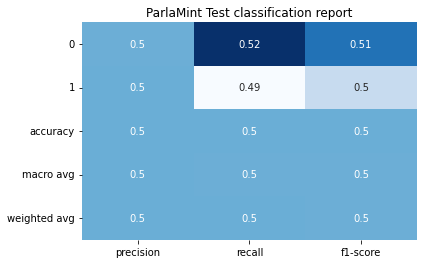


------------------------
  Confusion Matrix
------------------------


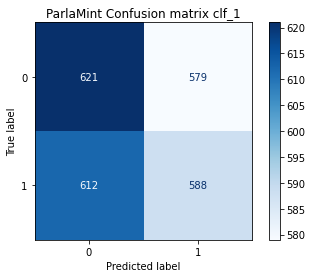

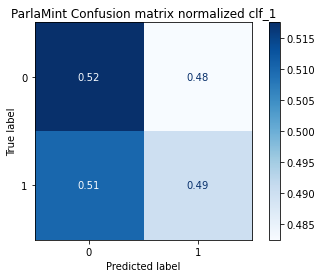

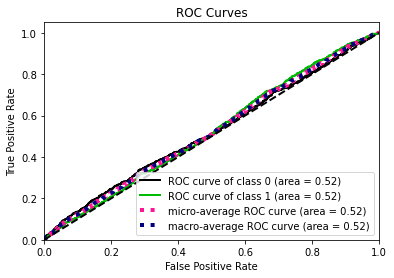

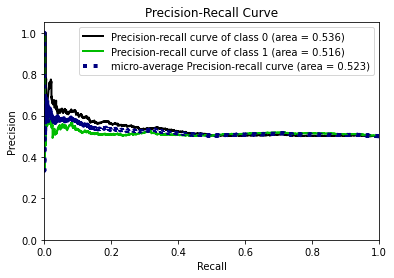

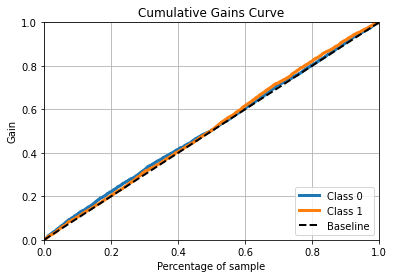

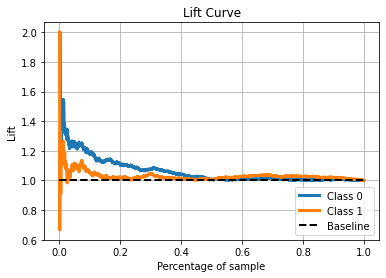

------------------------------------------------------------------------------------------------
Clf_2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.52      0.52      1200
           1       0.52      0.52      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



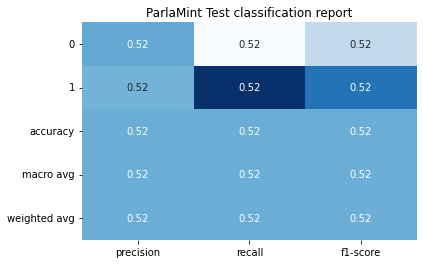


------------------------
  Confusion Matrix
------------------------


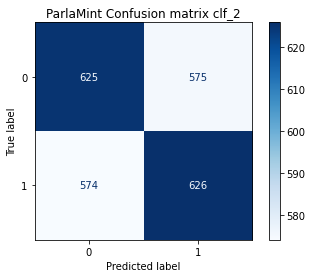

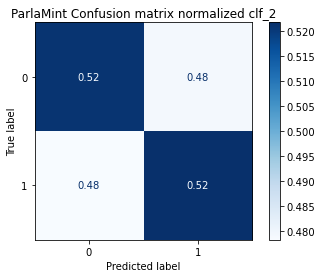

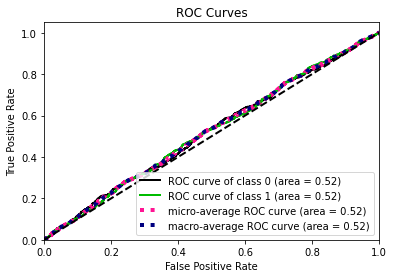

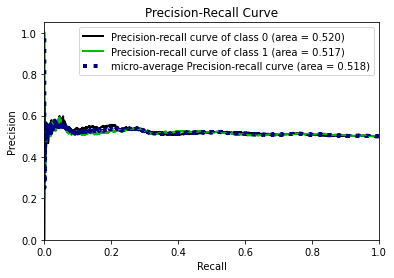

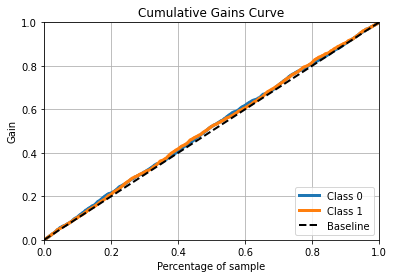

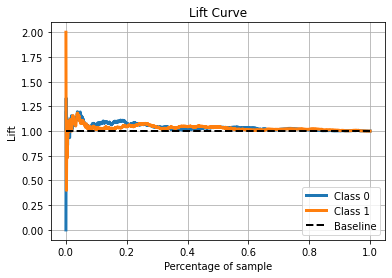

------------------------------------------------------------------------------------------------
Clf_3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.52      0.52      1200
           1       0.52      0.52      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



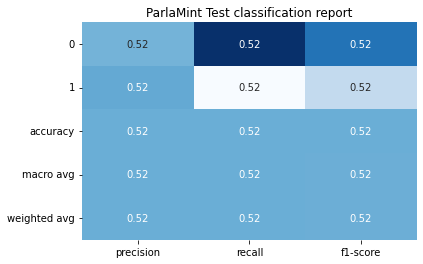


------------------------
  Confusion Matrix
------------------------


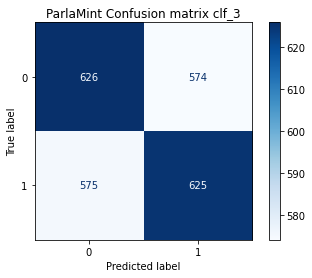

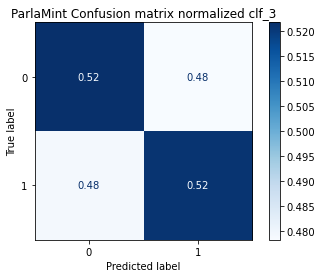

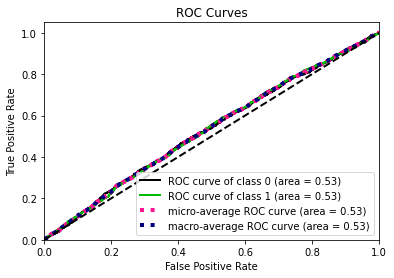

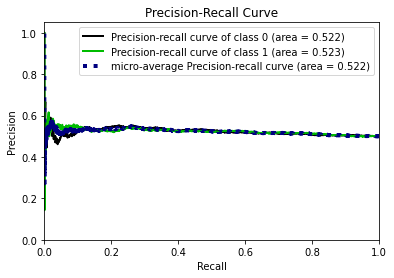

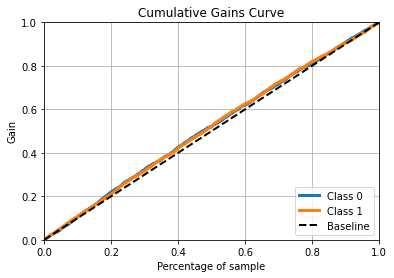

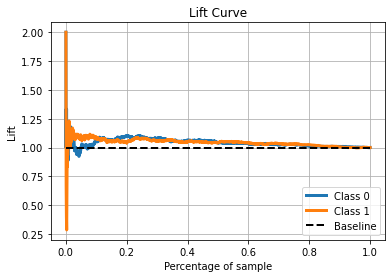

------------------------------------------------------------------------------------------------
Clf_4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.52      0.51      1200
           1       0.51      0.50      0.51      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



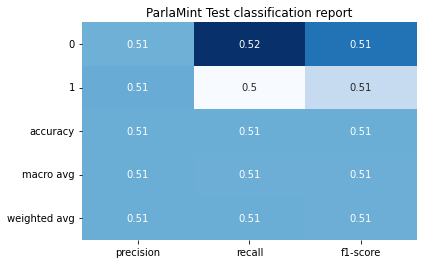


------------------------
  Confusion Matrix
------------------------


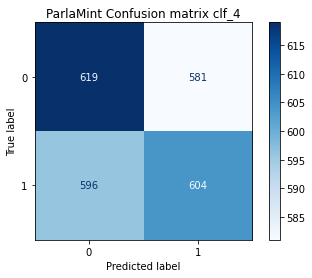

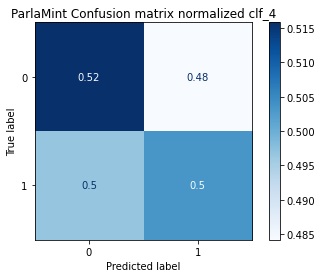

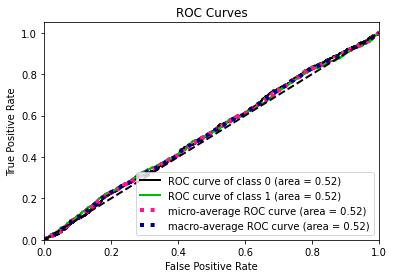

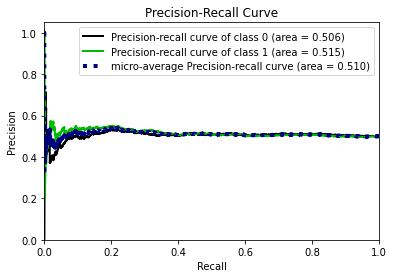

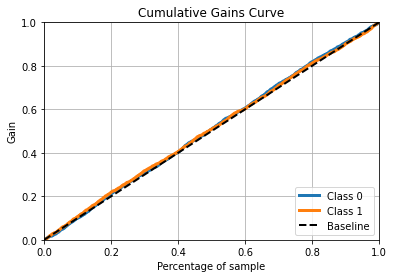

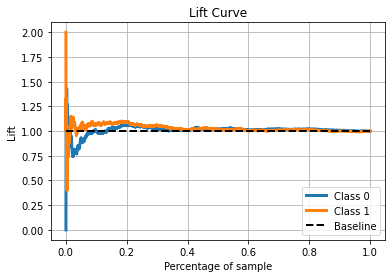

------------------------------------------------------------------------------------------------
Clf_5
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.53      0.53      1200
           1       0.53      0.54      0.54      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



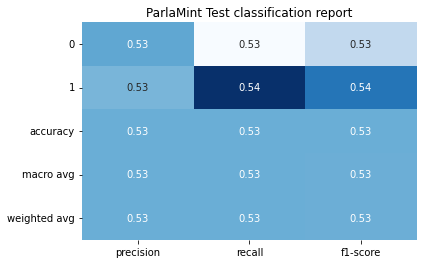


------------------------
  Confusion Matrix
------------------------


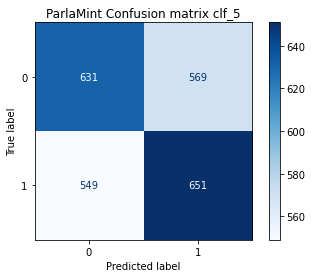

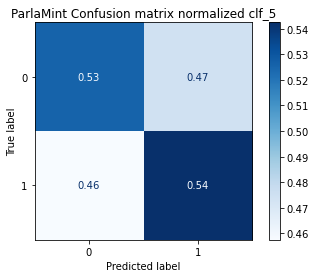

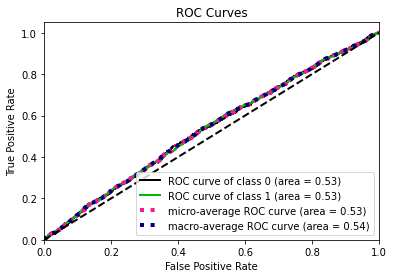

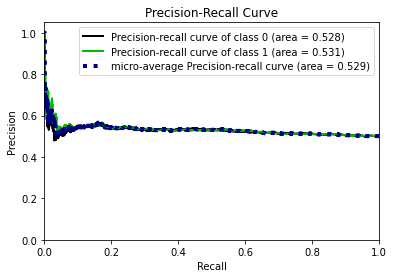

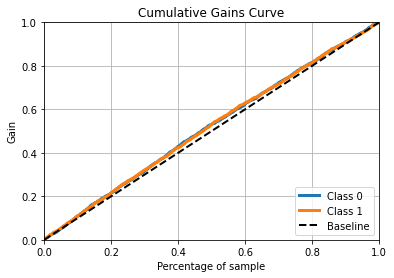

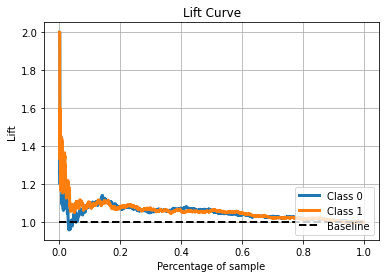

------------------------------------------------------------------------------------------------
Clf_6
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.52      1200
           1       0.52      0.54      0.53      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



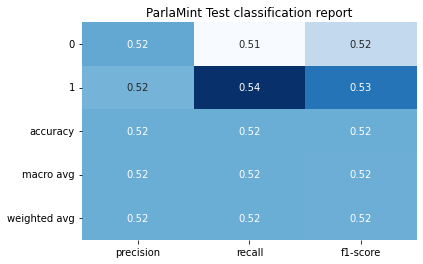


------------------------
  Confusion Matrix
------------------------


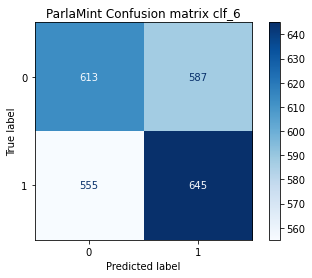

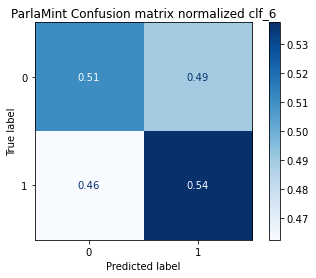

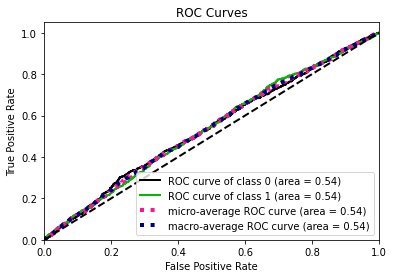

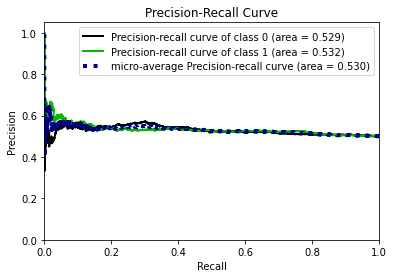

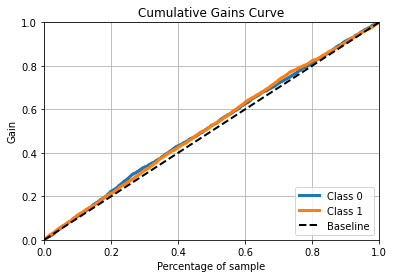

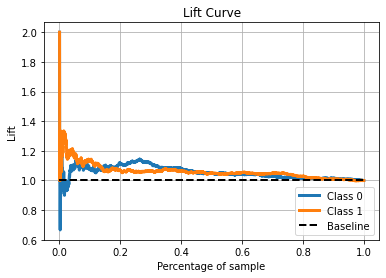

------------------------------------------------------------------------------------------------
Clf_7
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.50      0.50      1200
           1       0.51      0.53      0.52      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



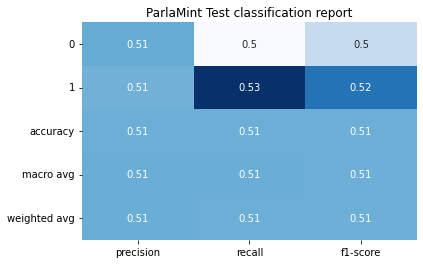


------------------------
  Confusion Matrix
------------------------


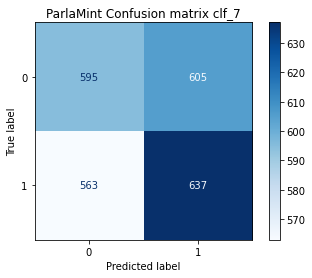

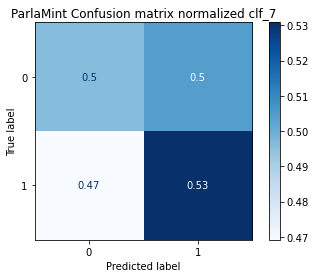

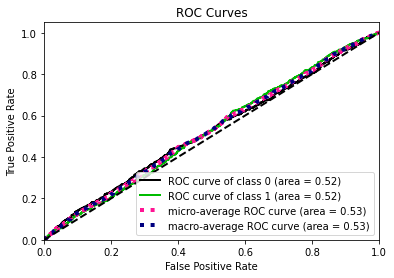

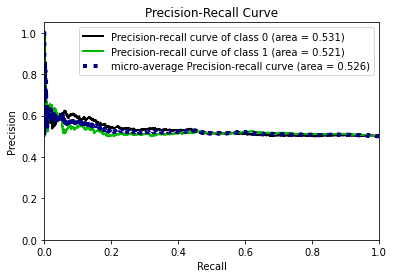

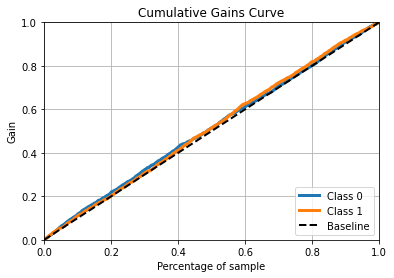

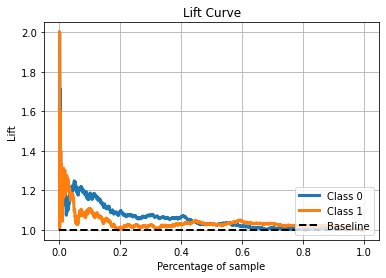

------------------------------------------------------------------------------------------------
Clf_8
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      0.50      0.50      1200
           1       0.50      0.50      0.50      1200

    accuracy                           0.50      2400
   macro avg       0.50      0.50      0.50      2400
weighted avg       0.50      0.50      0.50      2400



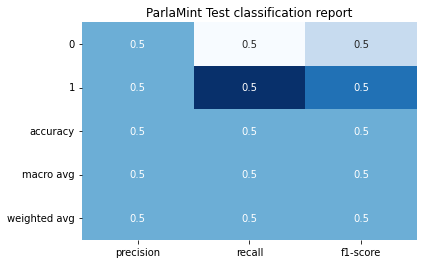


------------------------
  Confusion Matrix
------------------------


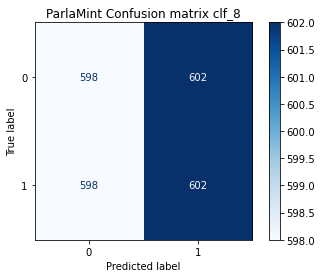

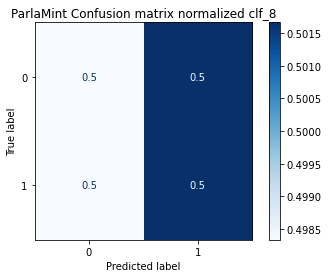

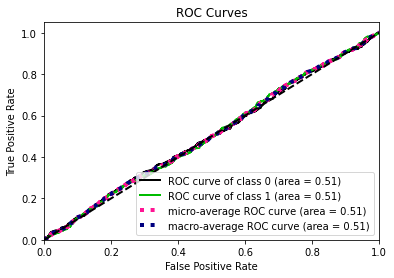

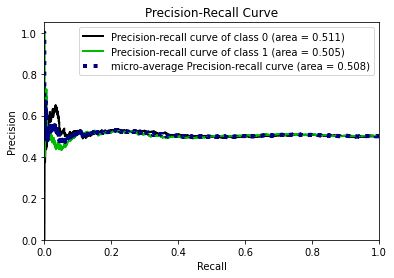

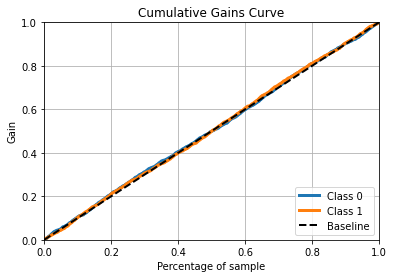

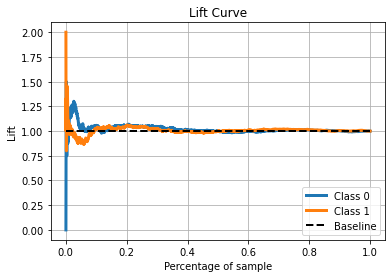

------------------------------------------------------------------------------------------------
Clf_9
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      0.51      0.50      1200
           1       0.50      0.50      0.50      1200

    accuracy                           0.50      2400
   macro avg       0.50      0.50      0.50      2400
weighted avg       0.50      0.50      0.50      2400



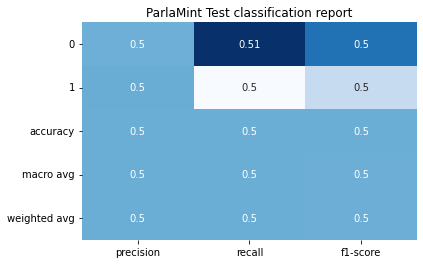


------------------------
  Confusion Matrix
------------------------


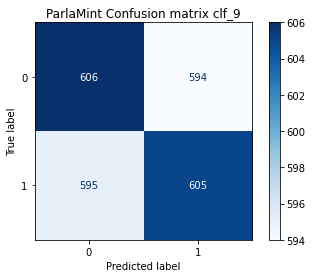

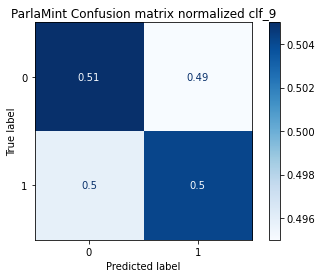

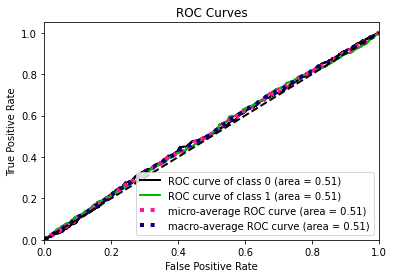

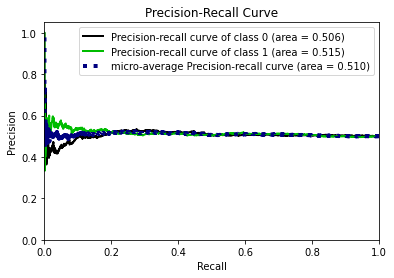

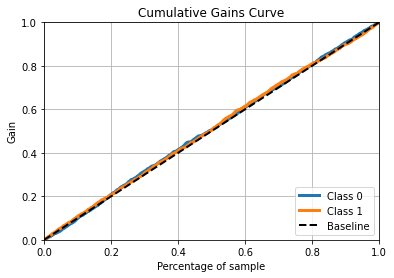

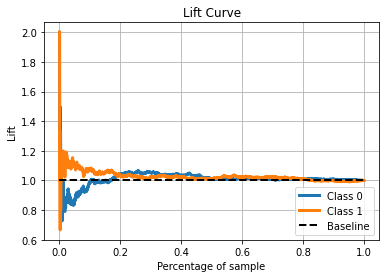

------------------------------------------------------------------------------------------------
Clf_10
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.52      0.51      1200
           1       0.51      0.50      0.50      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



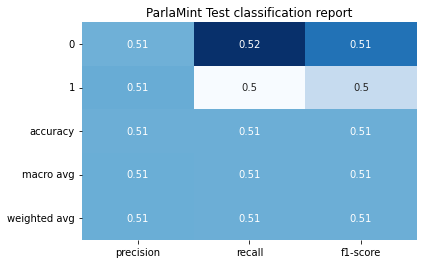


------------------------
  Confusion Matrix
------------------------


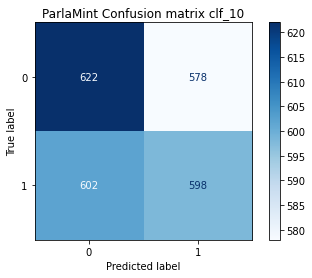

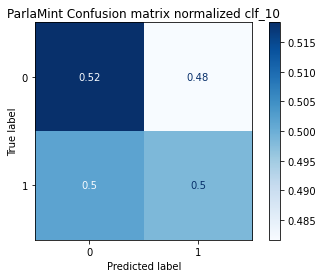

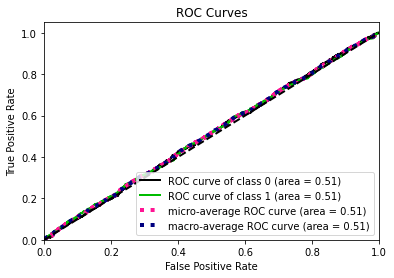

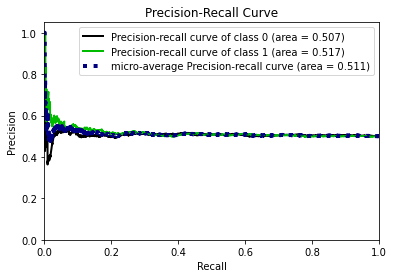

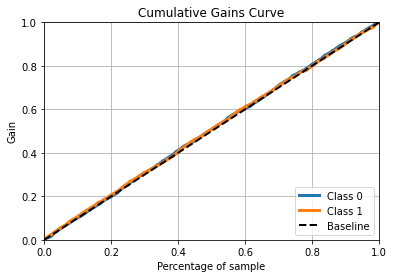

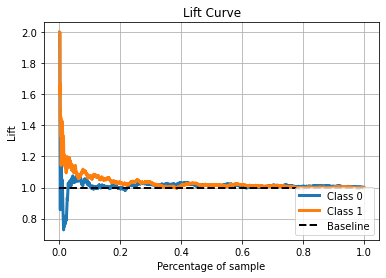

------------------------------------------------------------------------------------------------
Clf_11
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.51      0.51      1200
           1       0.51      0.50      0.51      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



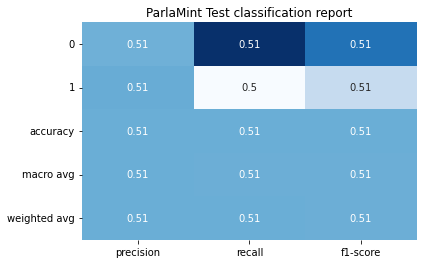


------------------------
  Confusion Matrix
------------------------


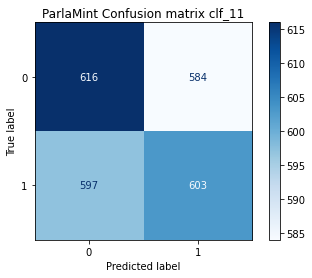

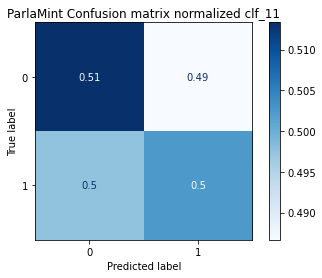

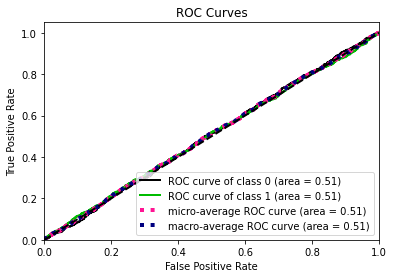

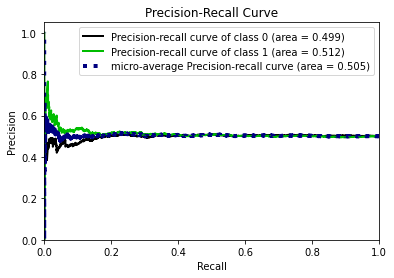

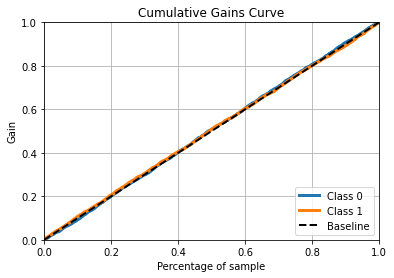

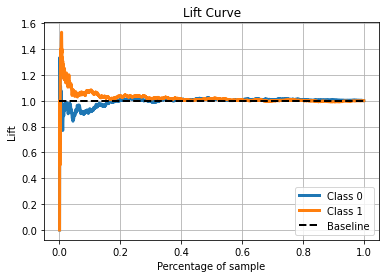

------------------------------------------------------------------------------------------------
Clf_12
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.49      0.50      0.50      1200
           1       0.49      0.49      0.49      1200

    accuracy                           0.49      2400
   macro avg       0.49      0.49      0.49      2400
weighted avg       0.49      0.49      0.49      2400



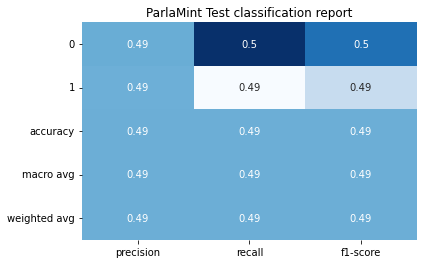


------------------------
  Confusion Matrix
------------------------


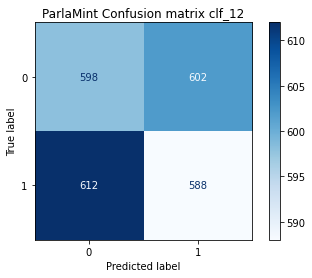

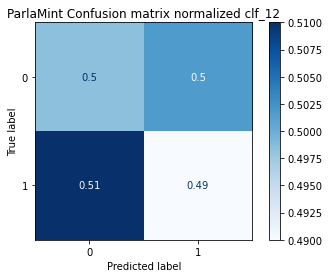

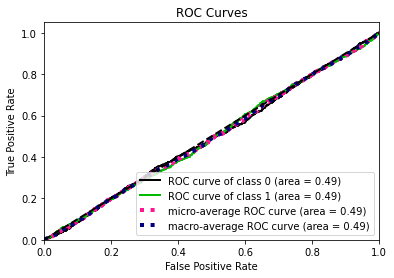

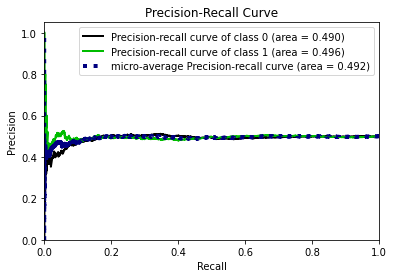

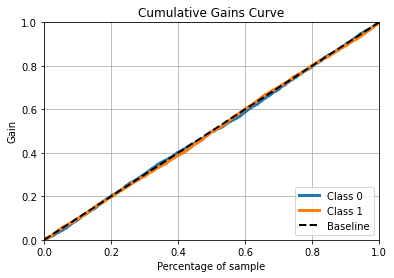

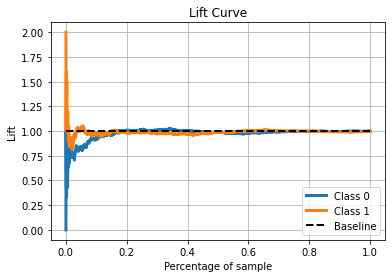

------------------------------------------------------------------------------------------------


In [17]:
lista_cm_normalizzate_svm_5, lista_clf_report_5 = \
        plot_classification_results(diz_dist_5_svm['df_dist_5'], False, diz_cmap['5'])

Clf_1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.51      0.51      1200
           1       0.51      0.51      0.51      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



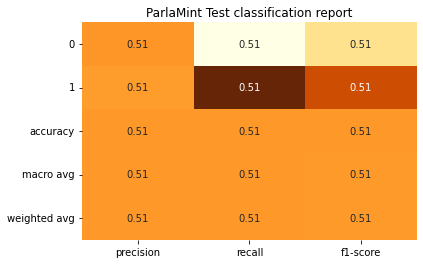


------------------------
  Confusion Matrix
------------------------


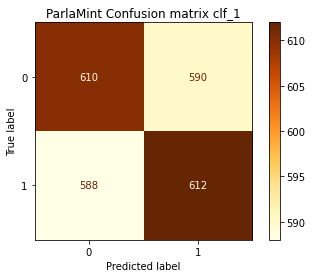

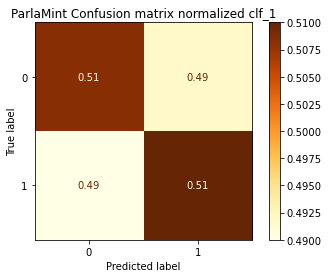

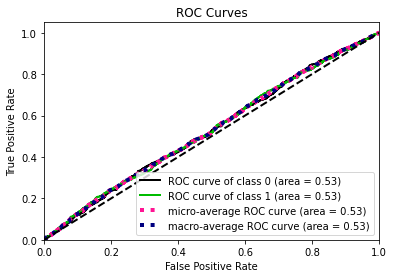

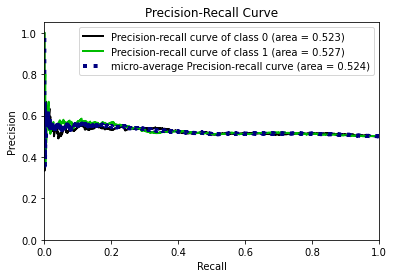

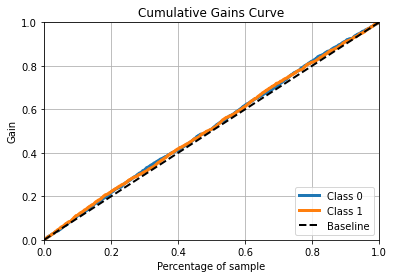

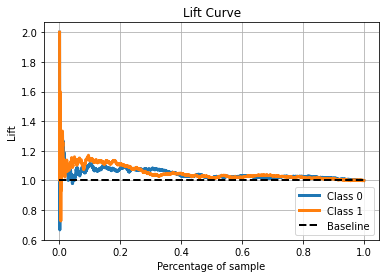

------------------------------------------------------------------------------------------------
Clf_2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.53      0.52      1200
           1       0.51      0.49      0.50      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



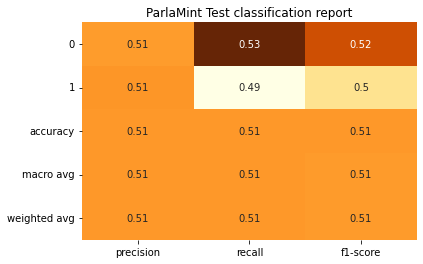


------------------------
  Confusion Matrix
------------------------


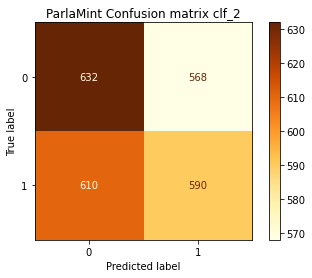

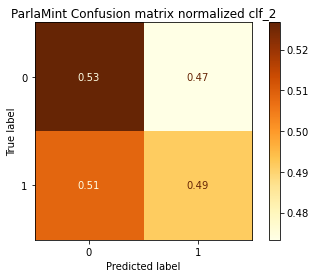

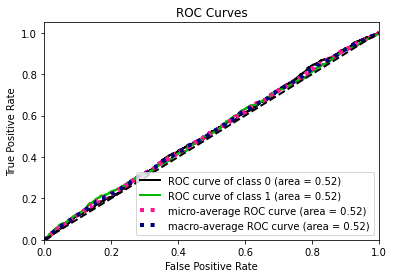

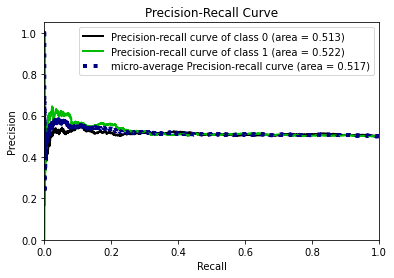

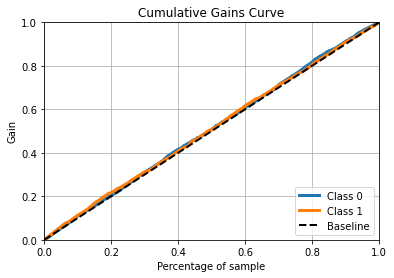

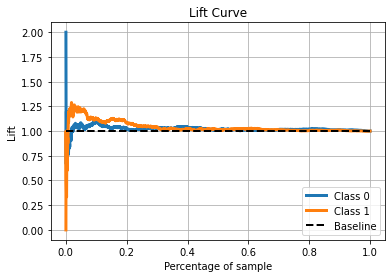

------------------------------------------------------------------------------------------------
Clf_3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.53      0.53      1200
           1       0.52      0.51      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



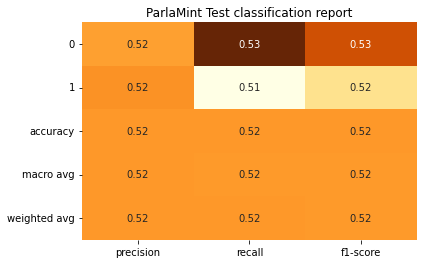


------------------------
  Confusion Matrix
------------------------


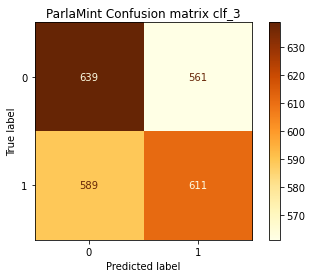

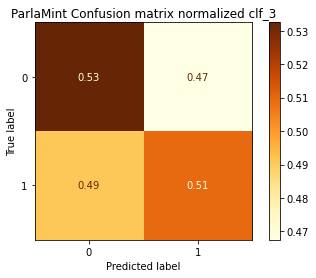

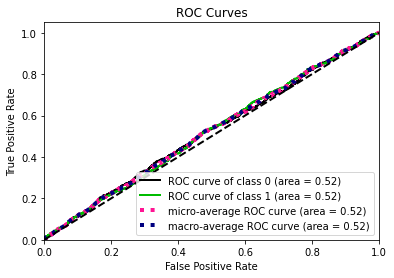

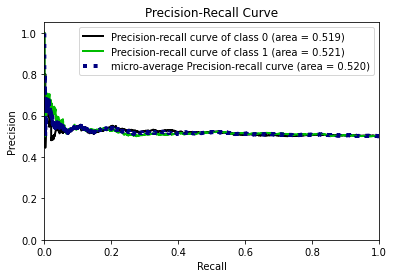

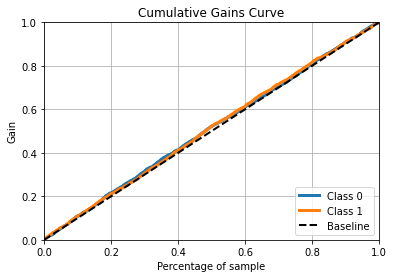

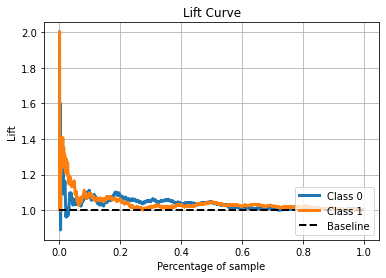

------------------------------------------------------------------------------------------------
Clf_4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.53      0.52      1200
           1       0.51      0.49      0.50      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



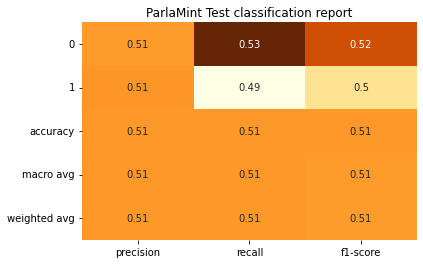


------------------------
  Confusion Matrix
------------------------


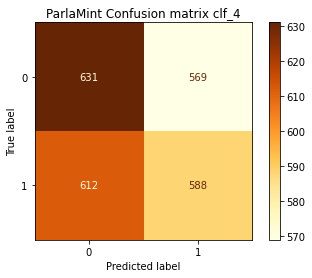

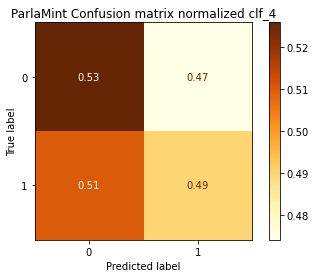

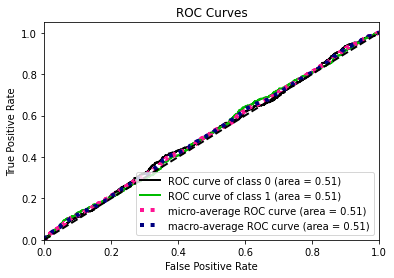

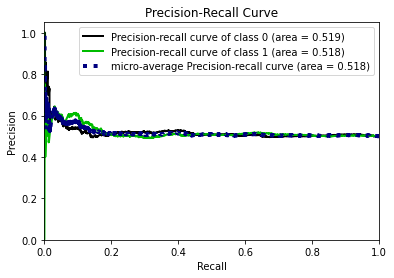

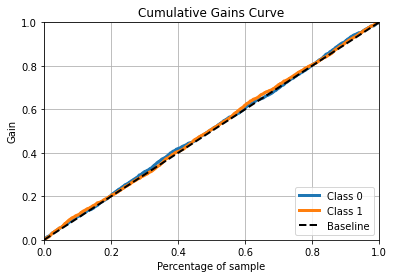

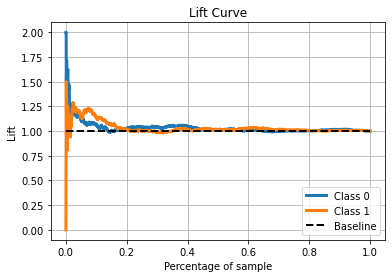

------------------------------------------------------------------------------------------------
Clf_5
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      0.51      0.50      1200
           1       0.50      0.50      0.50      1200

    accuracy                           0.50      2400
   macro avg       0.50      0.50      0.50      2400
weighted avg       0.50      0.50      0.50      2400



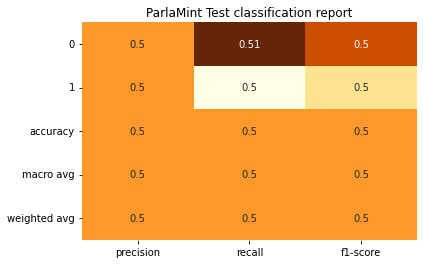


------------------------
  Confusion Matrix
------------------------


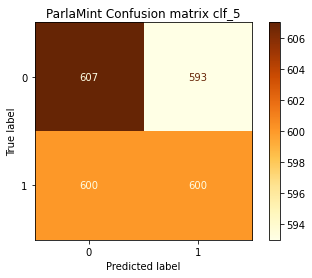

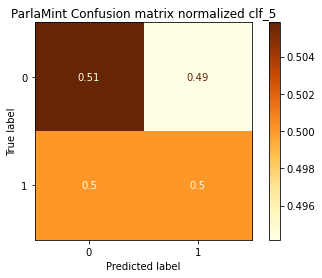

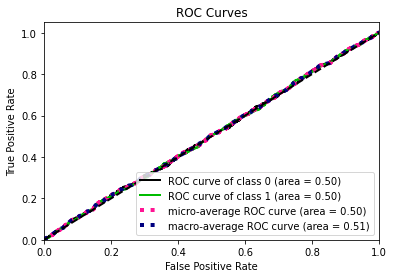

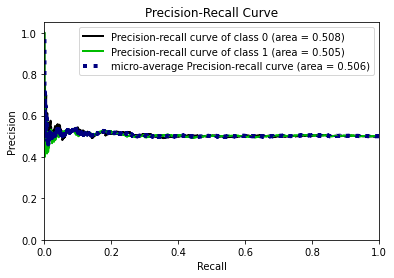

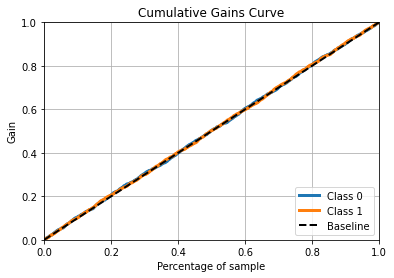

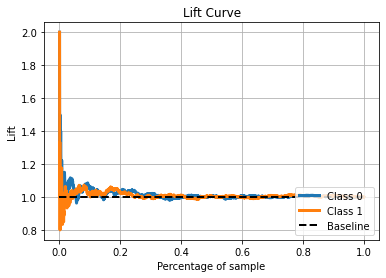

------------------------------------------------------------------------------------------------
Clf_6
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.53      0.52      1200
           1       0.52      0.51      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



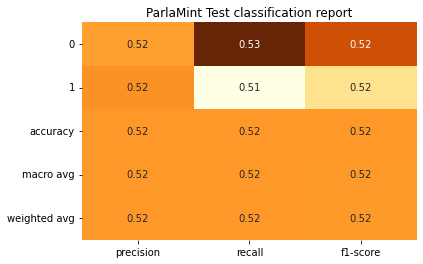


------------------------
  Confusion Matrix
------------------------


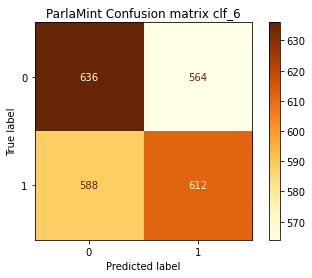

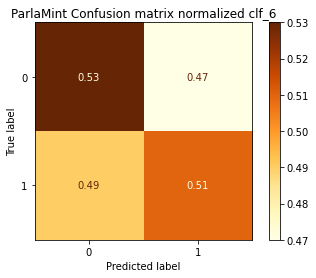

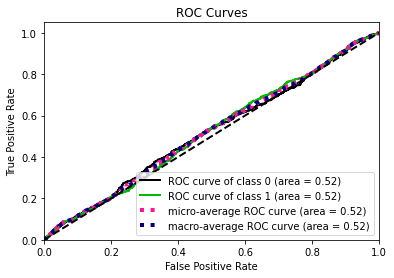

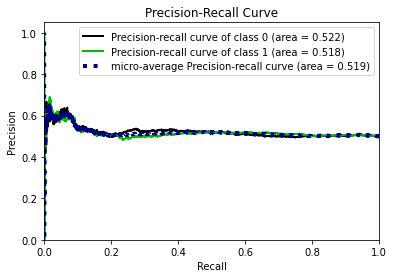

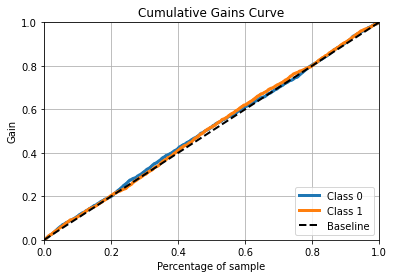

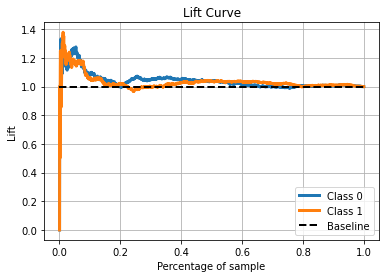

------------------------------------------------------------------------------------------------
Clf_7
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.53      0.52      1200
           1       0.51      0.50      0.50      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



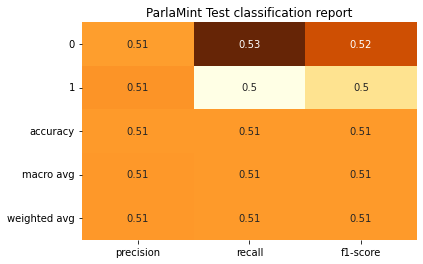


------------------------
  Confusion Matrix
------------------------


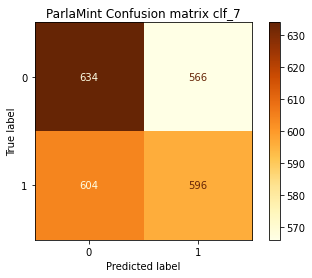

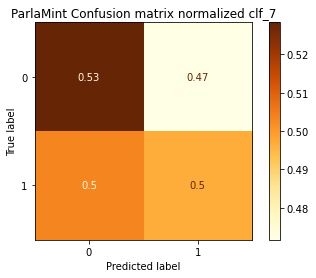

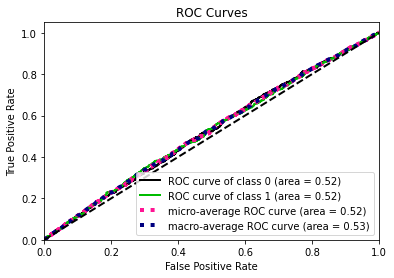

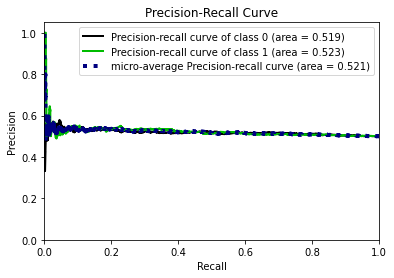

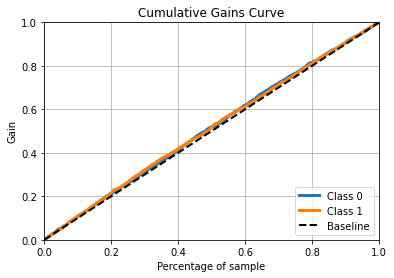

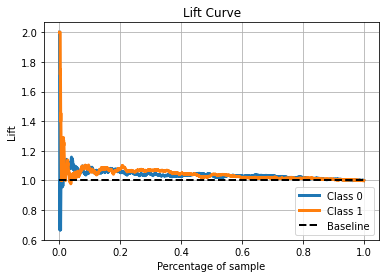

------------------------------------------------------------------------------------------------
Clf_8
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.53      0.53      1200
           1       0.53      0.52      0.52      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



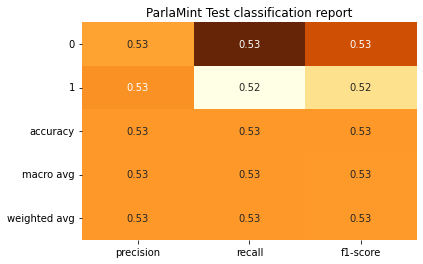


------------------------
  Confusion Matrix
------------------------


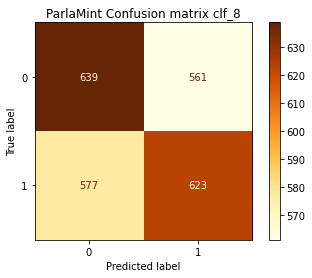

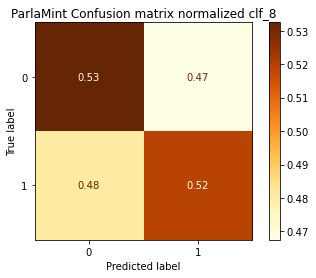

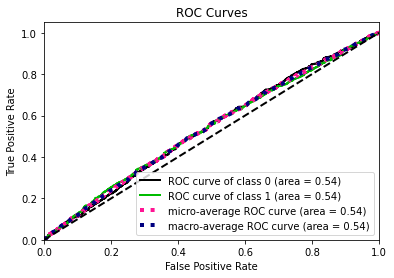

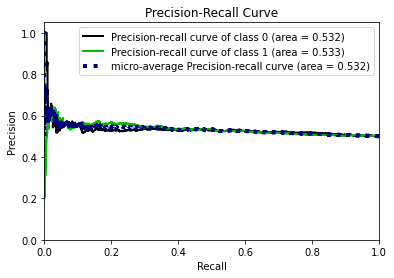

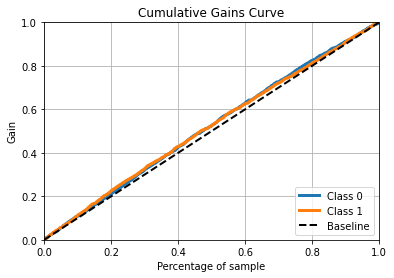

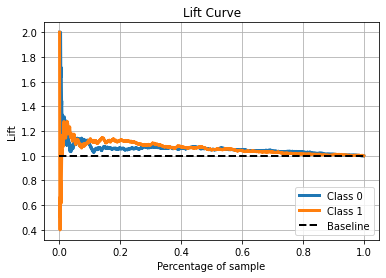

------------------------------------------------------------------------------------------------
Clf_9
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.55      0.53      1200
           1       0.52      0.49      0.51      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



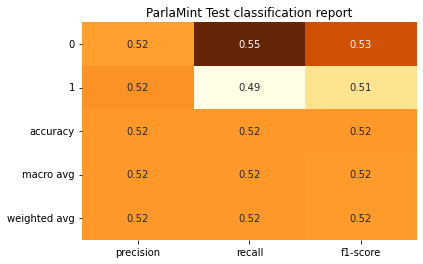


------------------------
  Confusion Matrix
------------------------


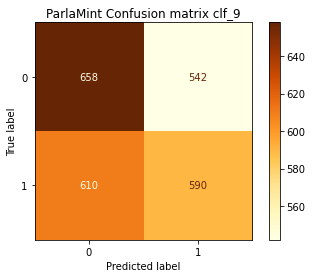

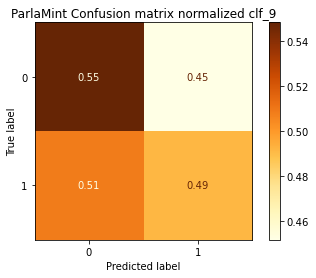

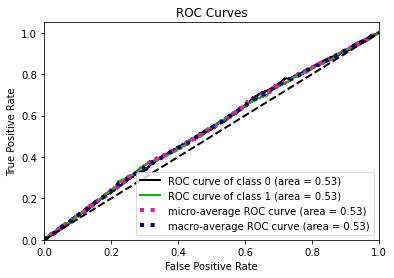

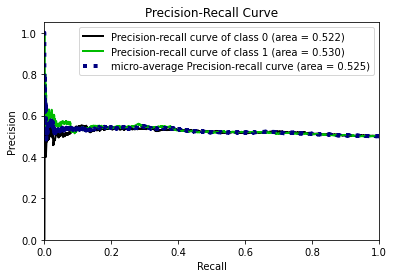

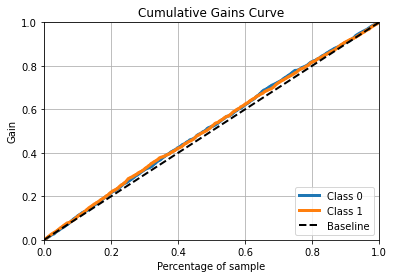

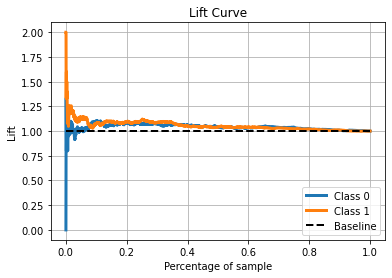

------------------------------------------------------------------------------------------------
Clf_10
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.55      0.57      0.56      1200
           1       0.55      0.53      0.54      1200

    accuracy                           0.55      2400
   macro avg       0.55      0.55      0.55      2400
weighted avg       0.55      0.55      0.55      2400



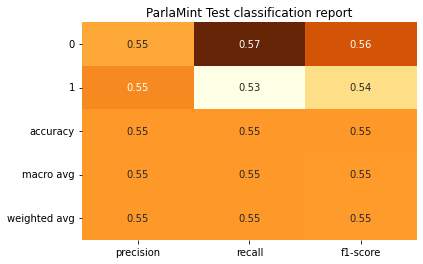


------------------------
  Confusion Matrix
------------------------


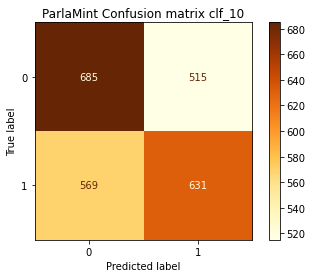

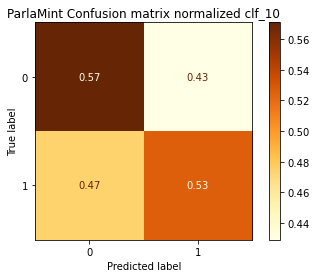

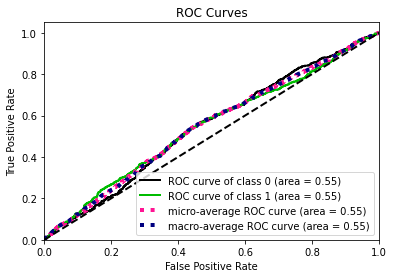

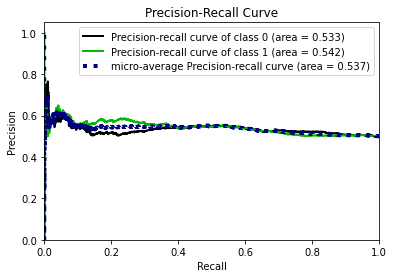

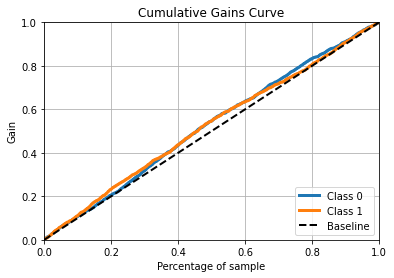

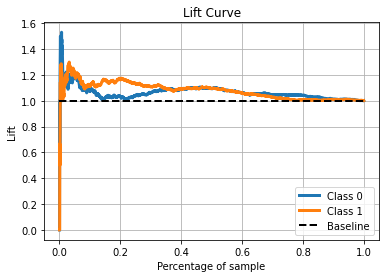

------------------------------------------------------------------------------------------------
Clf_11
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.55      0.54      1200
           1       0.53      0.52      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



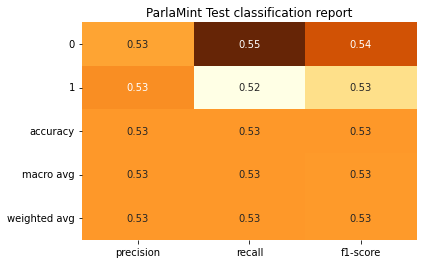


------------------------
  Confusion Matrix
------------------------


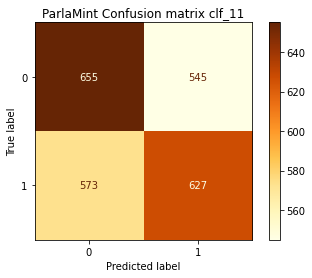

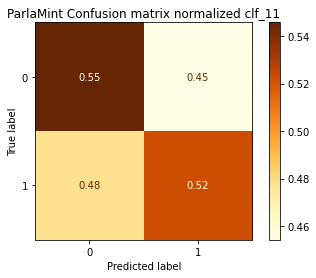

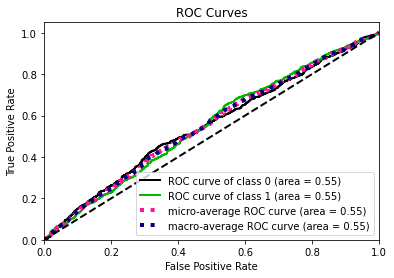

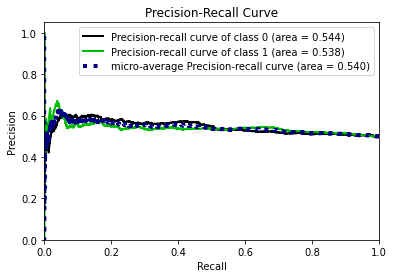

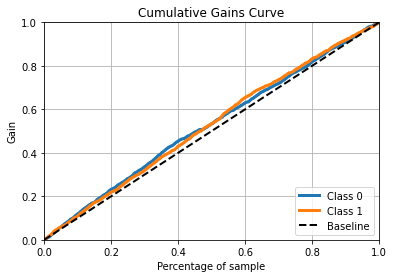

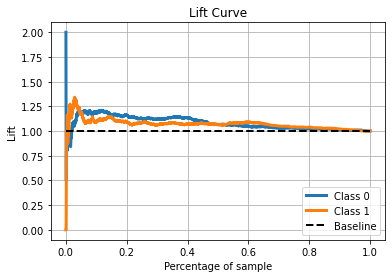

------------------------------------------------------------------------------------------------
Clf_12
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.56      0.54      1200
           1       0.53      0.50      0.51      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



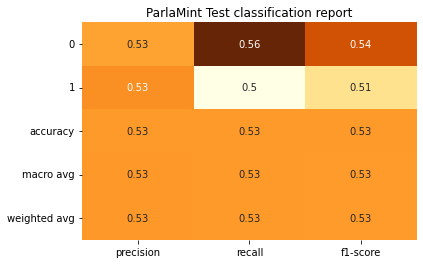


------------------------
  Confusion Matrix
------------------------


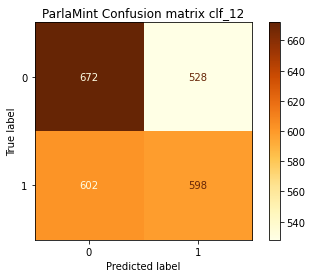

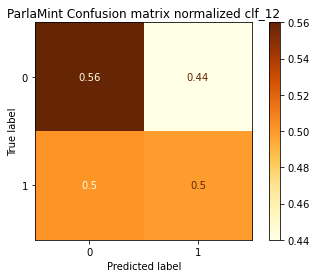

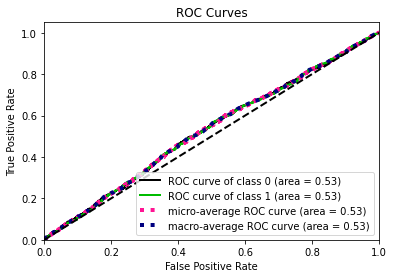

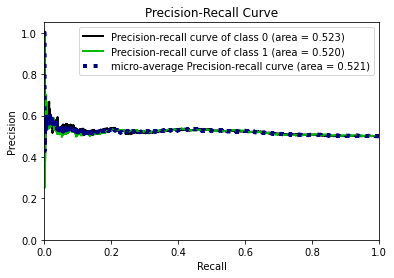

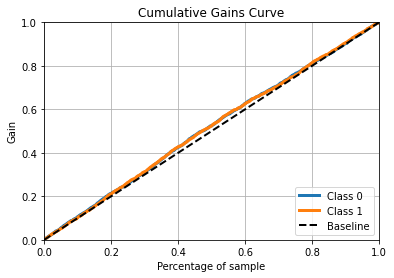

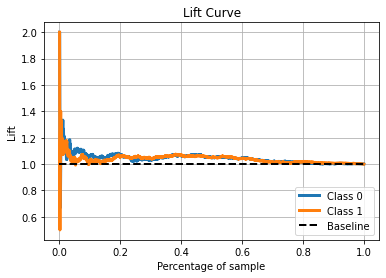

------------------------------------------------------------------------------------------------


In [18]:
lista_cm_normalizzate_svm_10, lista_clf_report_10 = \
        plot_classification_results(diz_dist_10_svm['df_dist_10'], False, diz_cmap['10'])

Clf_1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.55      0.54      1200
           1       0.53      0.50      0.51      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



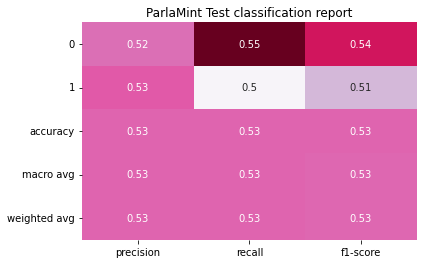


------------------------
  Confusion Matrix
------------------------


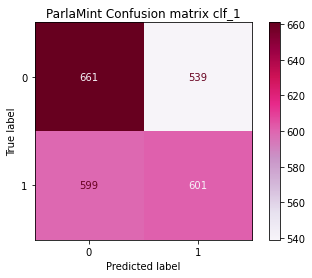

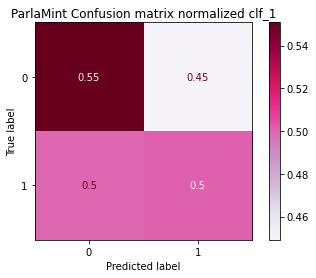

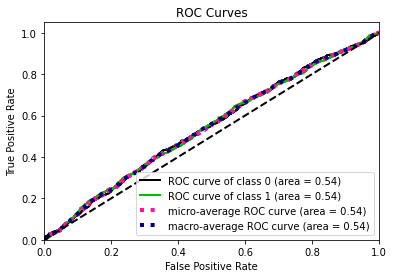

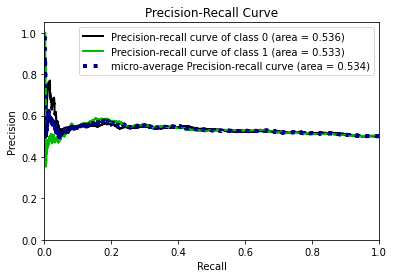

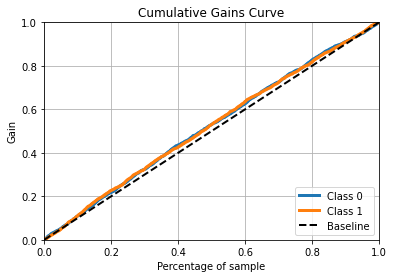

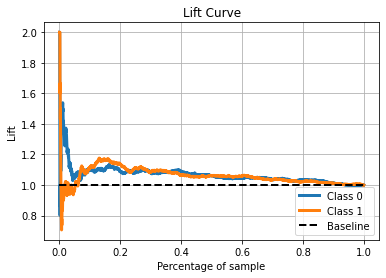

------------------------------------------------------------------------------------------------
Clf_2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.53      0.53      1200
           1       0.53      0.53      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



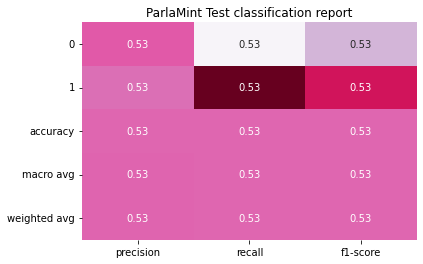


------------------------
  Confusion Matrix
------------------------


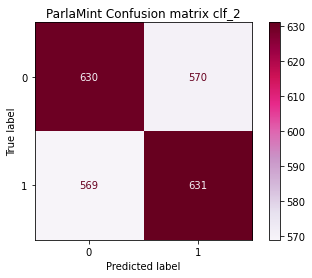

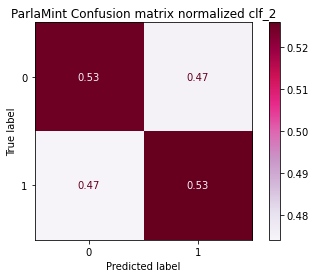

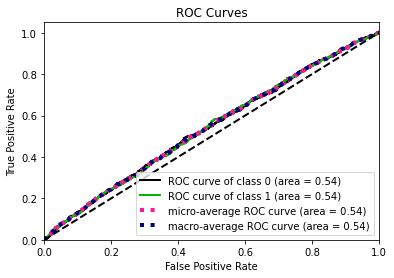

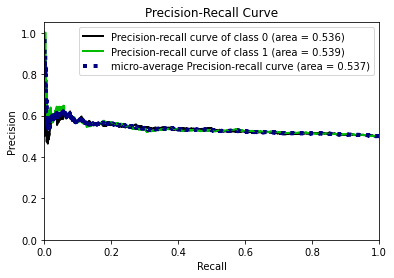

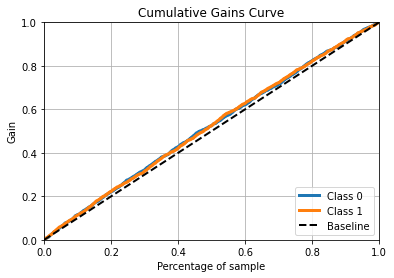

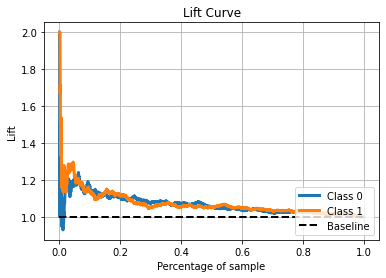

------------------------------------------------------------------------------------------------
Clf_3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.53      0.52      1200
           1       0.52      0.50      0.51      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



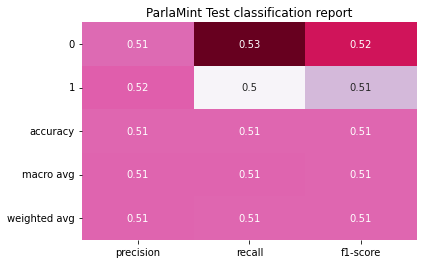


------------------------
  Confusion Matrix
------------------------


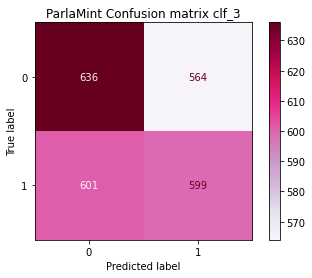

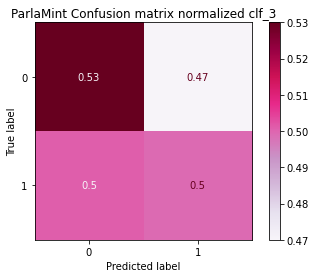

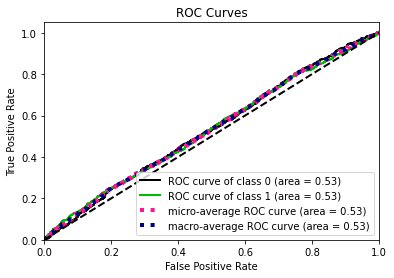

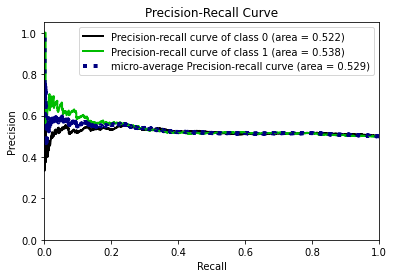

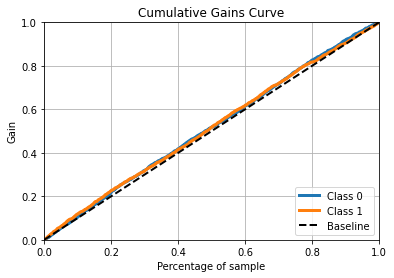

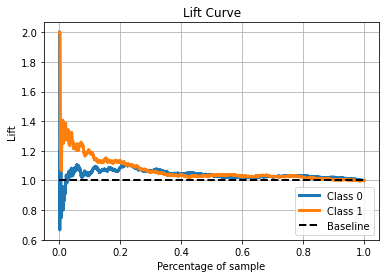

------------------------------------------------------------------------------------------------
Clf_4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.55      0.54      1200
           1       0.54      0.52      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



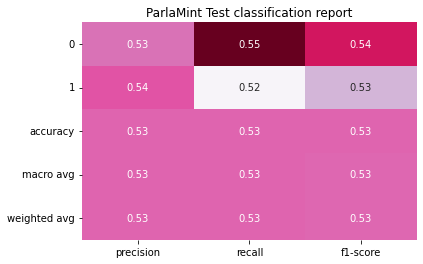


------------------------
  Confusion Matrix
------------------------


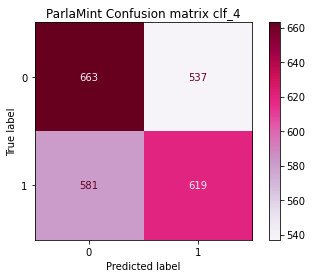

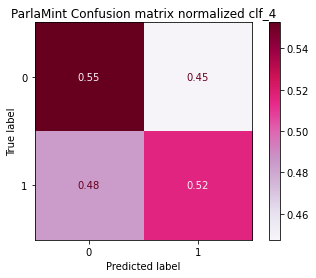

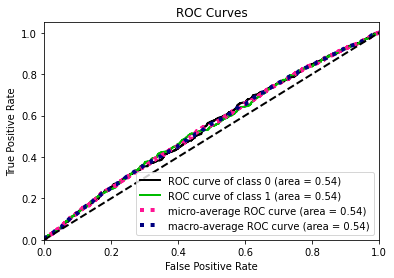

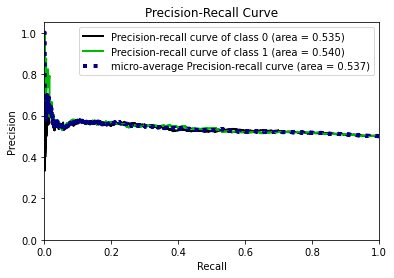

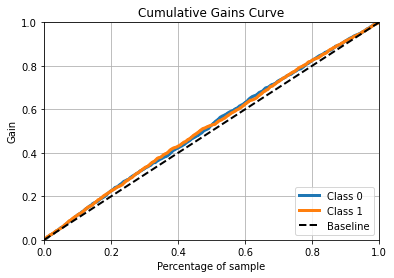

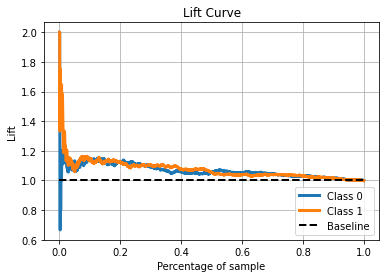

------------------------------------------------------------------------------------------------
Clf_5
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.54      0.53      1200
           1       0.53      0.51      0.52      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



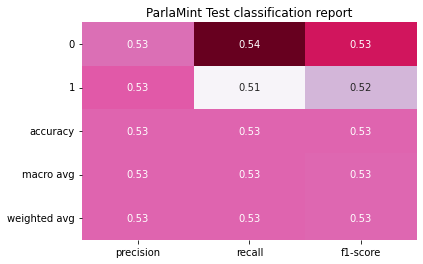


------------------------
  Confusion Matrix
------------------------


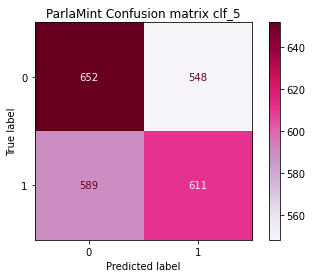

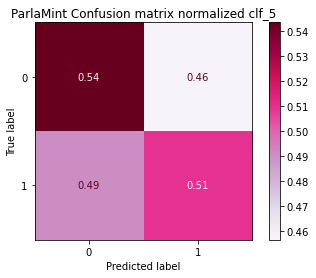

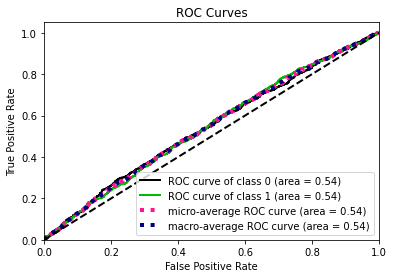

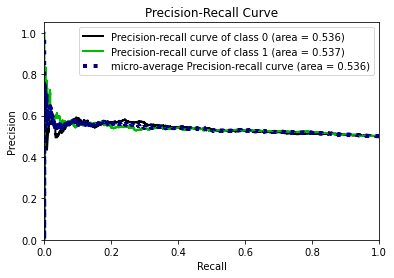

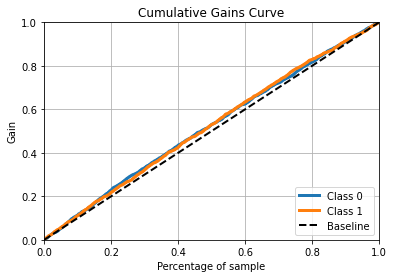

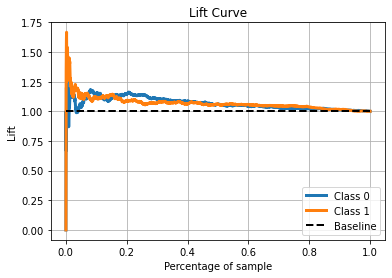

------------------------------------------------------------------------------------------------
Clf_6
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.53      0.53      1200
           1       0.52      0.51      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



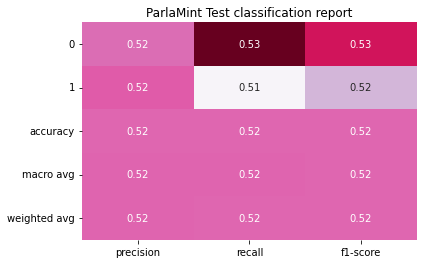


------------------------
  Confusion Matrix
------------------------


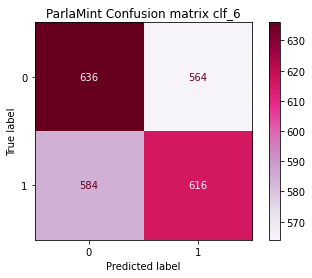

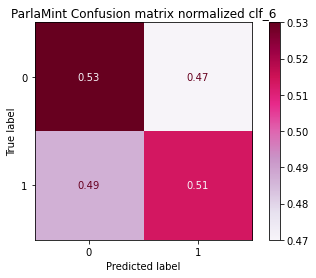

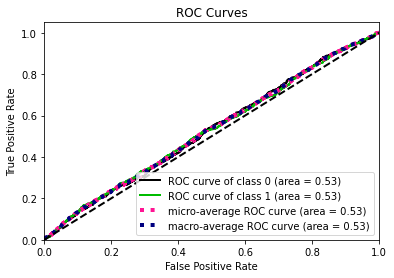

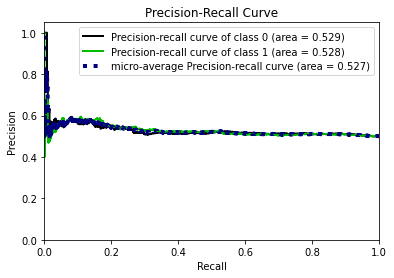

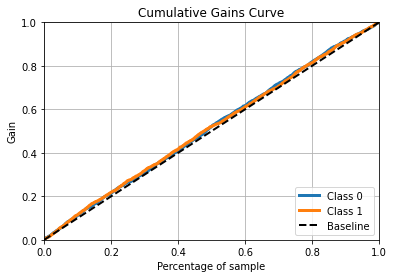

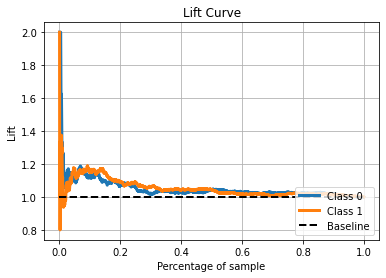

------------------------------------------------------------------------------------------------
Clf_7
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.54      0.53      1200
           1       0.52      0.49      0.50      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



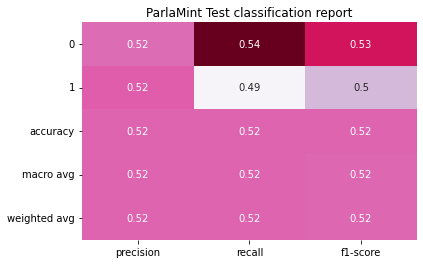


------------------------
  Confusion Matrix
------------------------


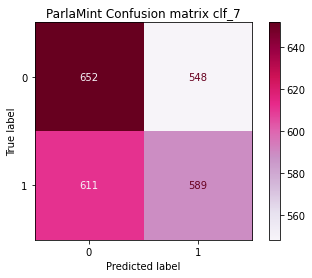

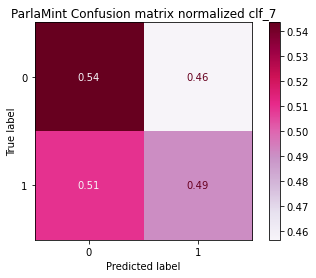

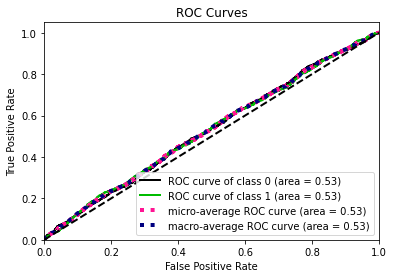

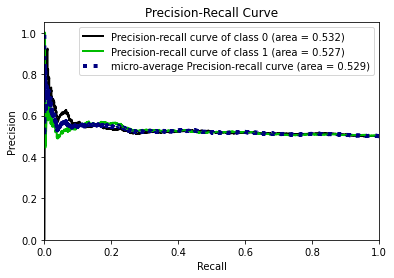

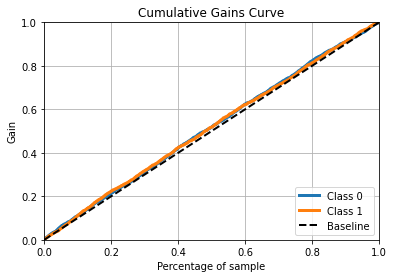

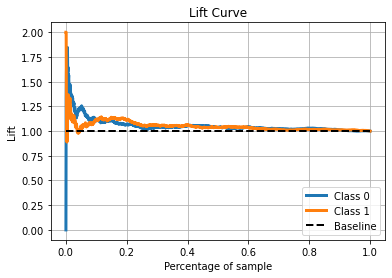

------------------------------------------------------------------------------------------------
Clf_8
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.54      0.56      0.55      1200
           1       0.54      0.52      0.53      1200

    accuracy                           0.54      2400
   macro avg       0.54      0.54      0.54      2400
weighted avg       0.54      0.54      0.54      2400



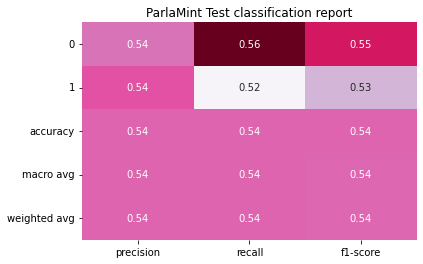


------------------------
  Confusion Matrix
------------------------


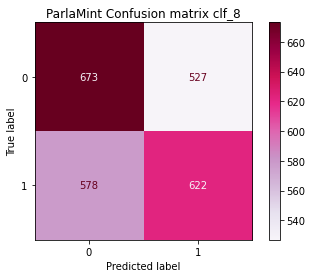

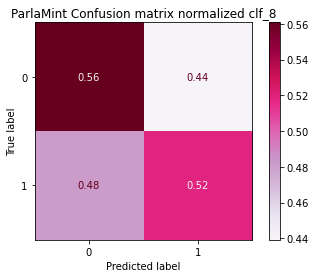

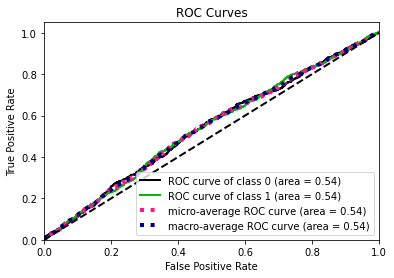

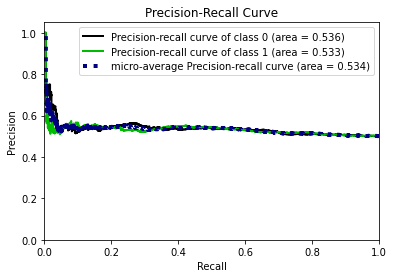

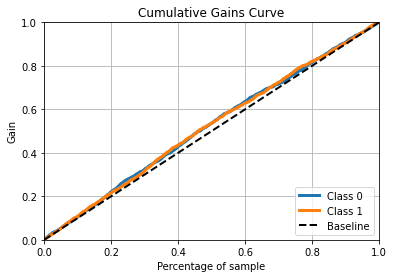

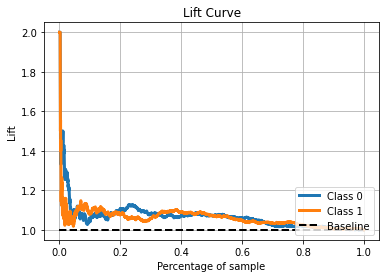

------------------------------------------------------------------------------------------------
Clf_9
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.53      0.53      1200
           1       0.53      0.52      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



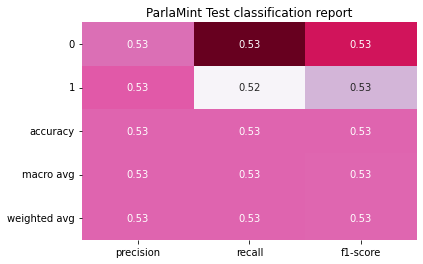


------------------------
  Confusion Matrix
------------------------


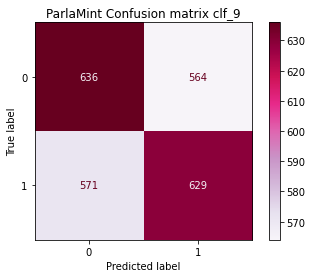

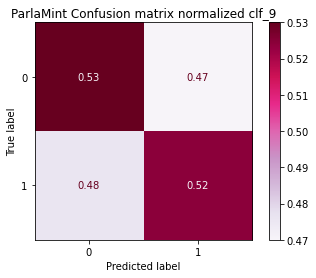

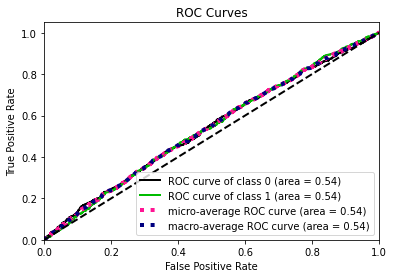

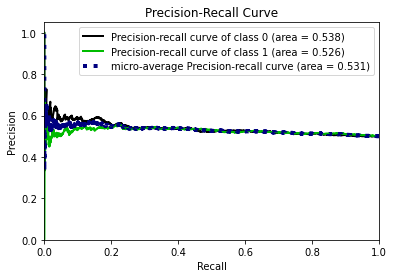

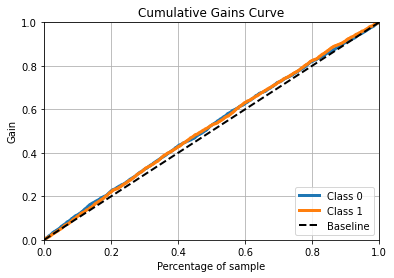

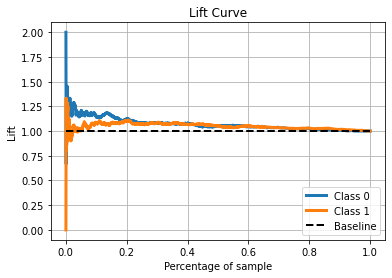

------------------------------------------------------------------------------------------------
Clf_10
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.51      1200
           1       0.51      0.52      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.51      0.51      2400
weighted avg       0.52      0.52      0.51      2400



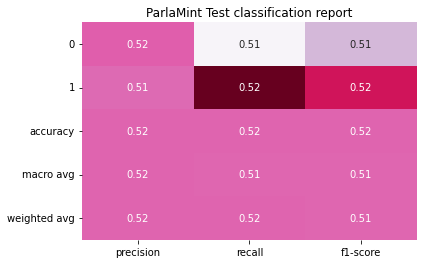


------------------------
  Confusion Matrix
------------------------


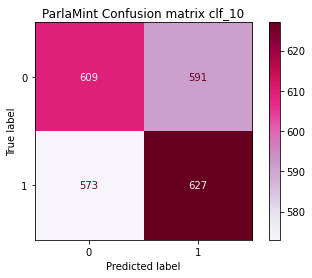

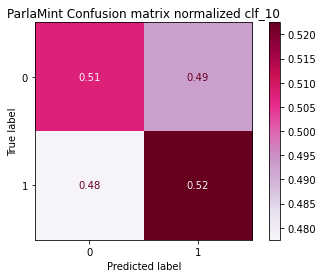

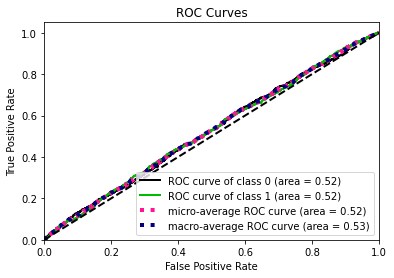

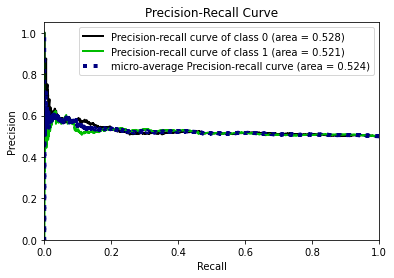

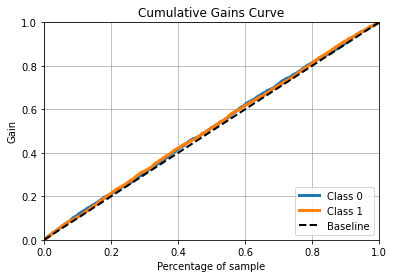

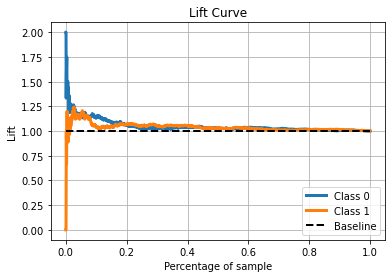

------------------------------------------------------------------------------------------------
Clf_11
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.52      1200
           1       0.52      0.53      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



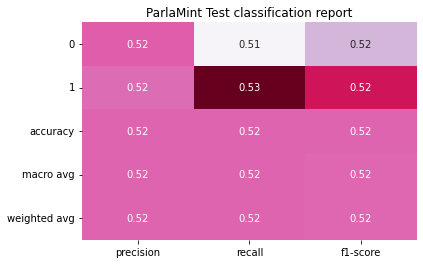


------------------------
  Confusion Matrix
------------------------


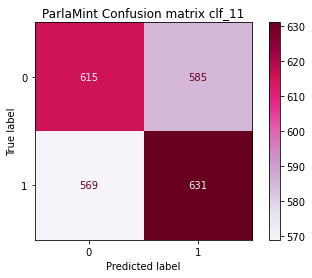

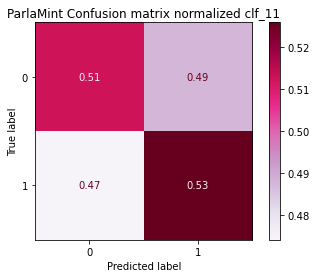

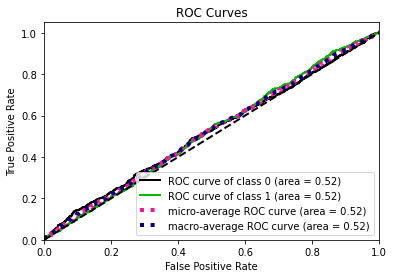

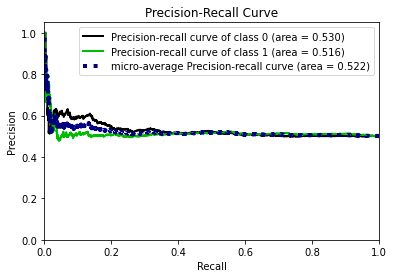

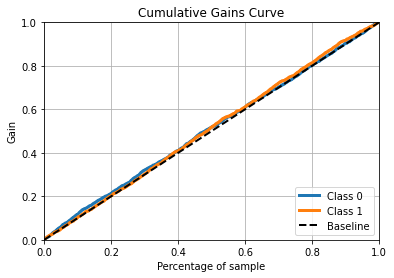

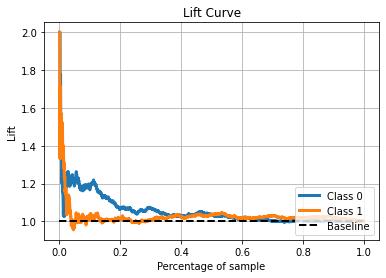

------------------------------------------------------------------------------------------------
Clf_12
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.51      0.52      0.51      1200
           1       0.51      0.50      0.51      1200

    accuracy                           0.51      2400
   macro avg       0.51      0.51      0.51      2400
weighted avg       0.51      0.51      0.51      2400



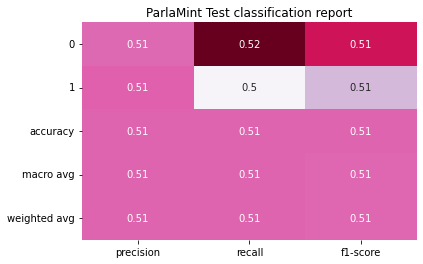


------------------------
  Confusion Matrix
------------------------


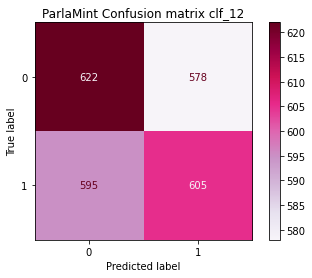

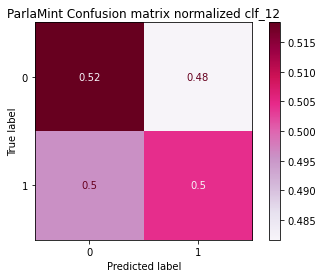

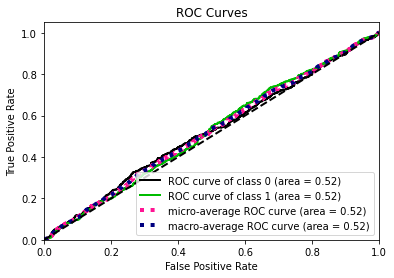

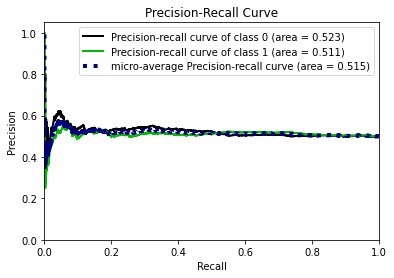

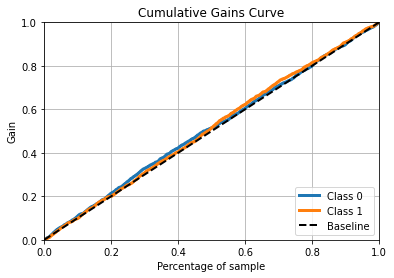

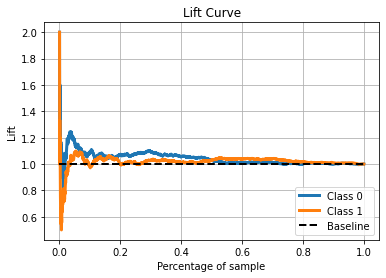

------------------------------------------------------------------------------------------------


In [19]:
lista_cm_normalizzate_svm_20, lista_clf_report_20 = \
        plot_classification_results(diz_dist_20_svm['df_dist_20'], False, diz_cmap['20'])

Clf_1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.54      0.53      1200
           1       0.53      0.53      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



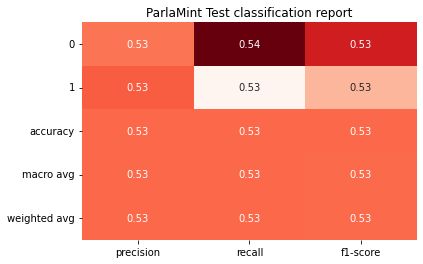


------------------------
  Confusion Matrix
------------------------


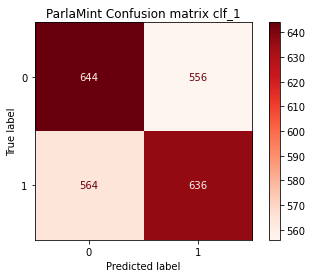

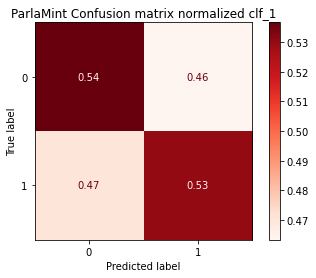

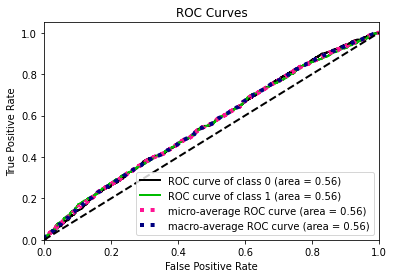

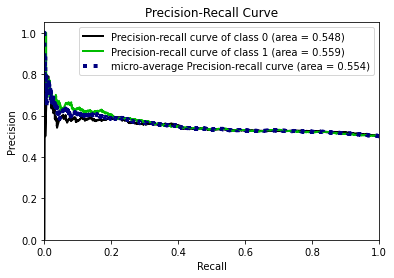

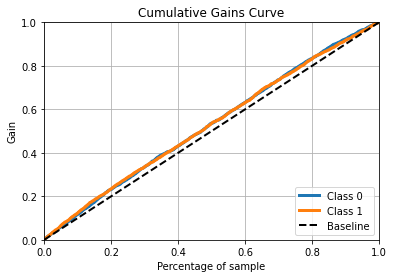

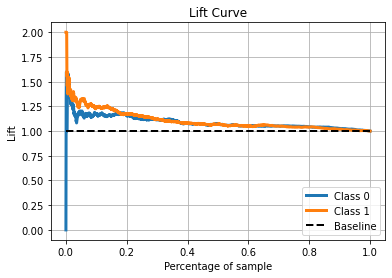

------------------------------------------------------------------------------------------------
Clf_2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.52      1200
           1       0.52      0.54      0.53      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



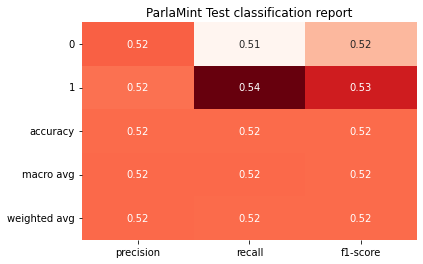


------------------------
  Confusion Matrix
------------------------


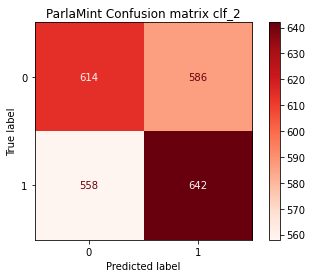

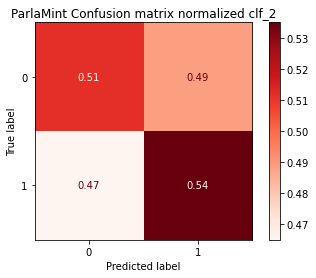

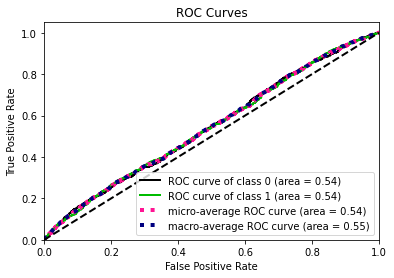

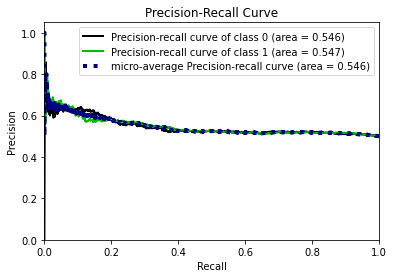

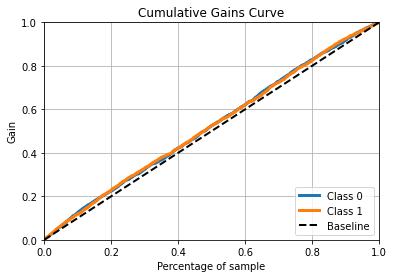

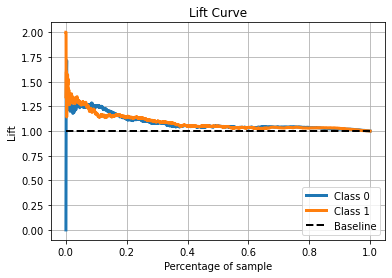

------------------------------------------------------------------------------------------------
Clf_3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.51      1200
           1       0.52      0.53      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



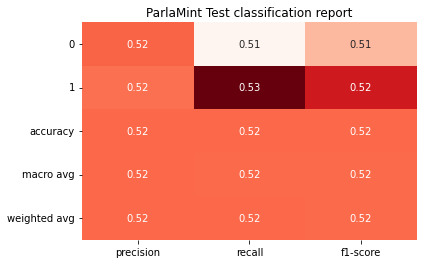


------------------------
  Confusion Matrix
------------------------


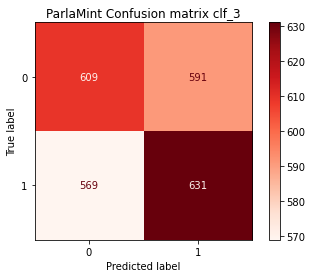

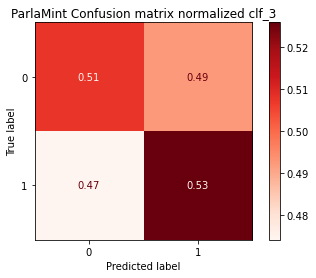

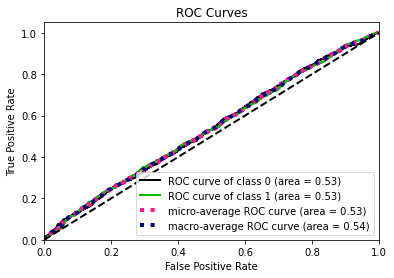

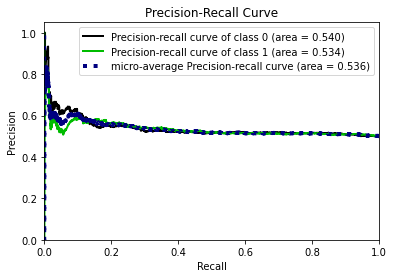

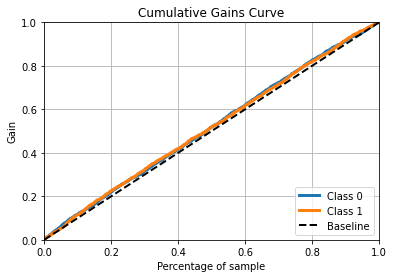

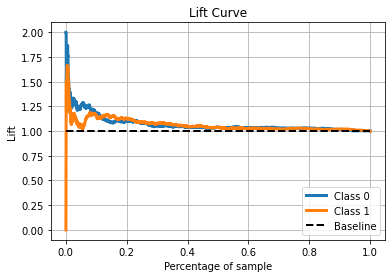

------------------------------------------------------------------------------------------------
Clf_4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.52      1200
           1       0.52      0.53      0.53      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



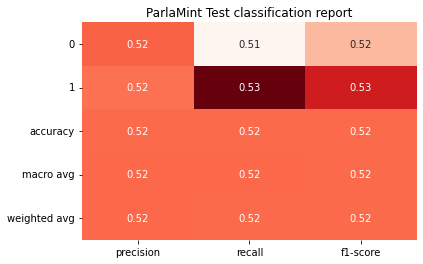


------------------------
  Confusion Matrix
------------------------


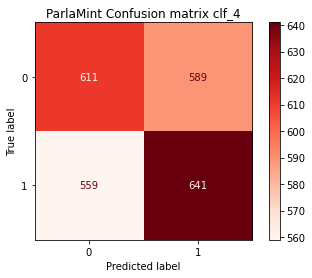

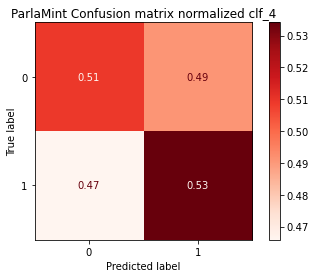

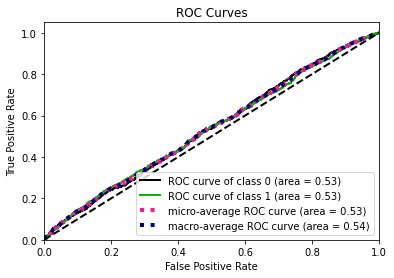

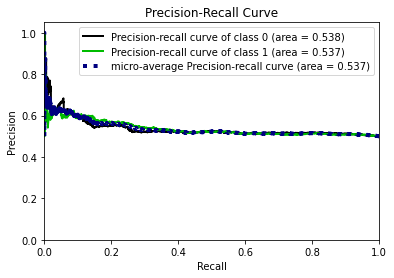

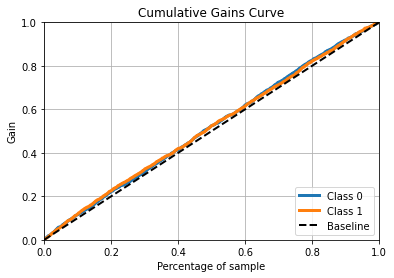

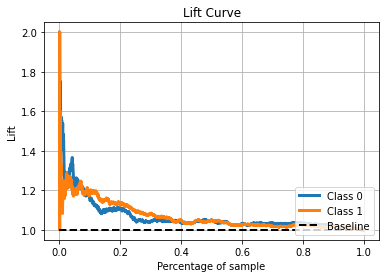

------------------------------------------------------------------------------------------------
Clf_5
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.51      0.51      1200
           1       0.52      0.53      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



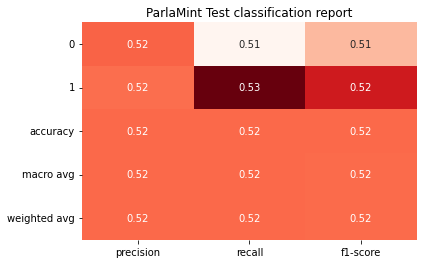


------------------------
  Confusion Matrix
------------------------


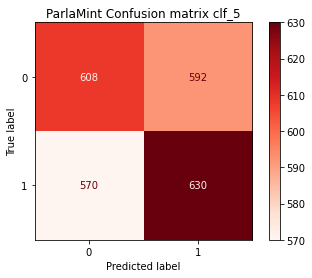

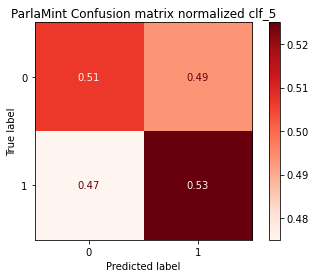

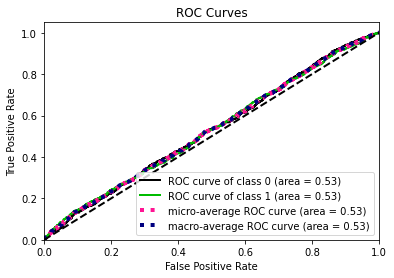

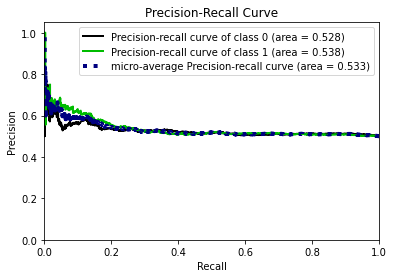

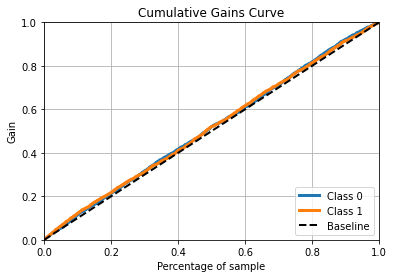

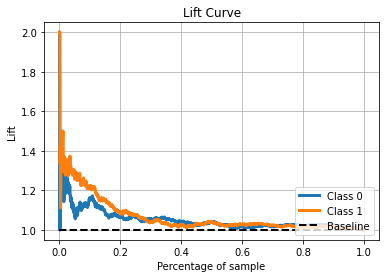

------------------------------------------------------------------------------------------------
Clf_6
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.52      0.52      1200
           1       0.52      0.53      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



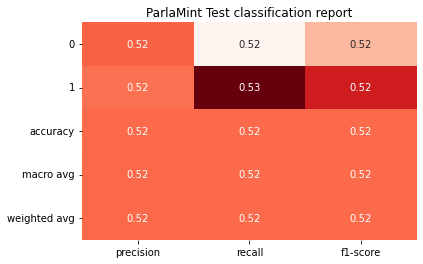


------------------------
  Confusion Matrix
------------------------


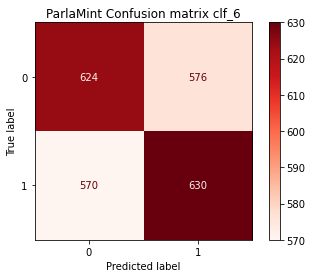

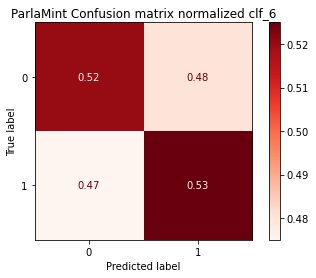

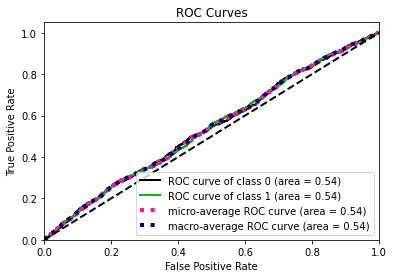

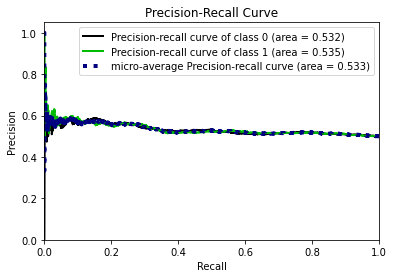

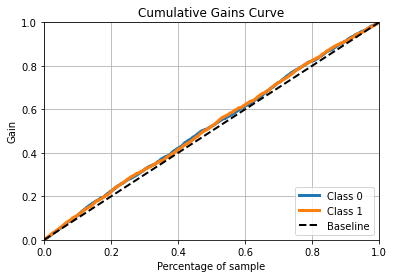

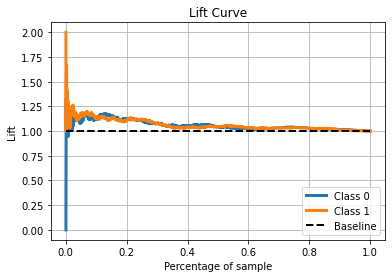

------------------------------------------------------------------------------------------------
Clf_7
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.52      0.52      0.52      1200
           1       0.52      0.53      0.52      1200

    accuracy                           0.52      2400
   macro avg       0.52      0.52      0.52      2400
weighted avg       0.52      0.52      0.52      2400



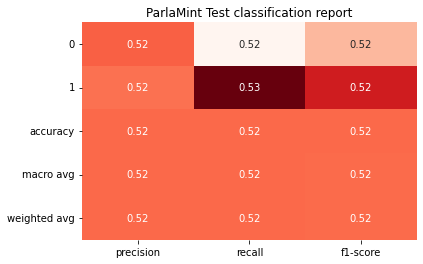


------------------------
  Confusion Matrix
------------------------


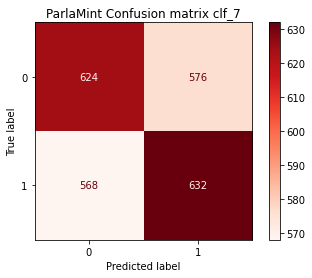

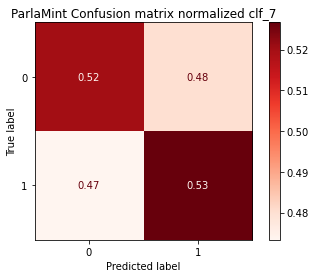

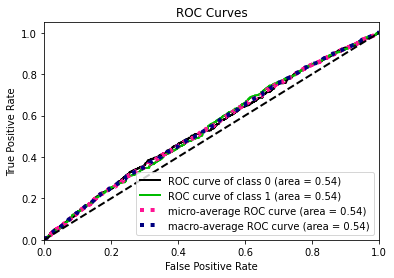

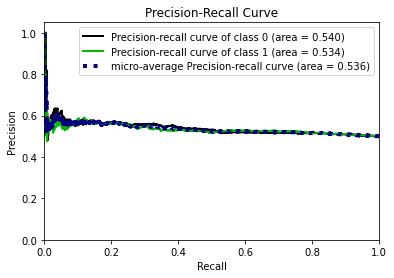

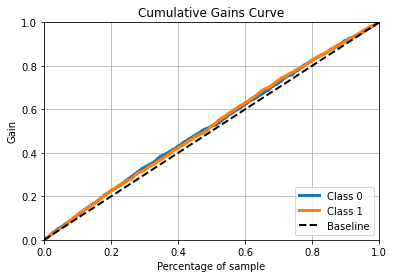

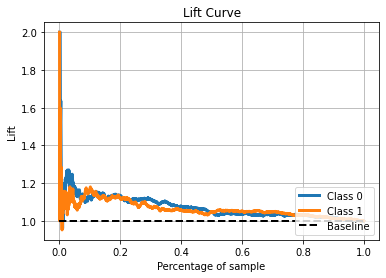

------------------------------------------------------------------------------------------------
Clf_8
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.52      0.52      1200
           1       0.53      0.54      0.54      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



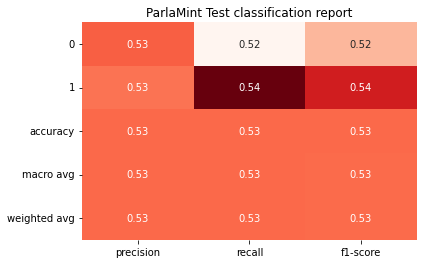


------------------------
  Confusion Matrix
------------------------


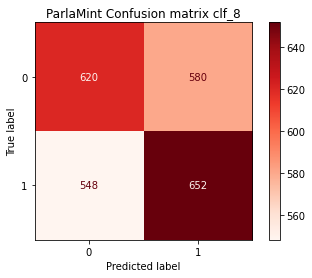

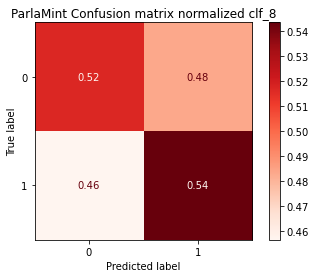

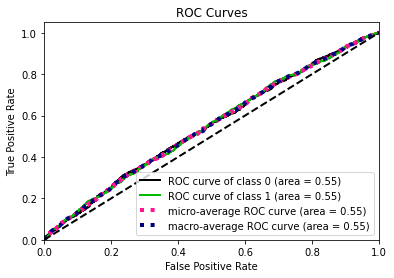

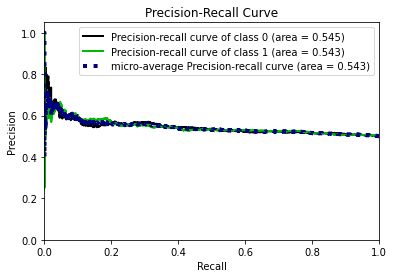

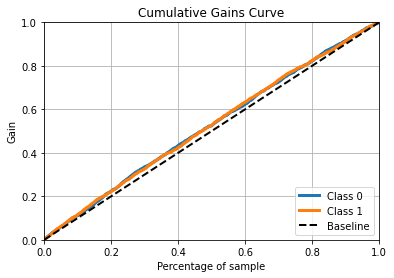

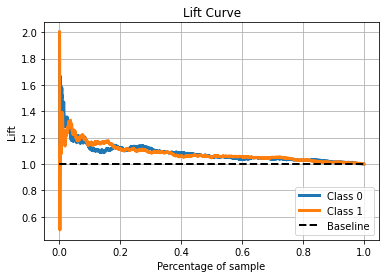

------------------------------------------------------------------------------------------------
Clf_9
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.51      0.52      1200
           1       0.53      0.55      0.54      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



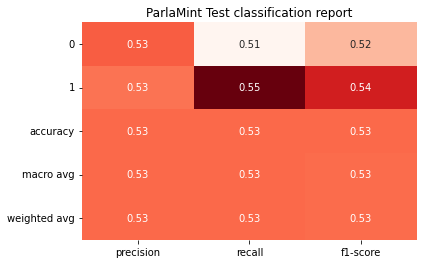


------------------------
  Confusion Matrix
------------------------


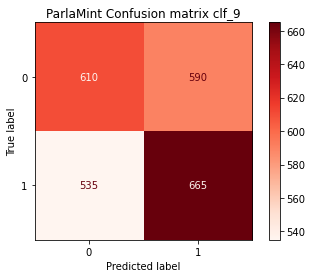

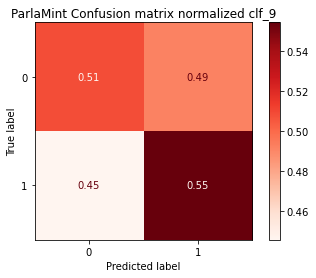

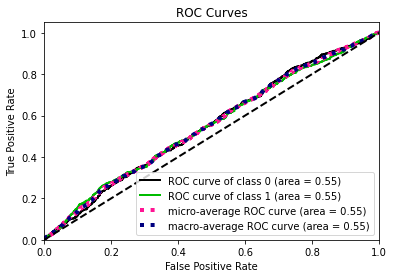

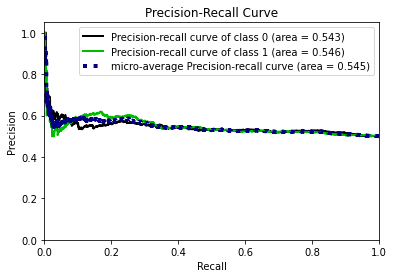

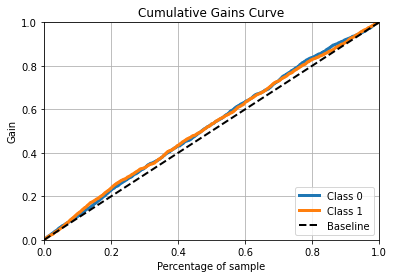

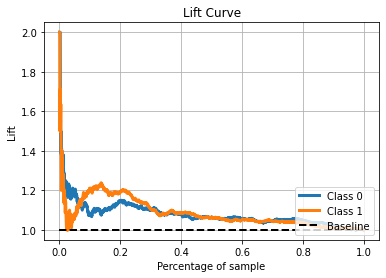

------------------------------------------------------------------------------------------------
Clf_10
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.54      0.51      0.52      1200
           1       0.53      0.56      0.54      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



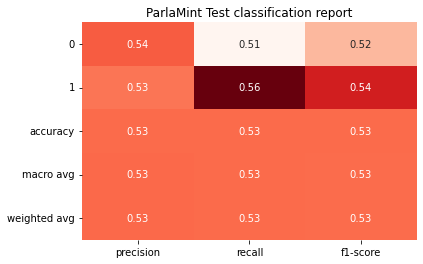


------------------------
  Confusion Matrix
------------------------


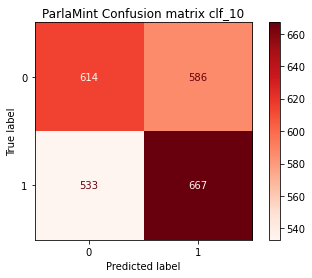

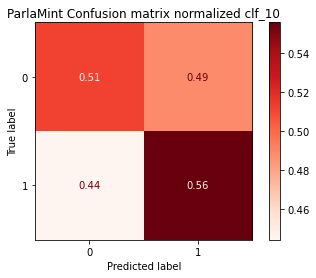

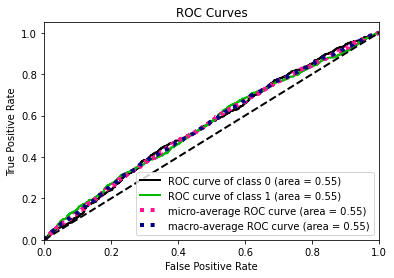

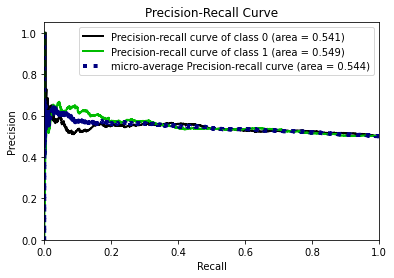

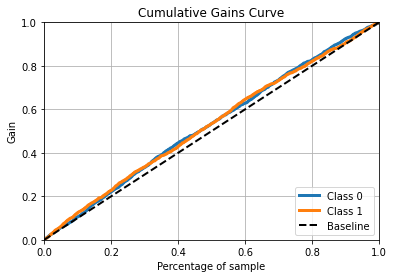

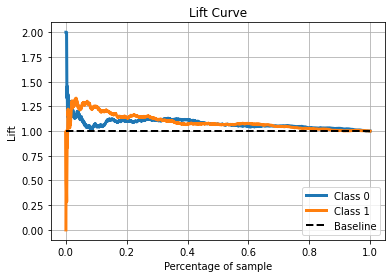

------------------------------------------------------------------------------------------------
Clf_11
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.53      0.51      0.52      1200
           1       0.53      0.54      0.53      1200

    accuracy                           0.53      2400
   macro avg       0.53      0.53      0.53      2400
weighted avg       0.53      0.53      0.53      2400



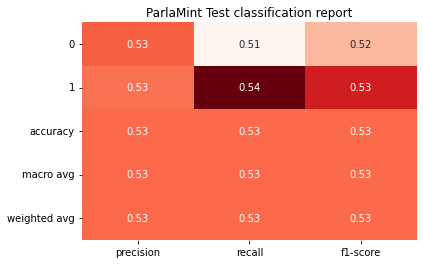


------------------------
  Confusion Matrix
------------------------


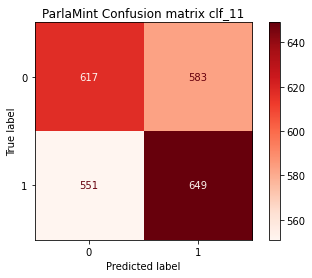

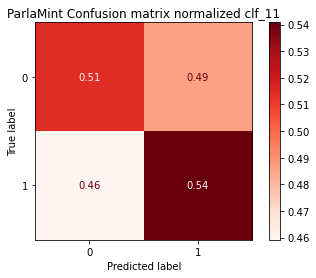

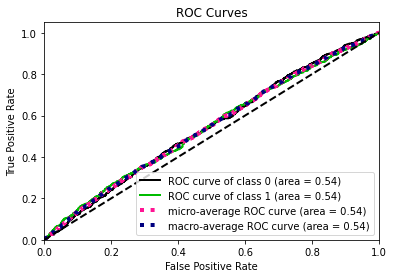

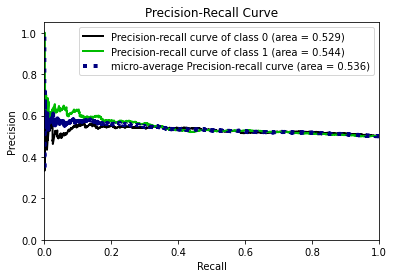

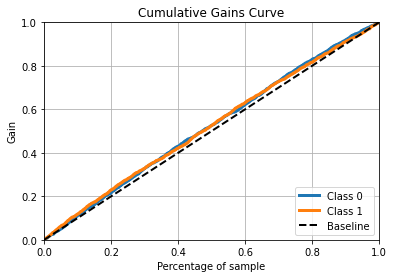

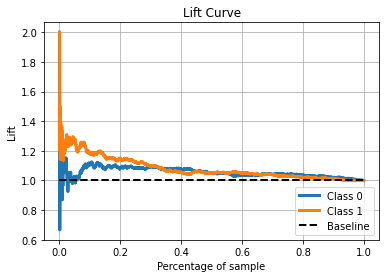

------------------------------------------------------------------------------------------------
Clf_12
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.55      0.54      0.54      1200
           1       0.54      0.55      0.55      1200

    accuracy                           0.54      2400
   macro avg       0.54      0.54      0.54      2400
weighted avg       0.54      0.54      0.54      2400



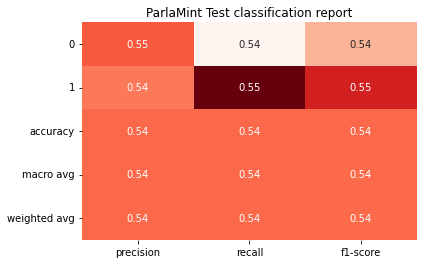


------------------------
  Confusion Matrix
------------------------


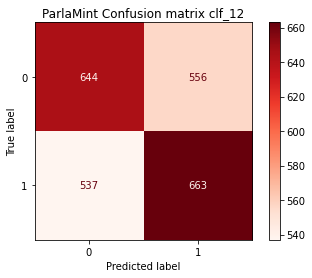

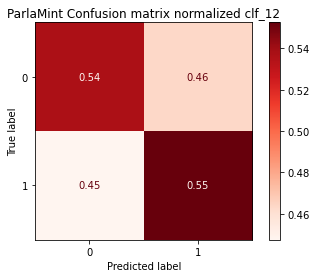

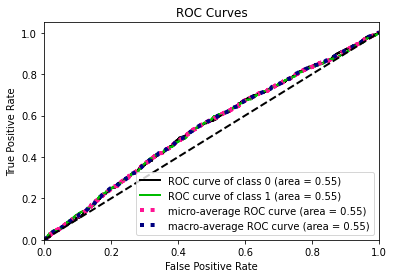

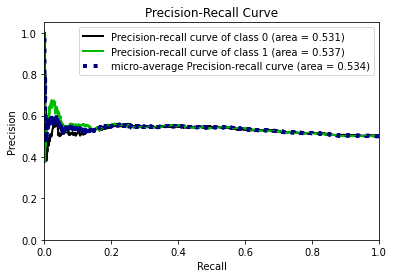

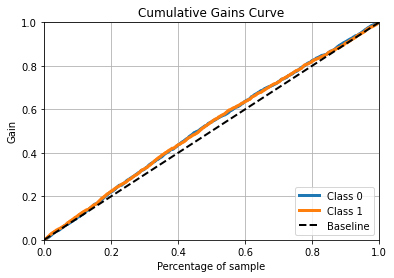

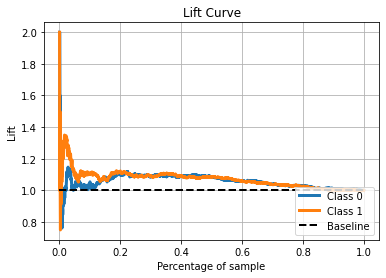

------------------------------------------------------------------------------------------------


In [20]:
lista_cm_normalizzate_svm_30, lista_clf_report_30 = \
        plot_classification_results(diz_dist_30_svm['df_dist_30'], False, diz_cmap['30'])

Clf_1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.66      0.63      1200
           1       0.62      0.57      0.60      1200

    accuracy                           0.61      2400
   macro avg       0.61      0.61      0.61      2400
weighted avg       0.61      0.61      0.61      2400



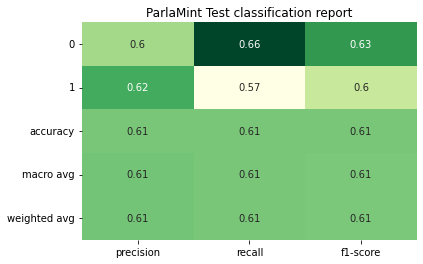


------------------------
  Confusion Matrix
------------------------


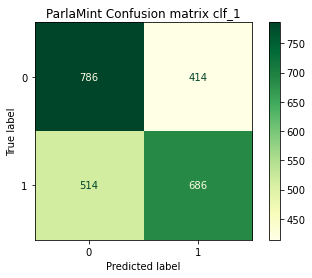

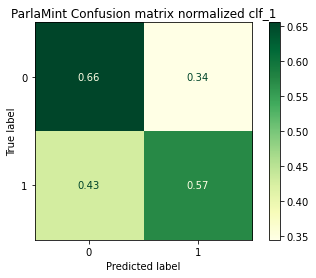

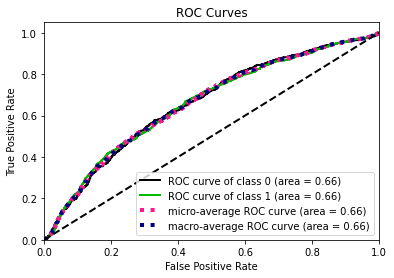

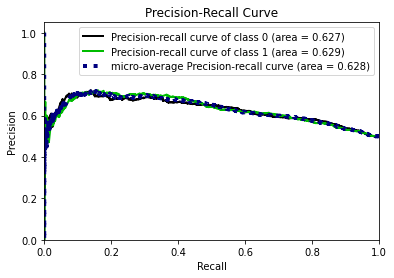

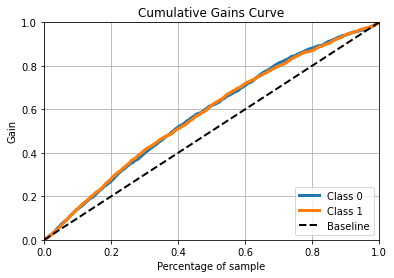

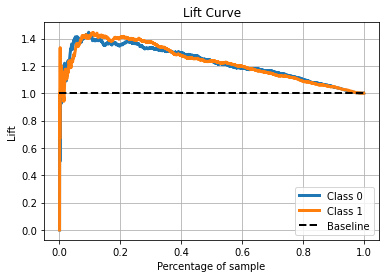

------------------------------------------------------------------------------------------------
Clf_2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.66      0.63      1200
           1       0.62      0.57      0.60      1200

    accuracy                           0.61      2400
   macro avg       0.61      0.61      0.61      2400
weighted avg       0.61      0.61      0.61      2400



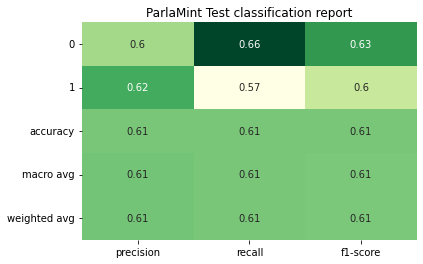


------------------------
  Confusion Matrix
------------------------


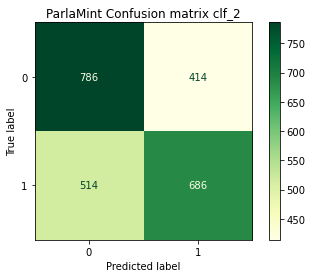

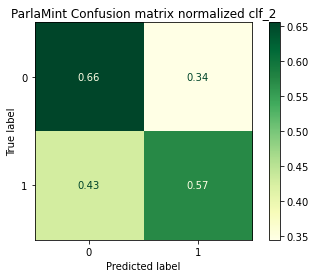

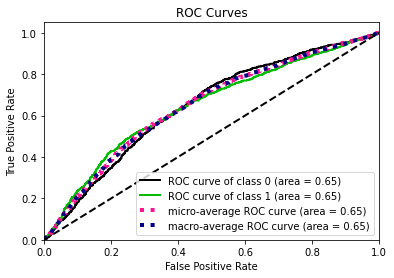

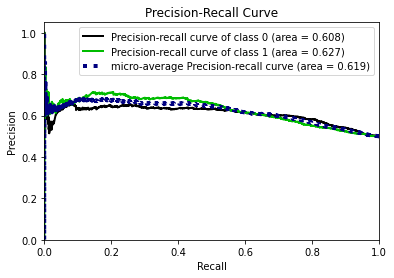

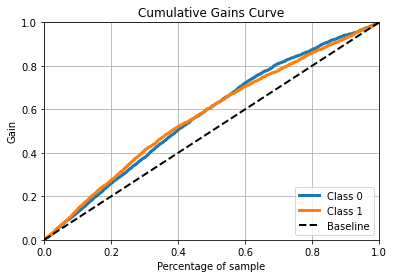

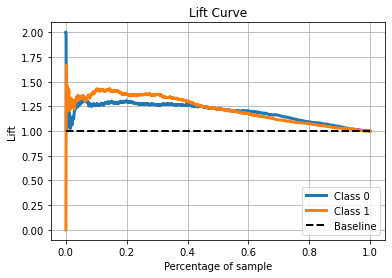

------------------------------------------------------------------------------------------------
Clf_3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.59      0.65      0.62      1200
           1       0.62      0.56      0.58      1200

    accuracy                           0.60      2400
   macro avg       0.61      0.60      0.60      2400
weighted avg       0.61      0.60      0.60      2400



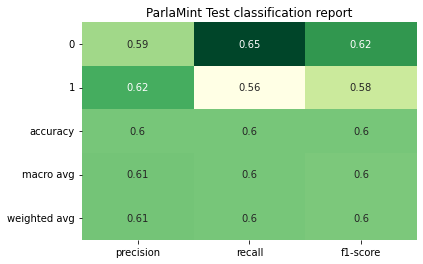


------------------------
  Confusion Matrix
------------------------


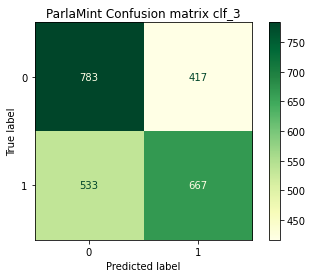

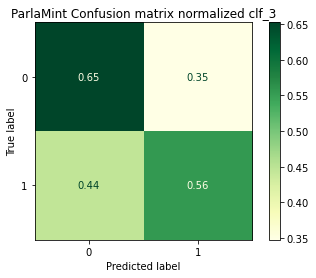

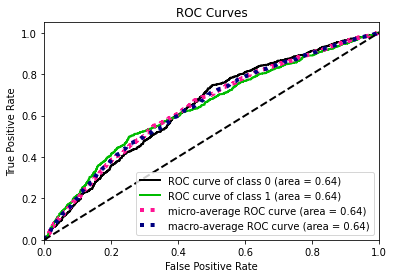

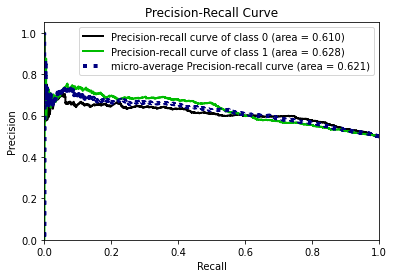

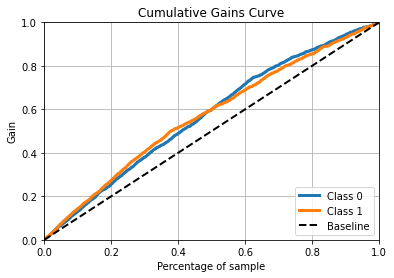

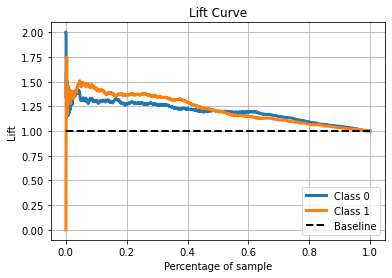

------------------------------------------------------------------------------------------------
Clf_4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.65      0.62      1200
           1       0.62      0.57      0.59      1200

    accuracy                           0.61      2400
   macro avg       0.61      0.61      0.61      2400
weighted avg       0.61      0.61      0.61      2400



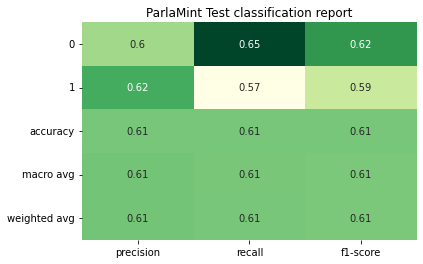


------------------------
  Confusion Matrix
------------------------


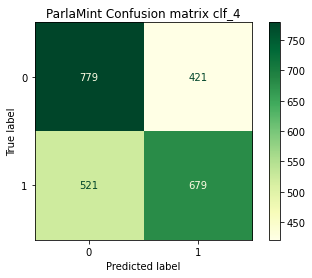

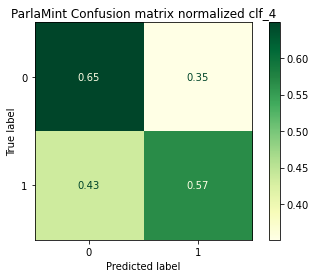

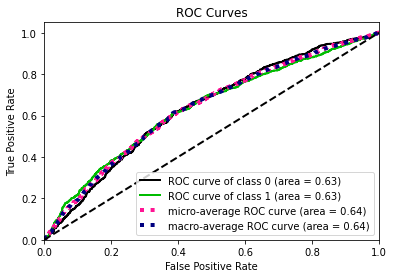

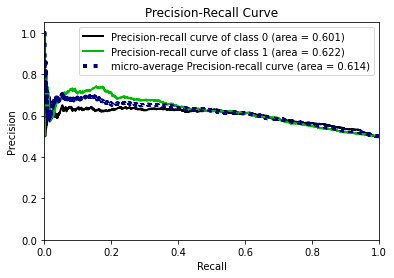

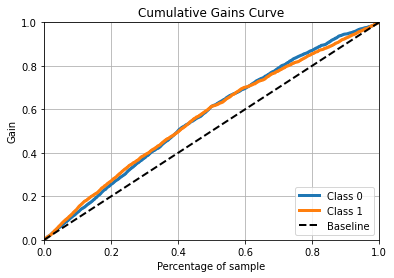

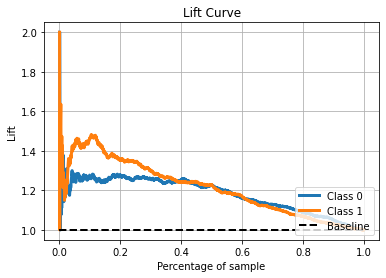

------------------------------------------------------------------------------------------------
Clf_5
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.59      0.64      0.62      1200
           1       0.61      0.56      0.59      1200

    accuracy                           0.60      2400
   macro avg       0.60      0.60      0.60      2400
weighted avg       0.60      0.60      0.60      2400



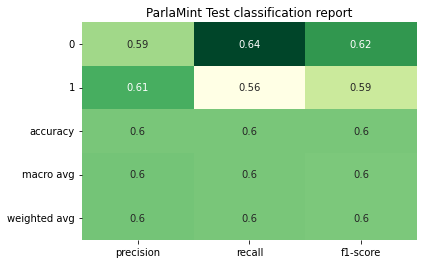


------------------------
  Confusion Matrix
------------------------


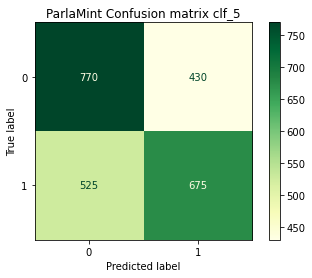

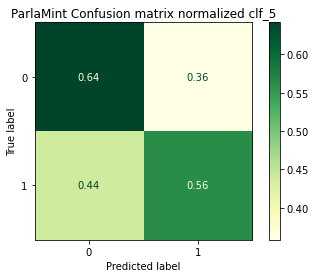

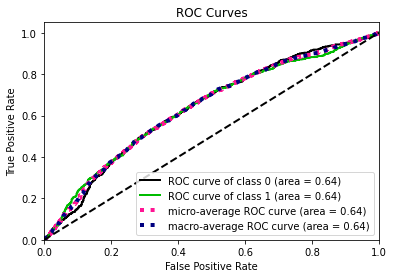

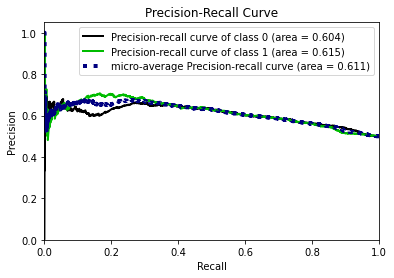

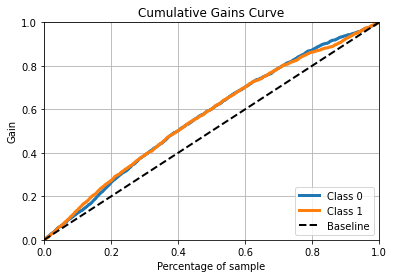

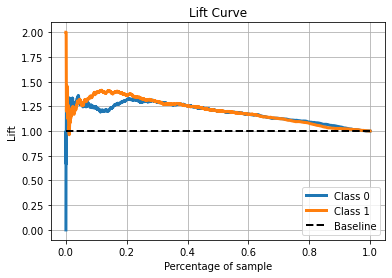

------------------------------------------------------------------------------------------------
Clf_6
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.59      0.65      0.62      1200
           1       0.61      0.56      0.58      1200

    accuracy                           0.60      2400
   macro avg       0.60      0.60      0.60      2400
weighted avg       0.60      0.60      0.60      2400



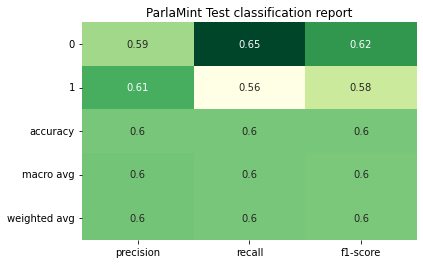


------------------------
  Confusion Matrix
------------------------


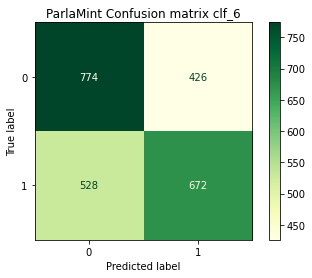

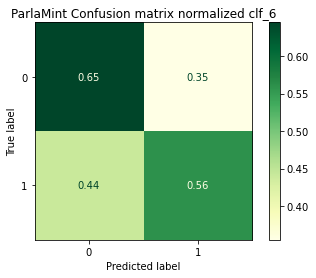

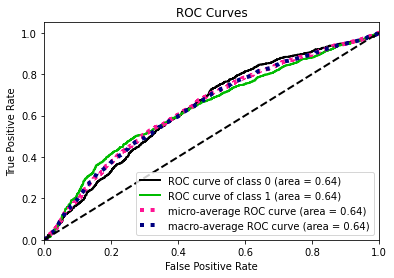

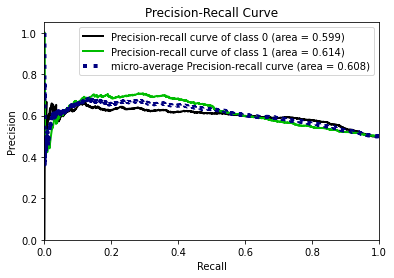

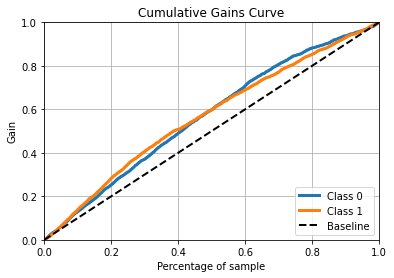

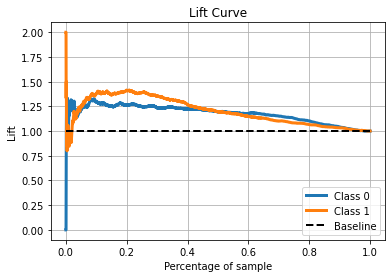

------------------------------------------------------------------------------------------------
Clf_7
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.65      0.62      1200
           1       0.62      0.58      0.60      1200

    accuracy                           0.61      2400
   macro avg       0.61      0.61      0.61      2400
weighted avg       0.61      0.61      0.61      2400



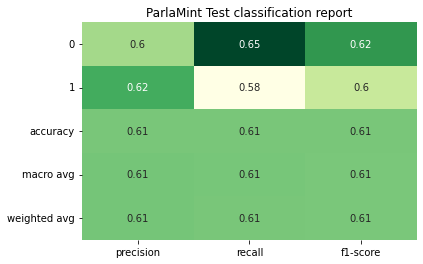


------------------------
  Confusion Matrix
------------------------


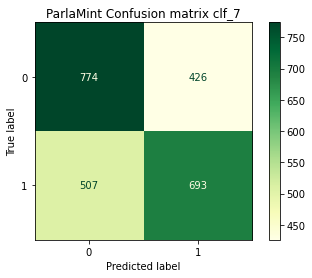

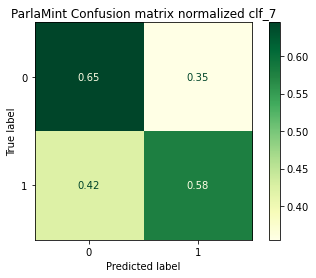

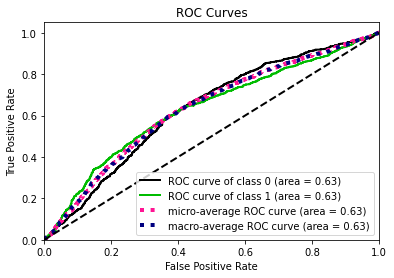

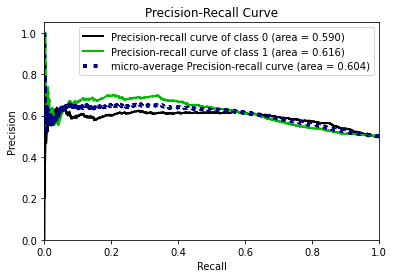

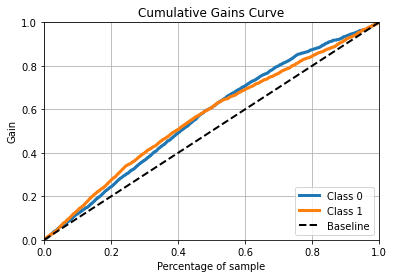

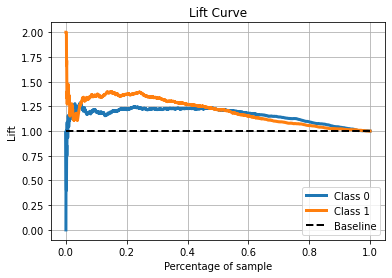

------------------------------------------------------------------------------------------------
Clf_8
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.64      0.62      1200
           1       0.61      0.57      0.59      1200

    accuracy                           0.60      2400
   macro avg       0.60      0.60      0.60      2400
weighted avg       0.60      0.60      0.60      2400



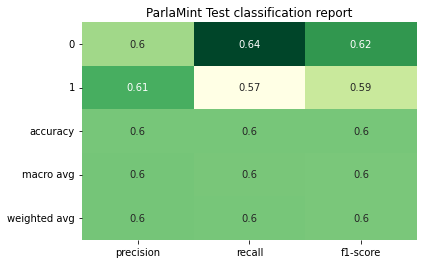


------------------------
  Confusion Matrix
------------------------


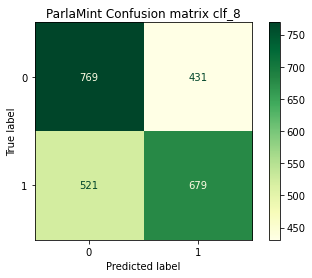

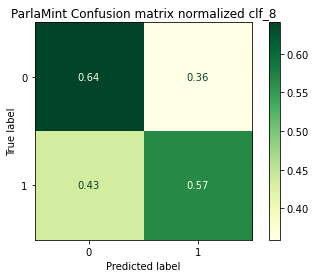

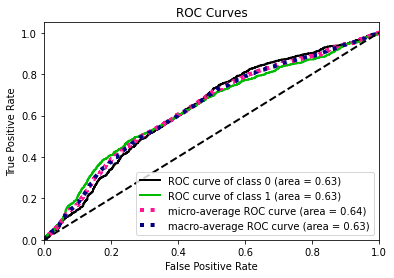

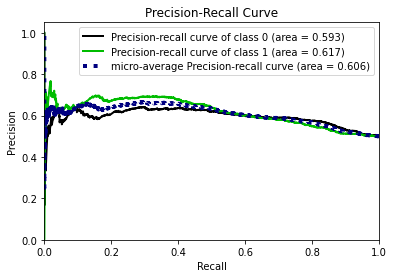

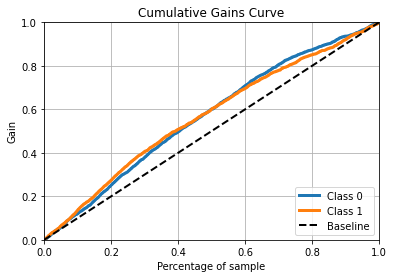

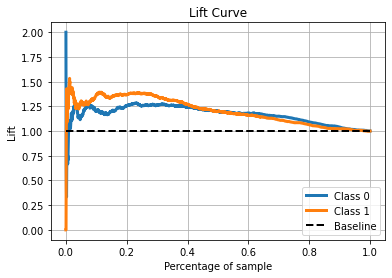

------------------------------------------------------------------------------------------------
Clf_9
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.60      0.62      0.61      1200
           1       0.61      0.58      0.59      1200

    accuracy                           0.60      2400
   macro avg       0.60      0.60      0.60      2400
weighted avg       0.60      0.60      0.60      2400



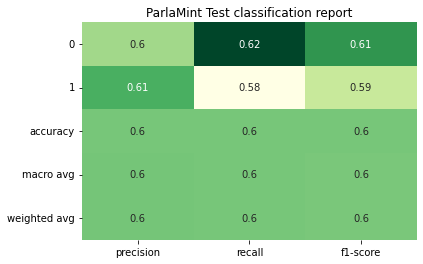


------------------------
  Confusion Matrix
------------------------


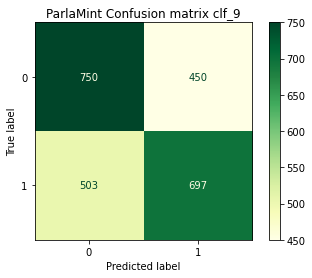

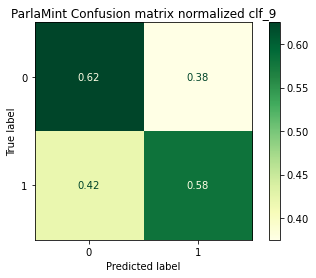

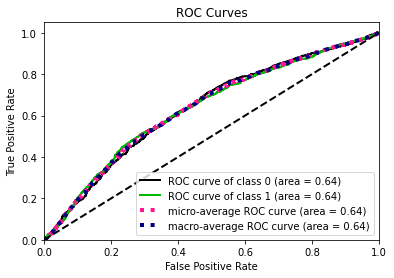

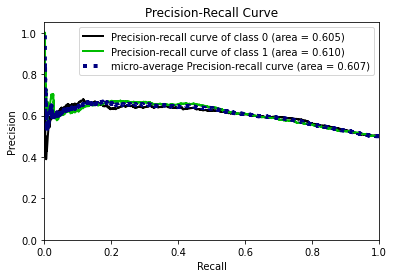

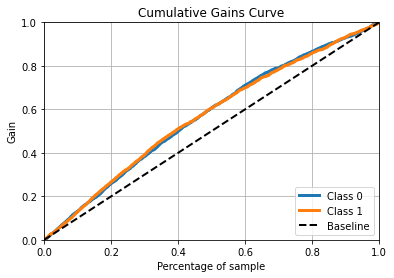

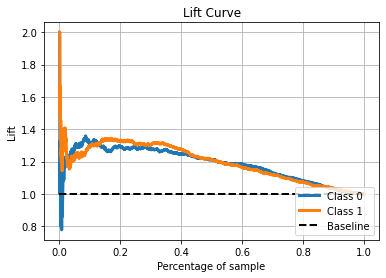

------------------------------------------------------------------------------------------------
Clf_10
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.58      0.62      0.60      1200
           1       0.59      0.56      0.57      1200

    accuracy                           0.59      2400
   macro avg       0.59      0.59      0.59      2400
weighted avg       0.59      0.59      0.59      2400



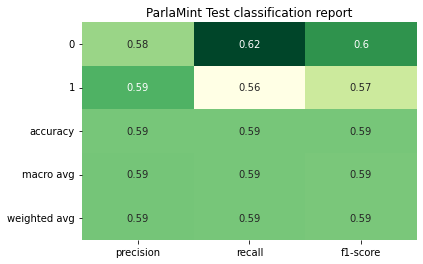


------------------------
  Confusion Matrix
------------------------


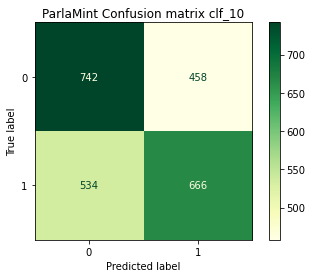

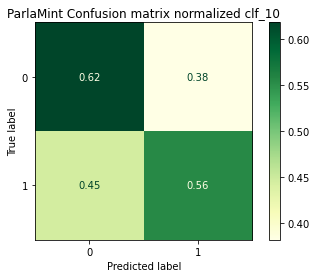

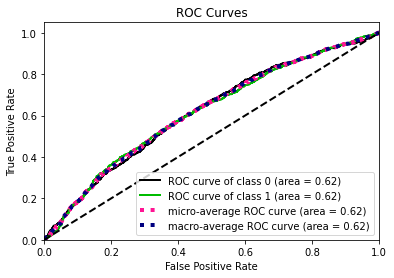

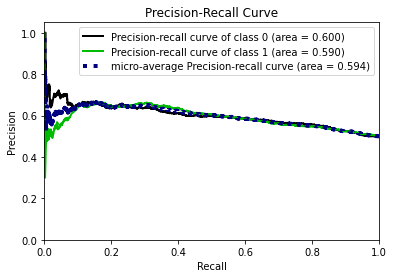

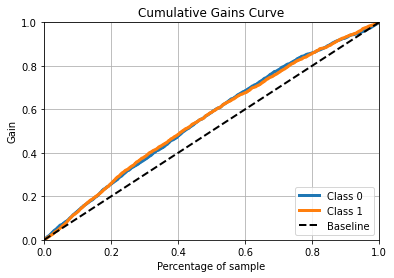

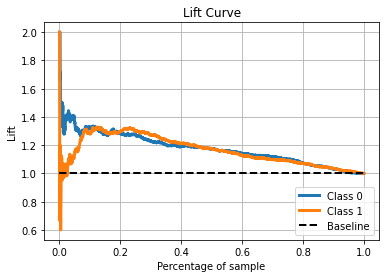

------------------------------------------------------------------------------------------------
Clf_11
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.58      0.63      0.60      1200
           1       0.59      0.55      0.57      1200

    accuracy                           0.59      2400
   macro avg       0.59      0.59      0.59      2400
weighted avg       0.59      0.59      0.59      2400



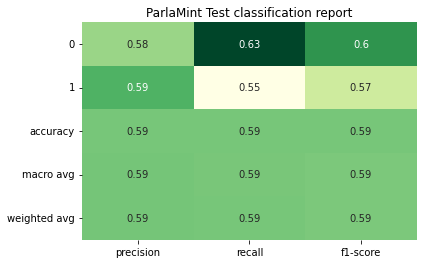


------------------------
  Confusion Matrix
------------------------


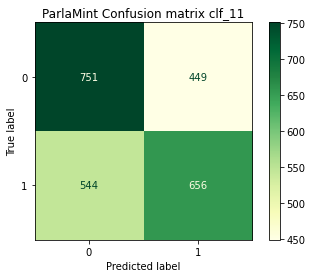

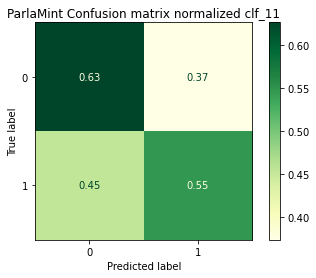

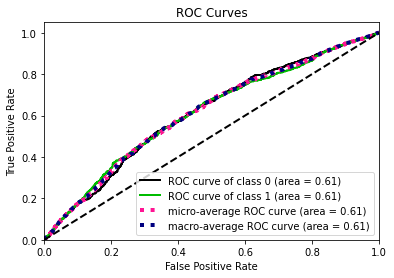

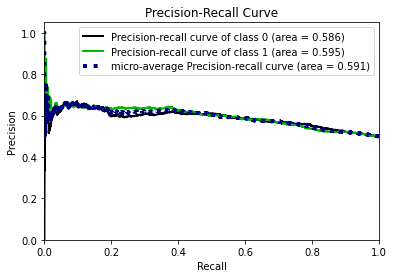

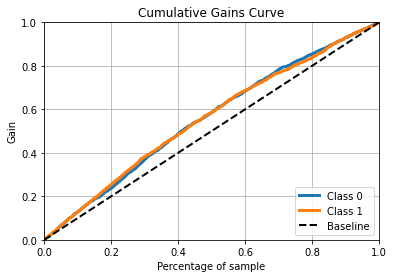

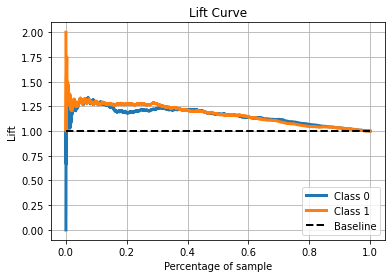

------------------------------------------------------------------------------------------------
Clf_12
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.59      0.65      0.62      1200
           1       0.61      0.56      0.58      1200

    accuracy                           0.60      2400
   macro avg       0.60      0.60      0.60      2400
weighted avg       0.60      0.60      0.60      2400



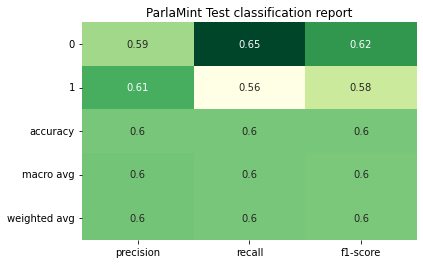


------------------------
  Confusion Matrix
------------------------


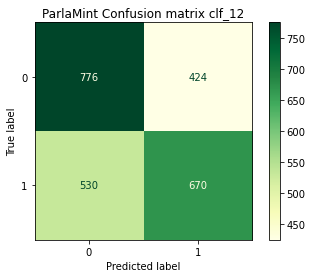

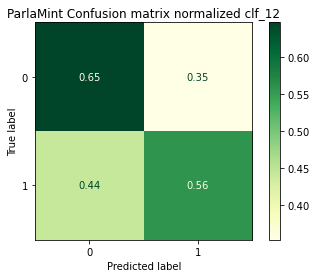

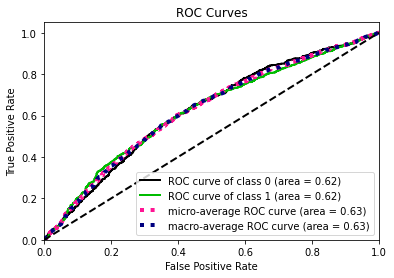

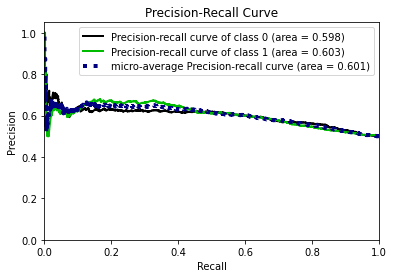

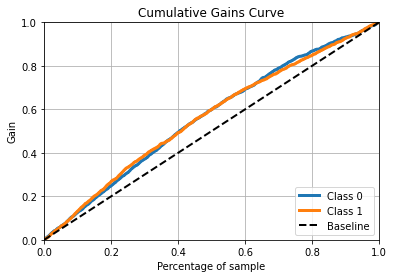

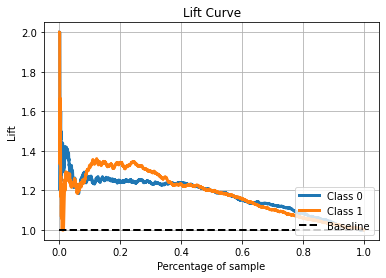

------------------------------------------------------------------------------------------------


In [21]:
lista_cm_normalizzate_svm_random_speech, lista_clf_report_random_speech = \
        plot_classification_results(diz_random_speech_svm['df_random_speech'], False, diz_cmap['random_speech'])

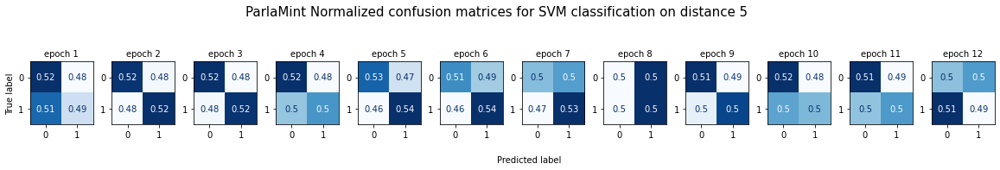

In [22]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_svm_5, 'SVM', '5', diz_cmap['5'])

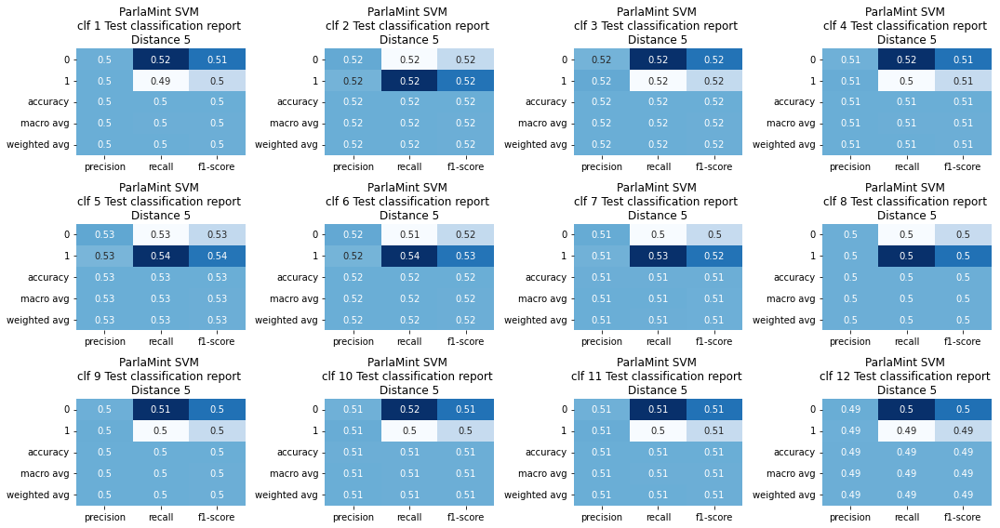

In [23]:
plot_all_classification_report(lista_clf_report_5, '5', diz_cmap['5'], 'SVM')

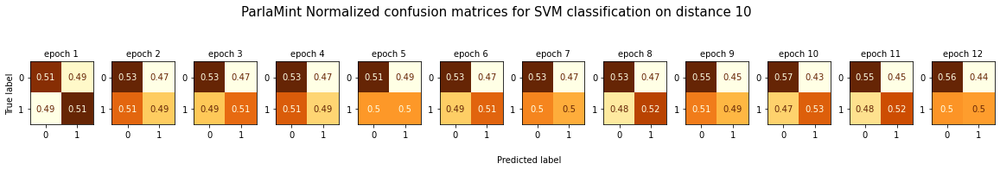

In [24]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_svm_10, 'SVM', '10', diz_cmap['10'])    

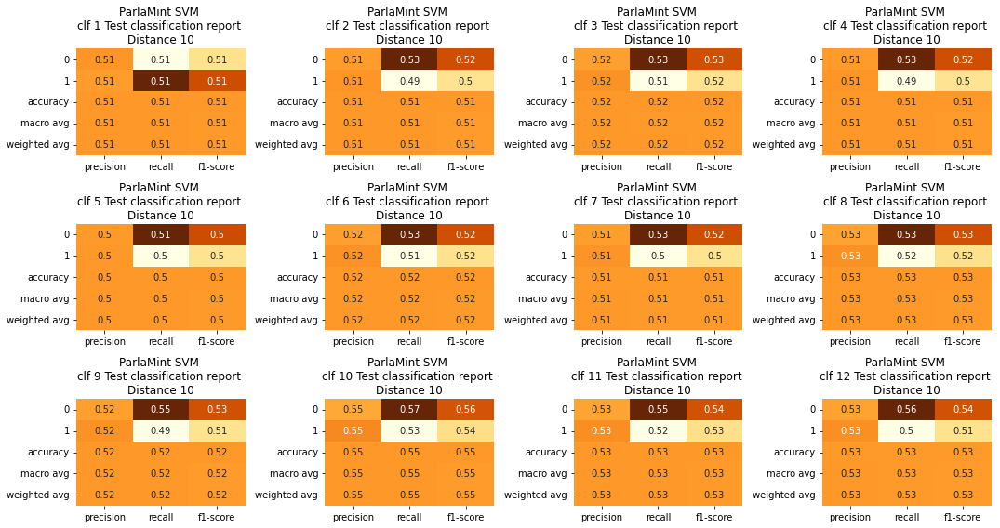

In [25]:
plot_all_classification_report(lista_clf_report_10, '10', diz_cmap['10'], 'SVM')

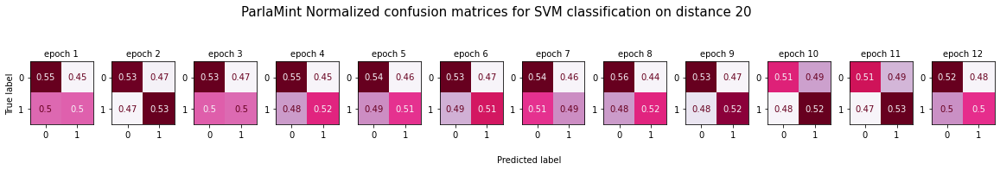

In [26]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_svm_20, 'SVM', '20', diz_cmap['20'])    

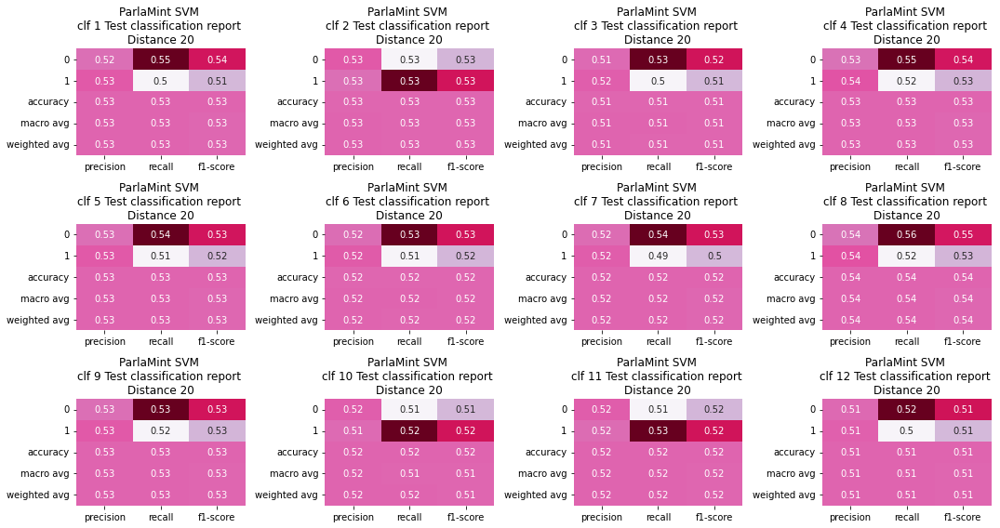

In [27]:
plot_all_classification_report(lista_clf_report_20, '20', diz_cmap['20'], 'SVM')

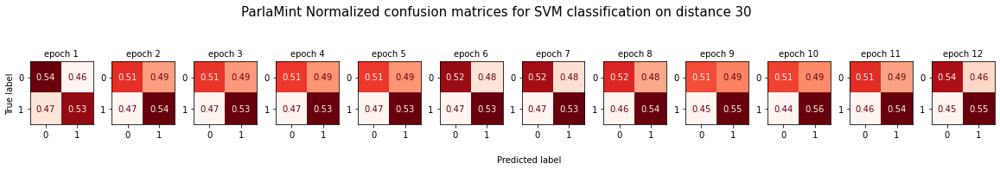

In [28]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_svm_30, 'SVM', '30', diz_cmap['30'])    

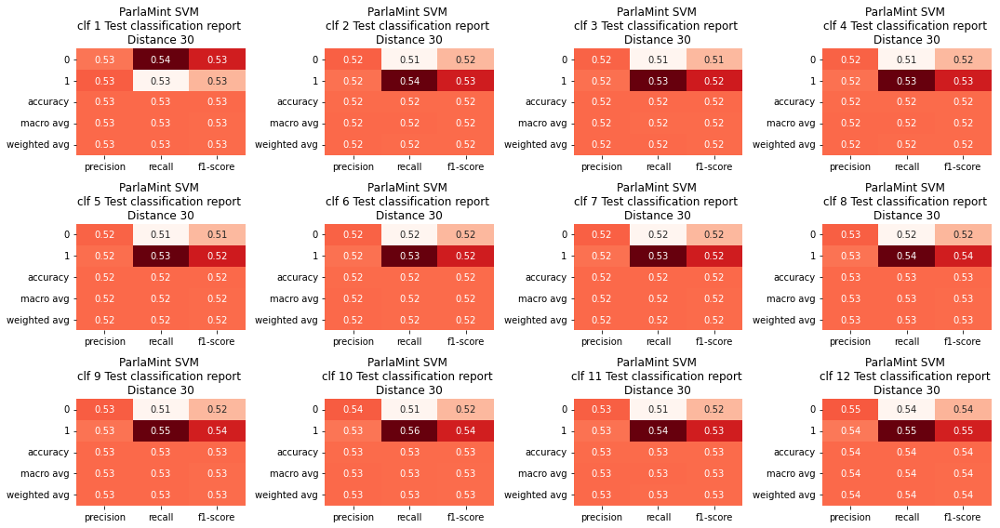

In [29]:
plot_all_classification_report(lista_clf_report_30, '30', diz_cmap['30'], 'SVM')

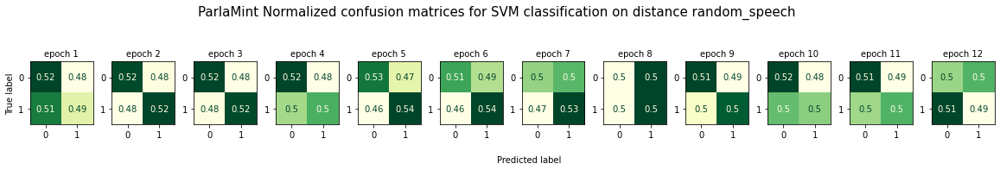

In [30]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_svm_5, 'SVM', 'random_speech', diz_cmap['random_speech'])

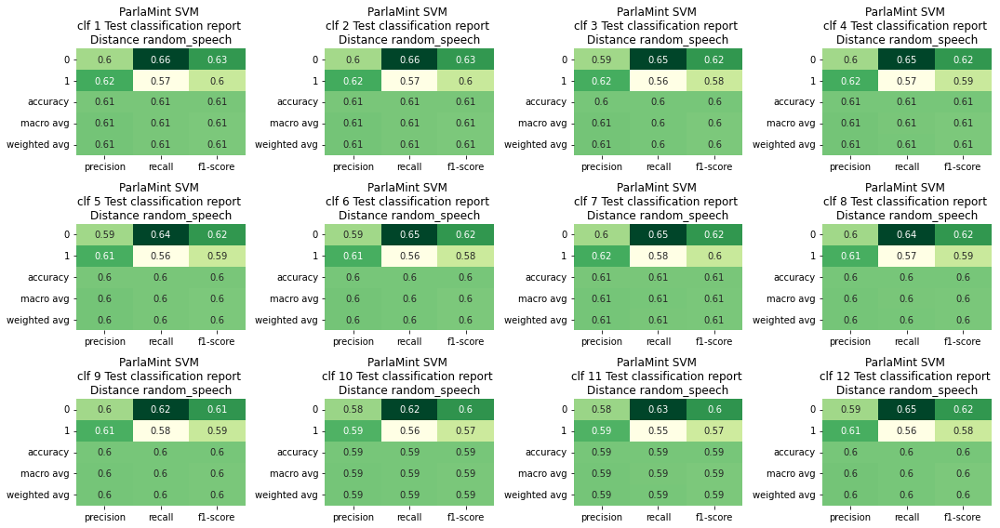

In [31]:
plot_all_classification_report(lista_clf_report_random_speech, 'random_speech', diz_cmap['random_speech'], 'SVM')

In [32]:
diz_dist_5_svm['df_dist_5']['clf_1'].keys()

dict_keys(['accuracy', 'f1_score', 'y_test', 'y_pred', 'y_score', 'classes', 'ids_proba', 'ids_preds', 'proba_of_positive_class'])

# BERT finetuning classification results

In [33]:
num_epoch = range(5)

In [34]:
def plot_loss_and_accuracy(diz, dist):
    
    train_losses = []
    test_losses = []
    test_acc = []

    for epoch in diz:
        train_losses.append(diz[epoch]["training_loss"])
        test_losses.append(diz[epoch]["avg_loss"])
        test_acc.append(diz[epoch]["accuracy"])

    plt.plot(range(1,len(num_epoch)+1), train_losses, label = "Training Loss")
    plt.plot(range(1,len(num_epoch)+1), test_losses, label = "Test Loss")
    plt.title("{} Bert fine-tuned Loss (Distance {})".format(risorsa, str(dist)))
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.xticks(range(1,len(num_epoch)+1))
    plt.legend()
    plt.show()
    

    plt.plot(range(1,len(num_epoch)+1), test_acc, label = "Test Accuracy")
    plt.title("{} Bert fine-tuned Test accuracy (Distance {})".format(risorsa, str(dist)))
    plt.xlabel("Epochs")
    plt.ylabel("Test Accuracy")
    plt.xticks(range(1,len(num_epoch)+1))
    plt.legend()
    plt.show()

In [35]:
dist_5_bf = open(path_pickle + "/" + "df_dist_5_diz_bert_finetuning.pickle", "rb")
dist_10_bf = open(path_pickle + "/" + "df_dist_10_diz_bert_finetuning.pickle", "rb")
dist_20_bf = open(path_pickle + "/" + "df_dist_20_diz_bert_finetuning.pickle", "rb")
dist_30_bf = open(path_pickle + "/" + "df_dist_30_diz_bert_finetuning.pickle", "rb")
random_speech_bf = open(path_pickle + "/" + "df_random_speech_diz_bert_finetuning.pickle", "rb")

diz_dist_5_bf = pickle.load(dist_5_bf)
diz_dist_10_bf = pickle.load(dist_10_bf)
diz_dist_20_bf = pickle.load(dist_20_bf)
diz_dist_30_bf = pickle.load(dist_30_bf)
diz_random_speech_bf = pickle.load(random_speech_bf)

In [36]:
lista_ids_bf_5 = controlla_ids(diz_dist_5_bf['df_dist_5'])

inizializzo la lista con il classificatore Epoch0


In [37]:
lista_ids_bf_10 = controlla_ids(diz_dist_10_bf['df_dist_10'])

inizializzo la lista con il classificatore Epoch0


In [38]:
lista_ids_bf_20 = controlla_ids(diz_dist_20_bf['df_dist_20'])

inizializzo la lista con il classificatore Epoch0


In [39]:
lista_ids_bf_30 = controlla_ids(diz_dist_30_bf['df_dist_30'])

inizializzo la lista con il classificatore Epoch0


In [40]:
lista_ids_bf_random_speech = controlla_ids(diz_random_speech_bf['df_random_speech'])

inizializzo la lista con il classificatore Epoch0


In [41]:
diz_dist_5_bf['df_dist_5']['Epoch0']['probabilities']

array([[0.49238995, 0.50761   ],
       [0.49237433, 0.5076257 ],
       [0.4923731 , 0.50762695],
       ...,
       [0.4923626 , 0.50763744],
       [0.49238738, 0.5076126 ],
       [0.49238232, 0.50761765]], dtype=float32)

Epoch0
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1200
           1       0.50      1.00      0.67      1200

    accuracy                           0.50      2400
   macro avg       0.25      0.50      0.33      2400
weighted avg       0.25      0.50      0.33      2400



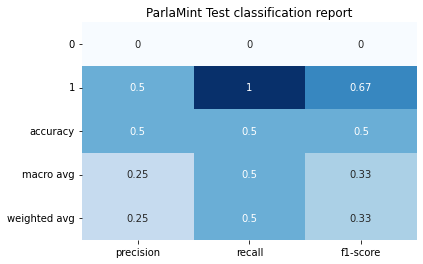


------------------------
  Confusion Matrix
------------------------


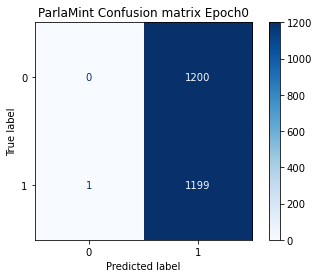

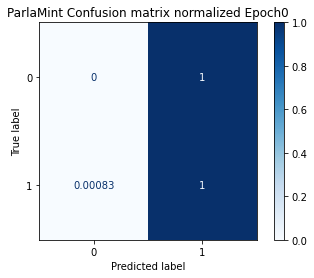

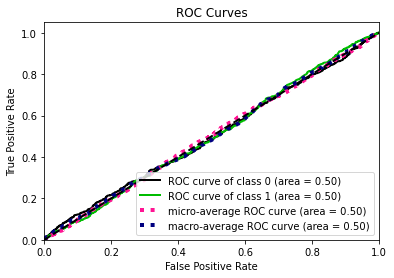

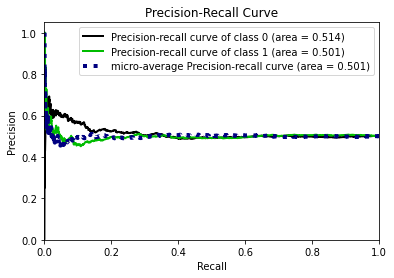

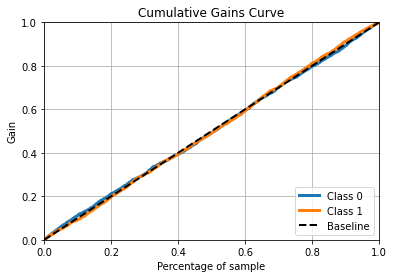

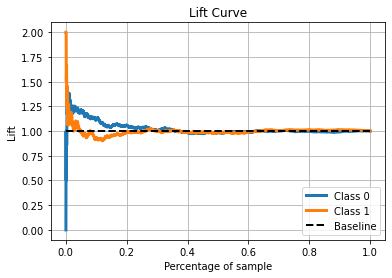

------------------------------------------------------------------------------------------------
Epoch1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1200
           1       0.50      1.00      0.67      1200

    accuracy                           0.50      2400
   macro avg       0.25      0.50      0.33      2400
weighted avg       0.25      0.50      0.33      2400



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metr

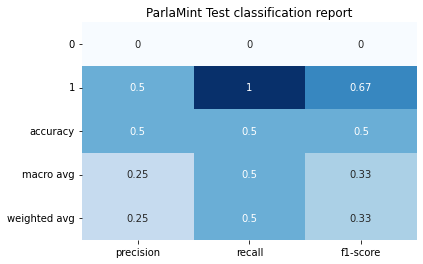


------------------------
  Confusion Matrix
------------------------


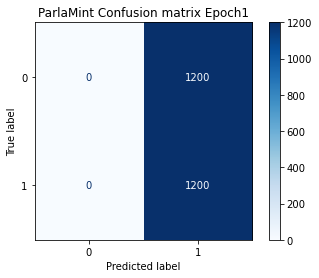

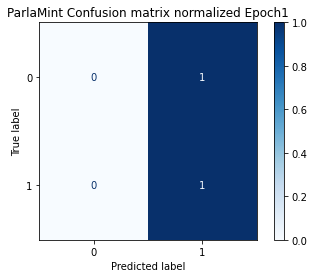

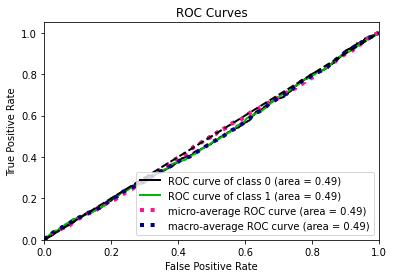

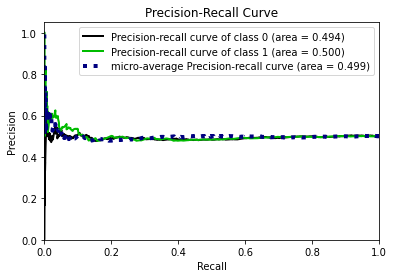

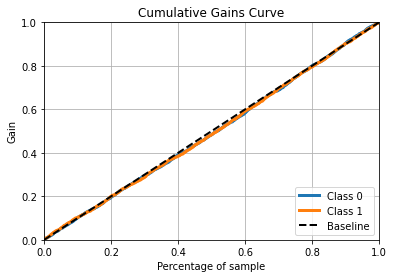

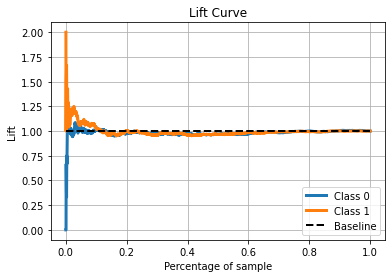

------------------------------------------------------------------------------------------------
Epoch2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1200
           1       0.00      0.00      0.00      1200

    accuracy                           0.50      2400
   macro avg       0.25      0.50      0.33      2400
weighted avg       0.25      0.50      0.33      2400



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metr

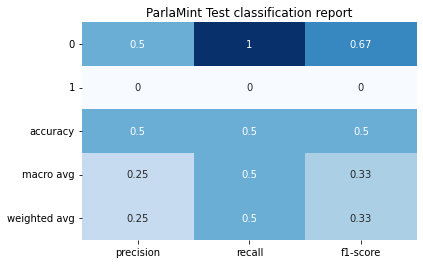


------------------------
  Confusion Matrix
------------------------


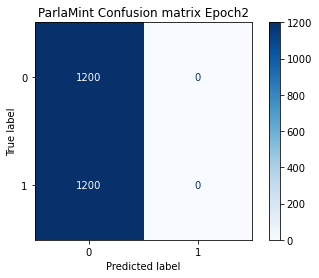

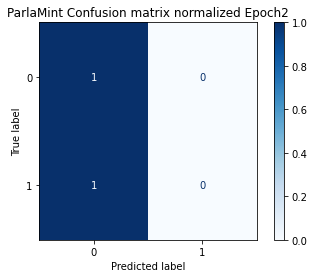

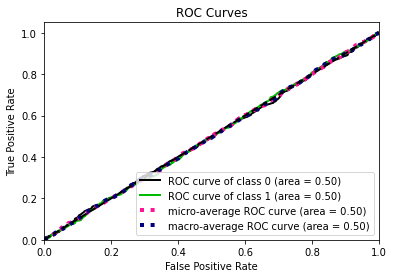

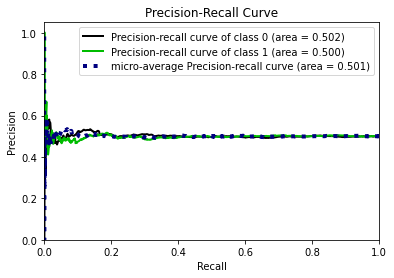

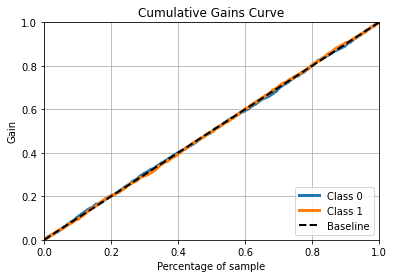

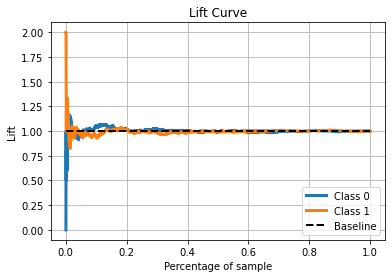

------------------------------------------------------------------------------------------------
Epoch3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.50      1.00      0.67      1200
           1       0.00      0.00      0.00      1200

    accuracy                           0.50      2400
   macro avg       0.25      0.50      0.33      2400
weighted avg       0.25      0.50      0.33      2400



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metr

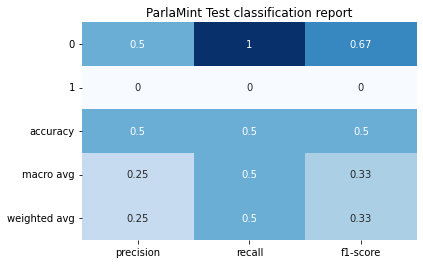


------------------------
  Confusion Matrix
------------------------


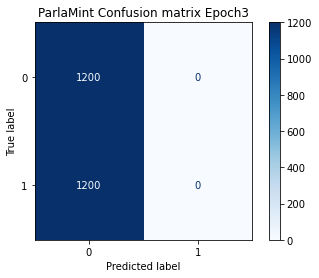

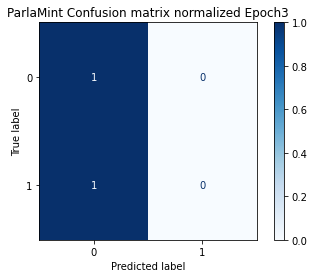

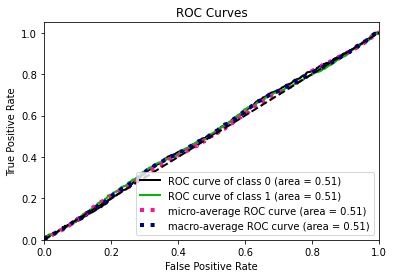

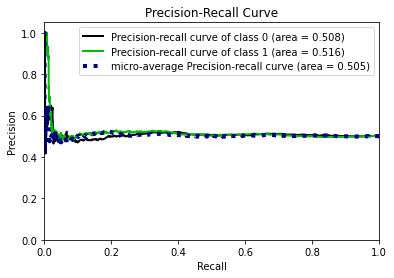

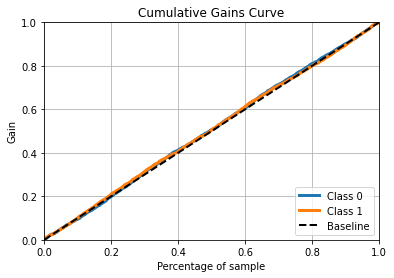

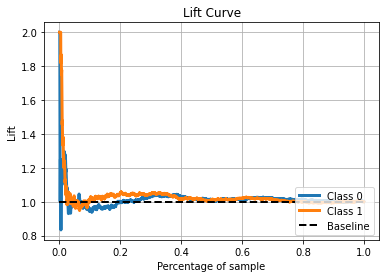

------------------------------------------------------------------------------------------------
Epoch4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1200
           1       0.50      1.00      0.67      1200

    accuracy                           0.50      2400
   macro avg       0.25      0.50      0.33      2400
weighted avg       0.25      0.50      0.33      2400



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/anaconda3/lib/python3.8/site-packages/sklearn/metr

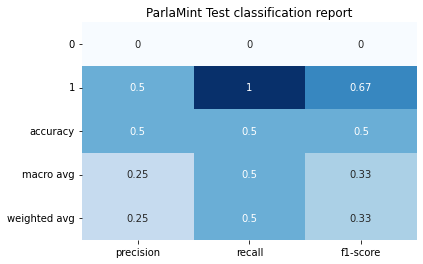


------------------------
  Confusion Matrix
------------------------


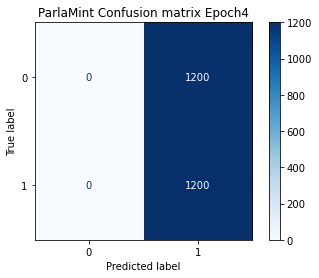

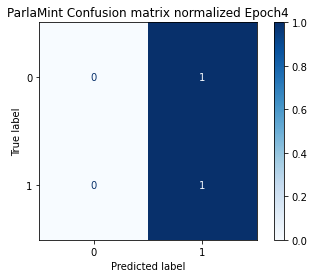

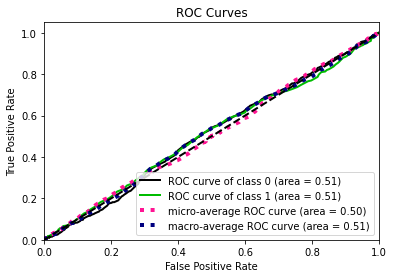

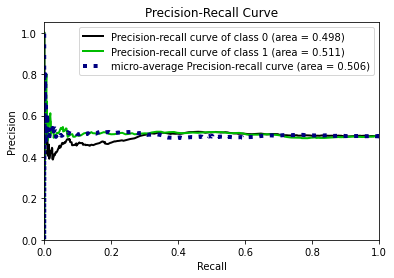

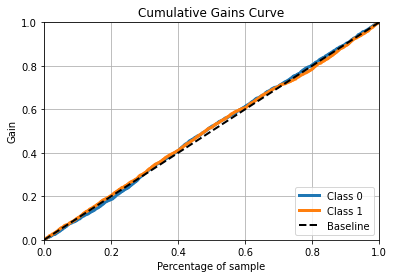

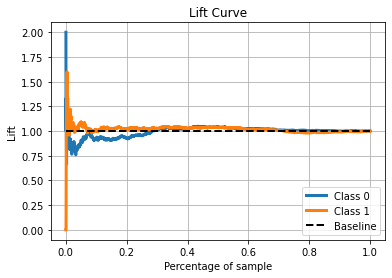

------------------------------------------------------------------------------------------------


In [42]:
lista_cm_normalizzate_bf_5, lista_clf_report_bf_5 = \
        plot_classification_results(diz_dist_5_bf['df_dist_5'], True, diz_cmap['5'])

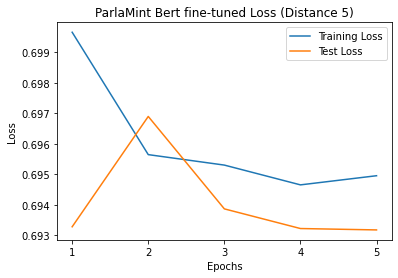

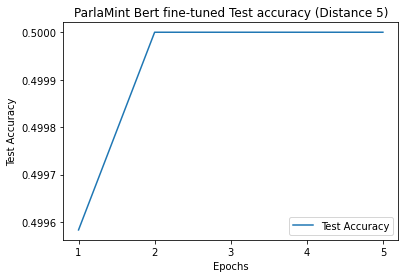

In [43]:
plot_loss_and_accuracy(diz_dist_5_bf['df_dist_5'], 5)

Epoch0
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.66      0.60      0.63      1200
           1       0.63      0.69      0.66      1200

    accuracy                           0.64      2400
   macro avg       0.64      0.64      0.64      2400
weighted avg       0.64      0.64      0.64      2400



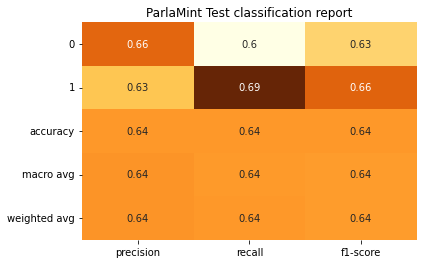


------------------------
  Confusion Matrix
------------------------


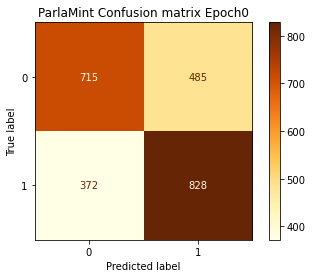

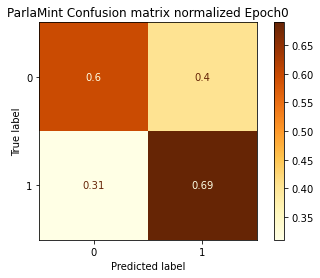

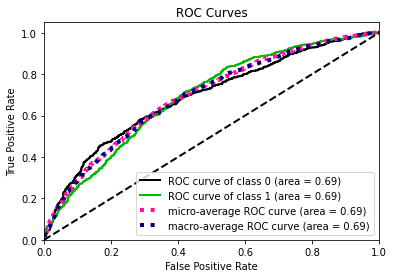

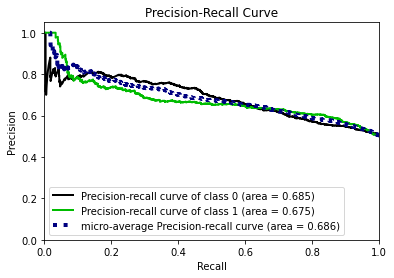

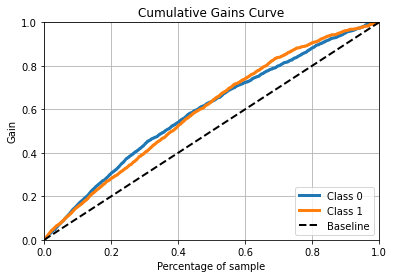

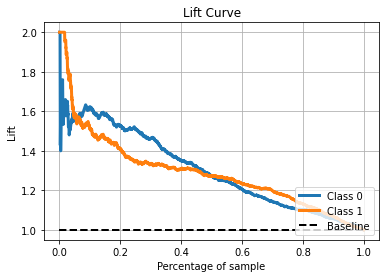

------------------------------------------------------------------------------------------------
Epoch1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.68      0.60      0.64      1200
           1       0.64      0.71      0.68      1200

    accuracy                           0.66      2400
   macro avg       0.66      0.66      0.66      2400
weighted avg       0.66      0.66      0.66      2400



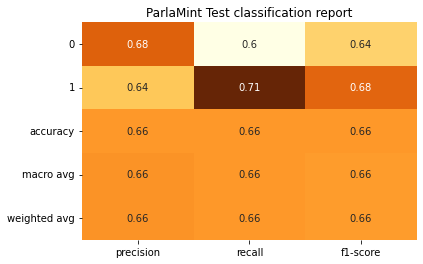


------------------------
  Confusion Matrix
------------------------


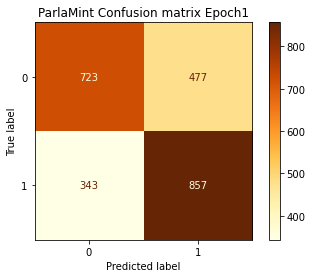

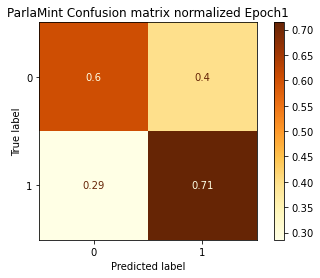

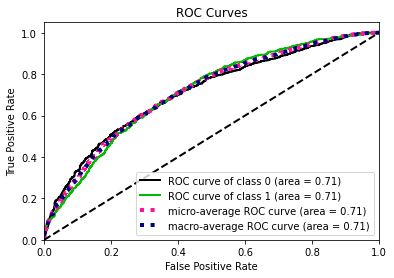

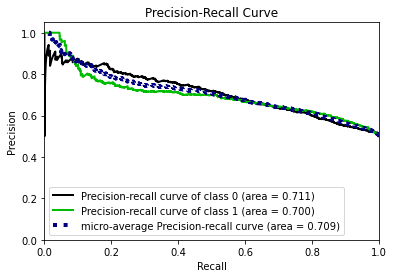

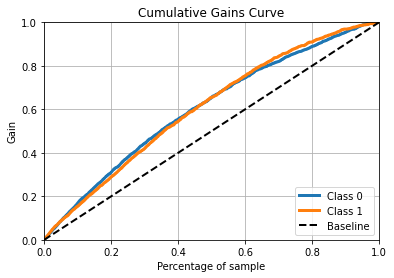

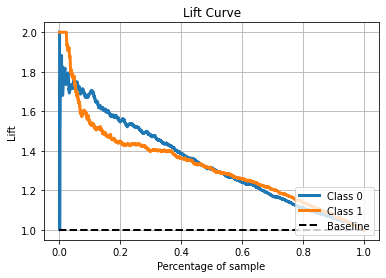

------------------------------------------------------------------------------------------------
Epoch2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.67      0.59      0.63      1200
           1       0.64      0.71      0.67      1200

    accuracy                           0.65      2400
   macro avg       0.65      0.65      0.65      2400
weighted avg       0.65      0.65      0.65      2400



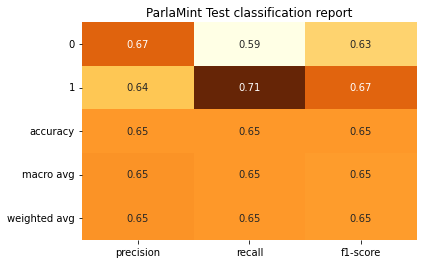


------------------------
  Confusion Matrix
------------------------


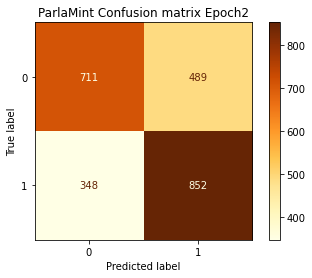

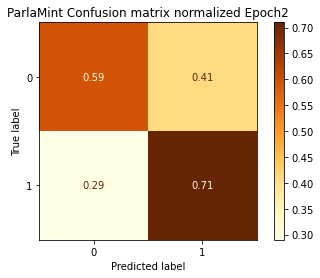

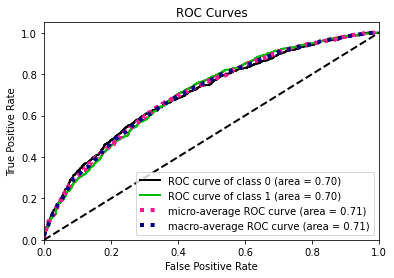

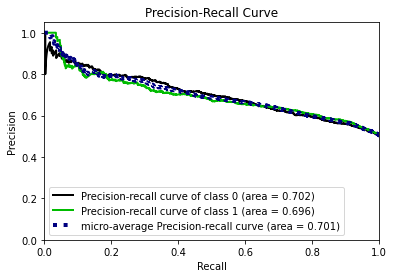

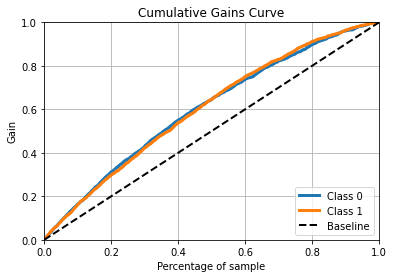

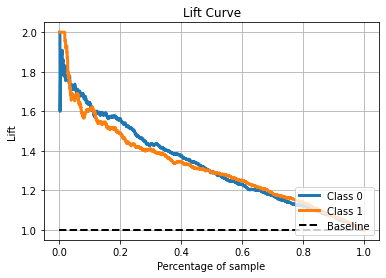

------------------------------------------------------------------------------------------------
Epoch3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.64      0.69      0.66      1200
           1       0.66      0.61      0.64      1200

    accuracy                           0.65      2400
   macro avg       0.65      0.65      0.65      2400
weighted avg       0.65      0.65      0.65      2400



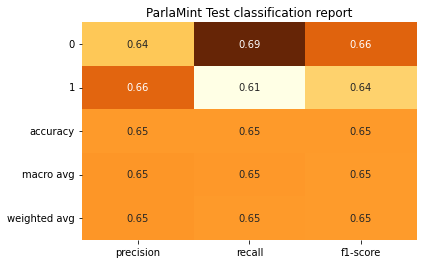


------------------------
  Confusion Matrix
------------------------


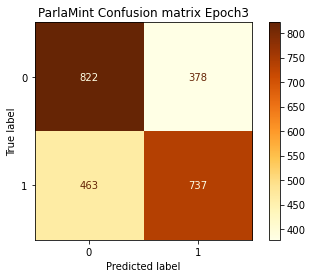

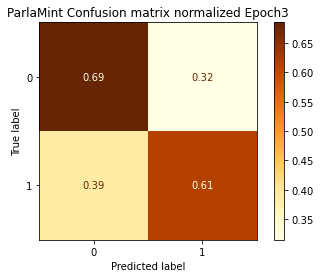

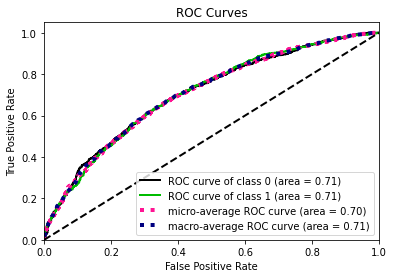

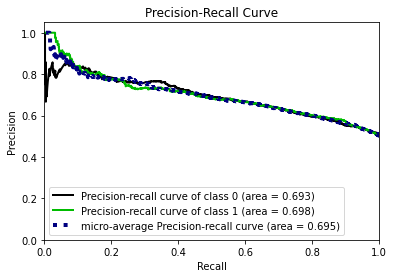

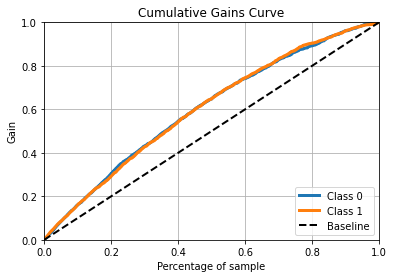

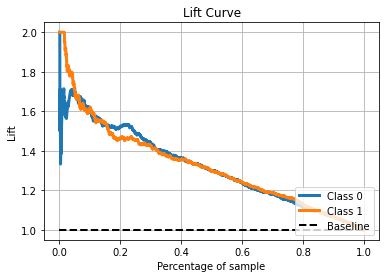

------------------------------------------------------------------------------------------------
Epoch4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.64      0.61      0.63      1200
           1       0.63      0.66      0.64      1200

    accuracy                           0.64      2400
   macro avg       0.64      0.64      0.64      2400
weighted avg       0.64      0.64      0.64      2400



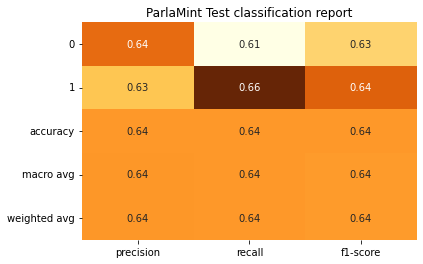


------------------------
  Confusion Matrix
------------------------


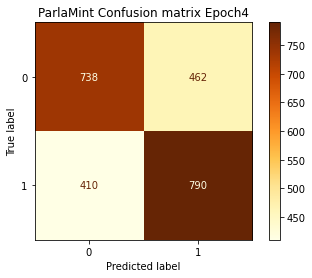

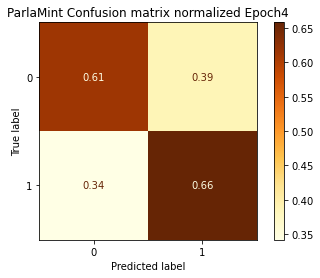

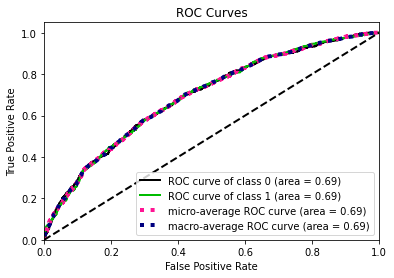

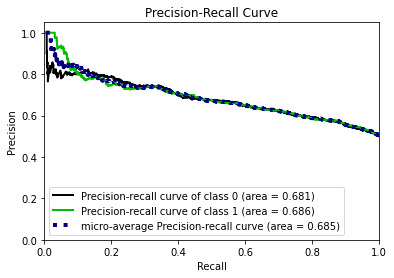

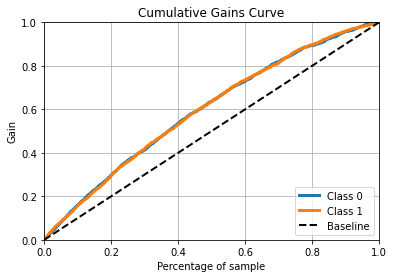

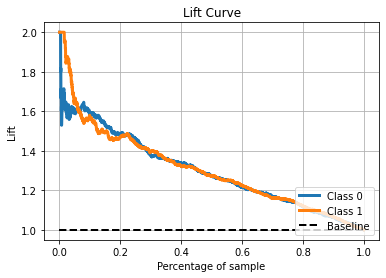

------------------------------------------------------------------------------------------------


In [44]:
lista_cm_normalizzate_bf_10, lista_clf_report_bf_10 = \
        plot_classification_results(diz_dist_10_bf['df_dist_10'], True, diz_cmap['10'])

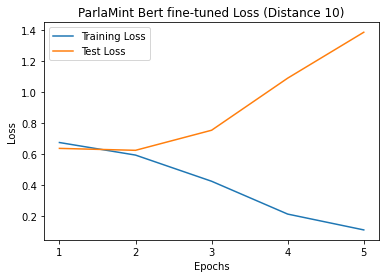

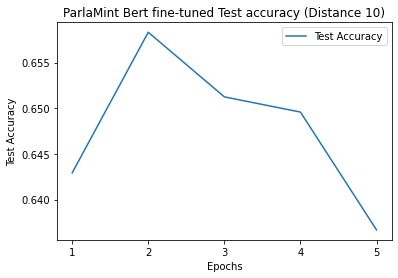

In [45]:
plot_loss_and_accuracy(diz_dist_10_bf['df_dist_10'], 10)

Epoch0
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.64      0.75      0.69      1200
           1       0.70      0.58      0.63      1200

    accuracy                           0.67      2400
   macro avg       0.67      0.67      0.66      2400
weighted avg       0.67      0.67      0.66      2400



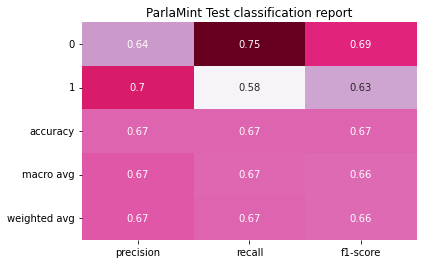


------------------------
  Confusion Matrix
------------------------


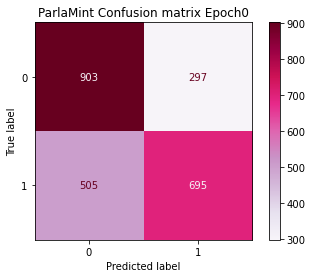

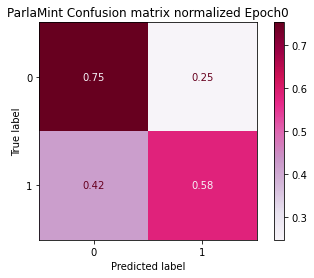

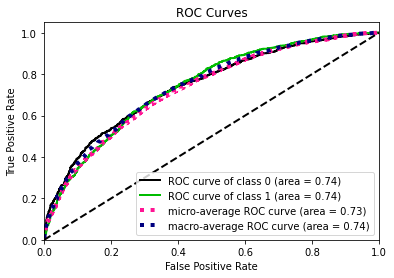

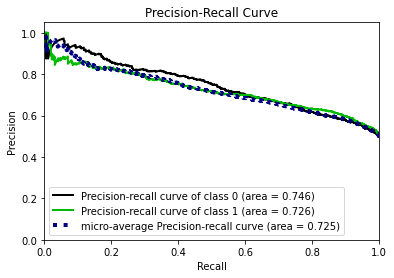

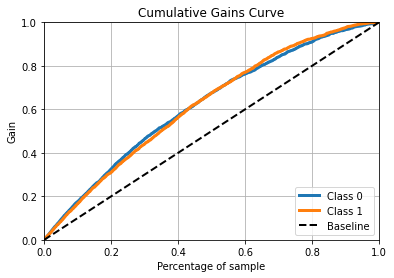

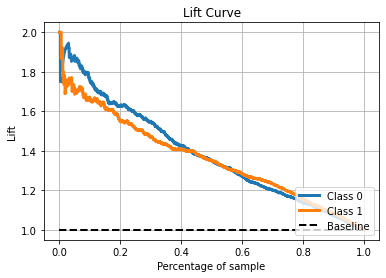

------------------------------------------------------------------------------------------------
Epoch1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.71      0.61      0.66      1200
           1       0.66      0.74      0.70      1200

    accuracy                           0.68      2400
   macro avg       0.68      0.68      0.68      2400
weighted avg       0.68      0.68      0.68      2400



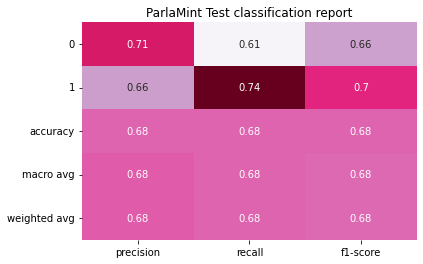


------------------------
  Confusion Matrix
------------------------


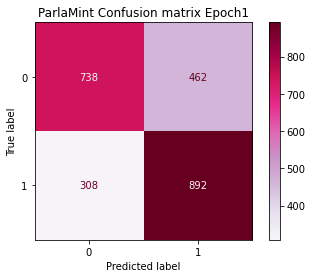

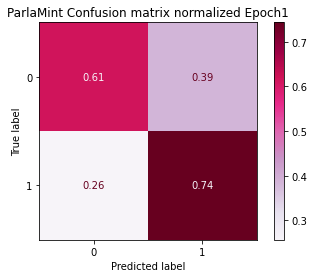

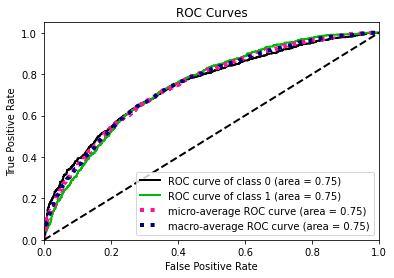

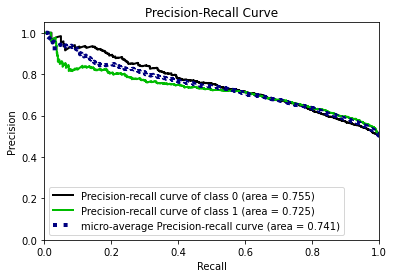

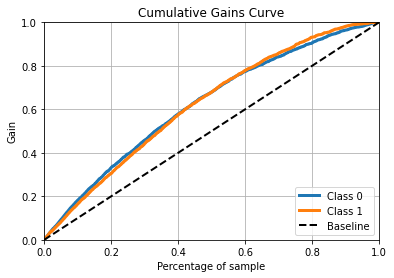

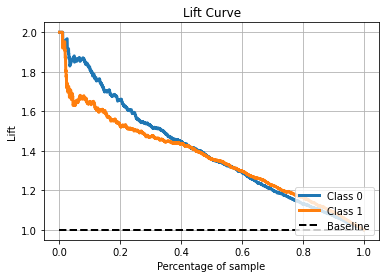

------------------------------------------------------------------------------------------------
Epoch2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.66      0.71      0.69      1200
           1       0.69      0.64      0.66      1200

    accuracy                           0.68      2400
   macro avg       0.68      0.68      0.67      2400
weighted avg       0.68      0.68      0.67      2400



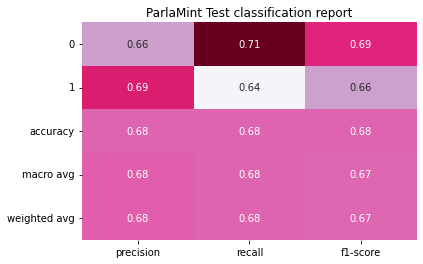


------------------------
  Confusion Matrix
------------------------


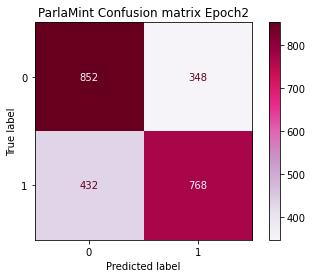

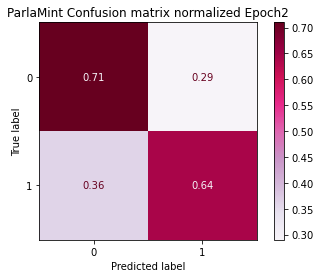

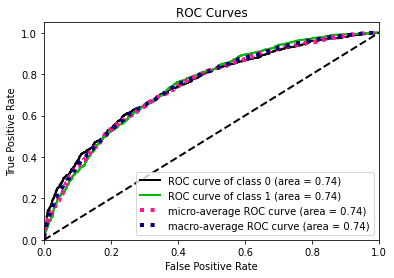

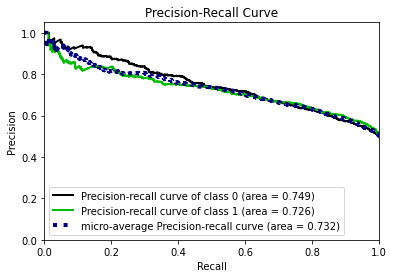

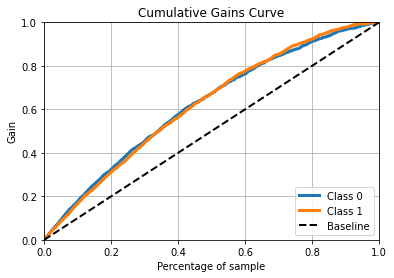

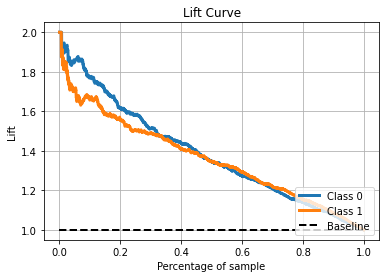

------------------------------------------------------------------------------------------------
Epoch3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.71      0.61      0.65      1200
           1       0.66      0.75      0.70      1200

    accuracy                           0.68      2400
   macro avg       0.68      0.68      0.68      2400
weighted avg       0.68      0.68      0.68      2400



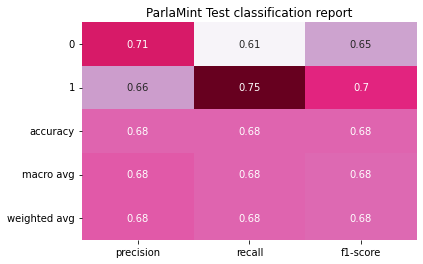


------------------------
  Confusion Matrix
------------------------


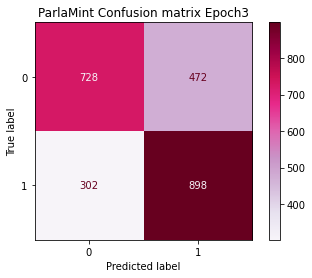

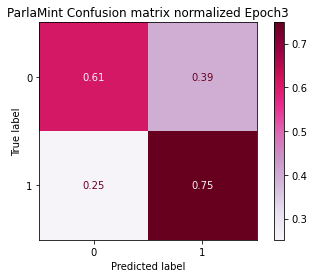

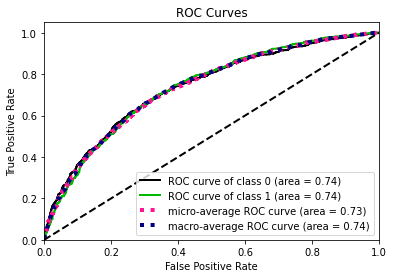

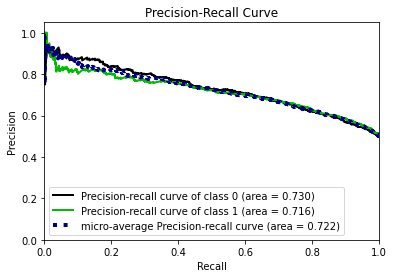

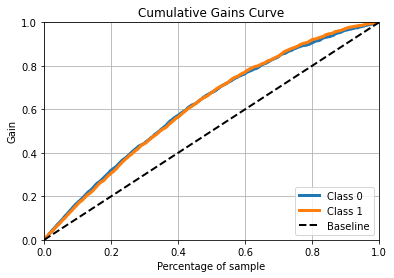

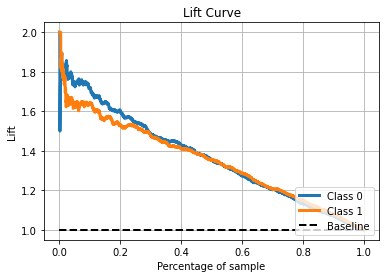

------------------------------------------------------------------------------------------------
Epoch4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.66      0.68      0.67      1200
           1       0.67      0.65      0.66      1200

    accuracy                           0.67      2400
   macro avg       0.67      0.67      0.67      2400
weighted avg       0.67      0.67      0.67      2400



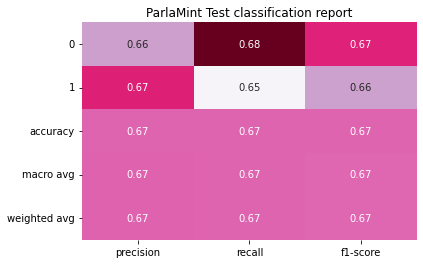


------------------------
  Confusion Matrix
------------------------


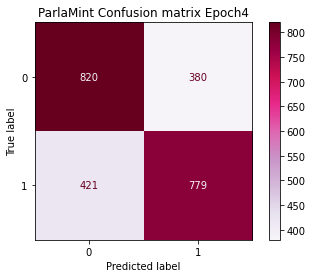

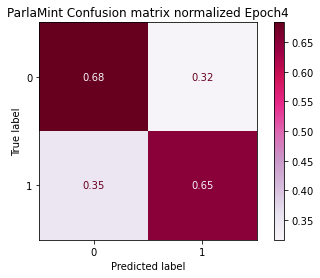

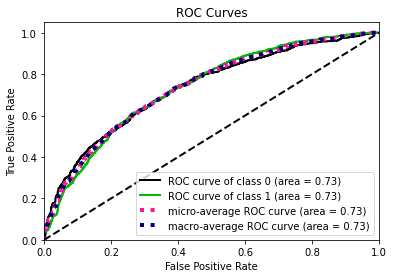

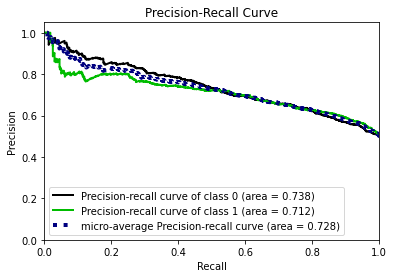

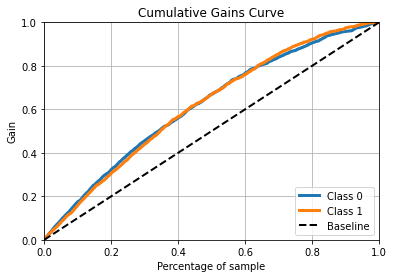

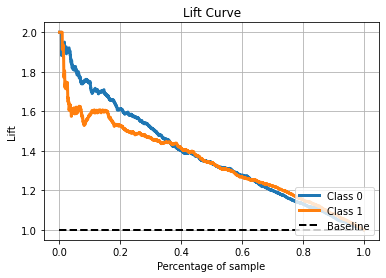

------------------------------------------------------------------------------------------------


In [46]:
lista_cm_normalizzate_bf_20, lista_clf_report_bf_20 = \
        plot_classification_results(diz_dist_20_bf['df_dist_20'], True, diz_cmap['20'])

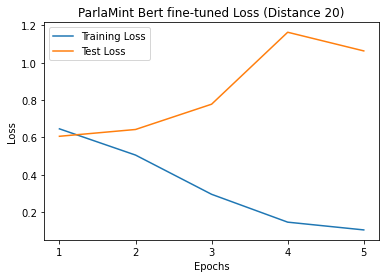

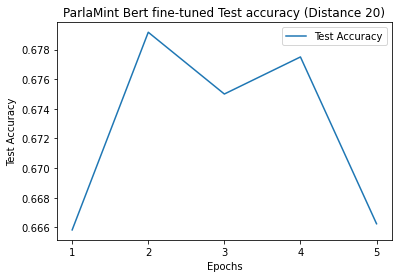

In [47]:
plot_loss_and_accuracy(diz_dist_20_bf['df_dist_20'], 20)

Epoch0
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.76      0.54      0.63      1200
           1       0.64      0.83      0.72      1200

    accuracy                           0.68      2400
   macro avg       0.70      0.68      0.68      2400
weighted avg       0.70      0.68      0.68      2400



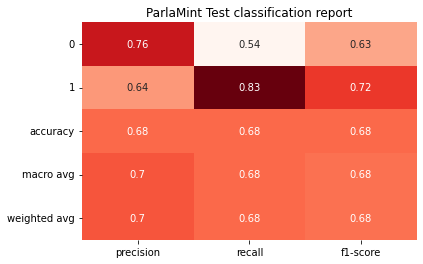


------------------------
  Confusion Matrix
------------------------


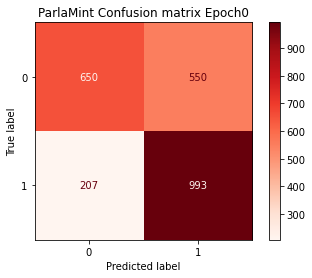

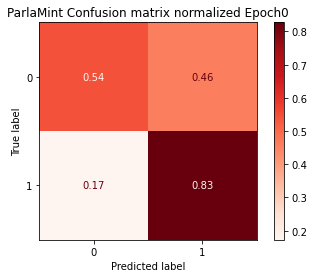

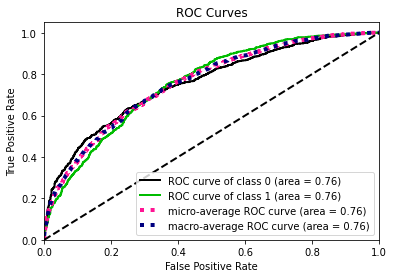

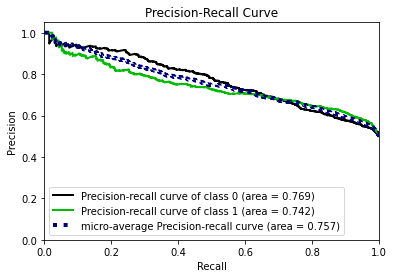

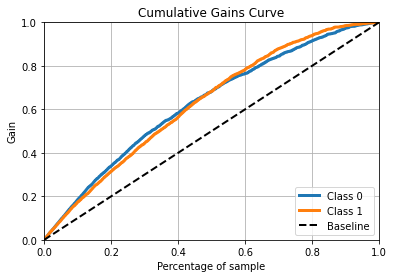

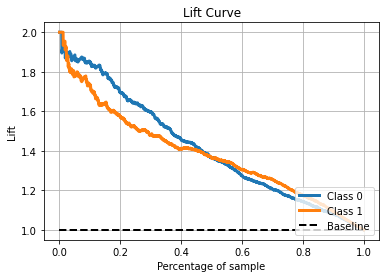

------------------------------------------------------------------------------------------------
Epoch1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.70      0.62      0.66      1200
           1       0.66      0.74      0.70      1200

    accuracy                           0.68      2400
   macro avg       0.68      0.68      0.68      2400
weighted avg       0.68      0.68      0.68      2400



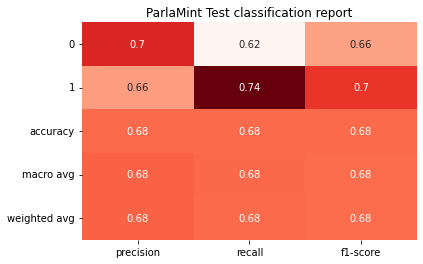


------------------------
  Confusion Matrix
------------------------


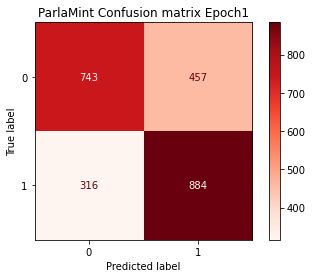

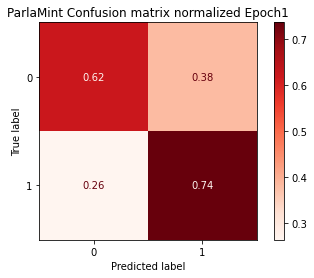

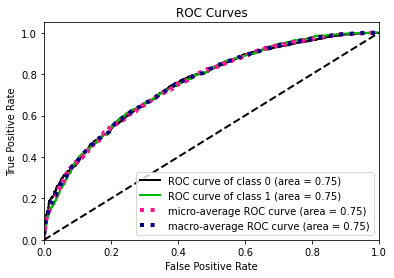

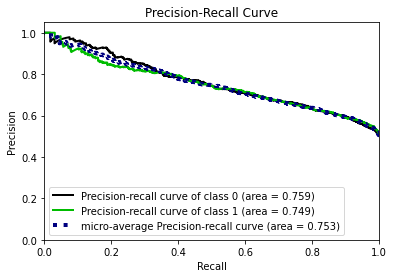

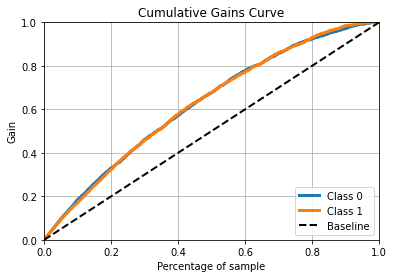

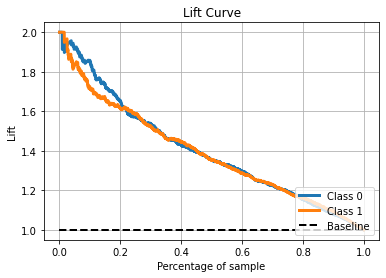

------------------------------------------------------------------------------------------------
Epoch2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.73      0.60      0.66      1200
           1       0.66      0.78      0.72      1200

    accuracy                           0.69      2400
   macro avg       0.70      0.69      0.69      2400
weighted avg       0.70      0.69      0.69      2400



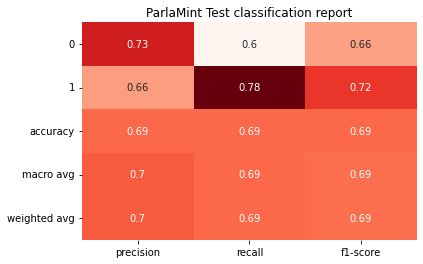


------------------------
  Confusion Matrix
------------------------


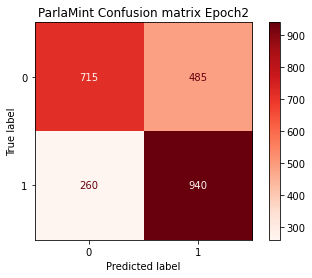

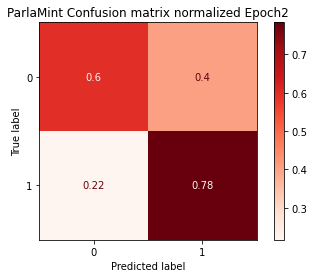

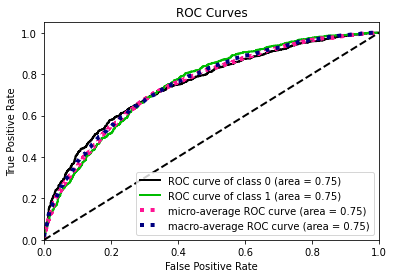

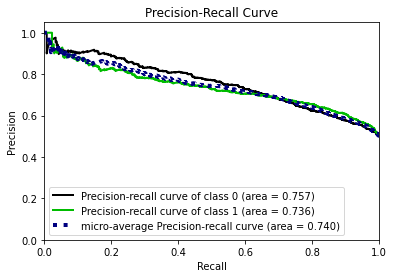

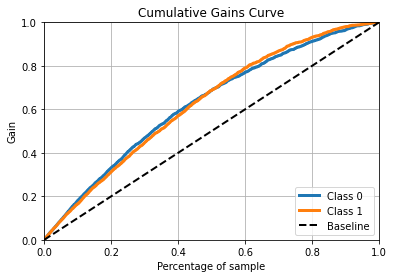

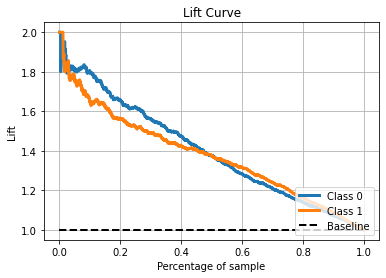

------------------------------------------------------------------------------------------------
Epoch3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.69      0.63      0.66      1200
           1       0.66      0.72      0.69      1200

    accuracy                           0.68      2400
   macro avg       0.68      0.68      0.67      2400
weighted avg       0.68      0.68      0.67      2400



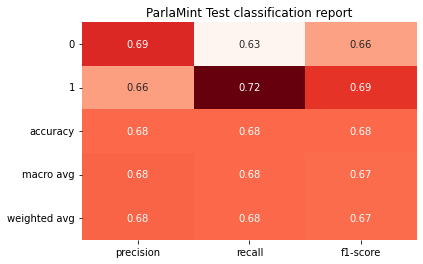


------------------------
  Confusion Matrix
------------------------


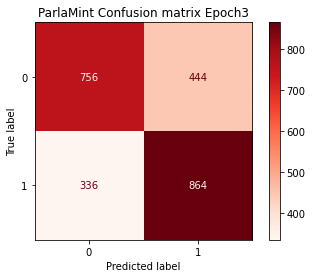

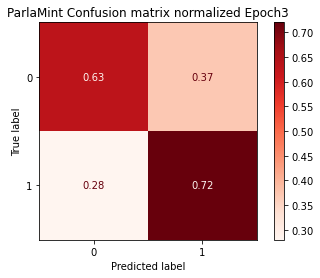

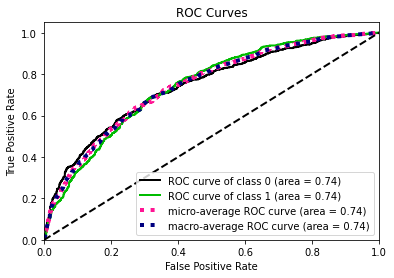

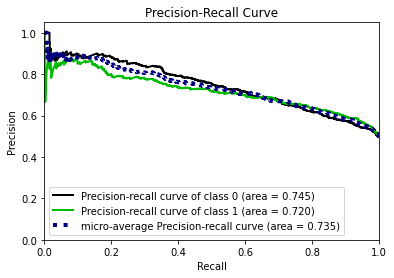

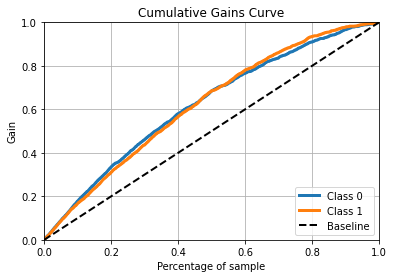

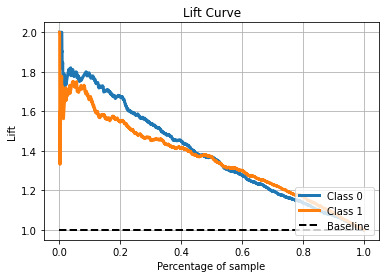

------------------------------------------------------------------------------------------------
Epoch4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.66      0.70      0.68      1200
           1       0.68      0.64      0.66      1200

    accuracy                           0.67      2400
   macro avg       0.67      0.67      0.67      2400
weighted avg       0.67      0.67      0.67      2400



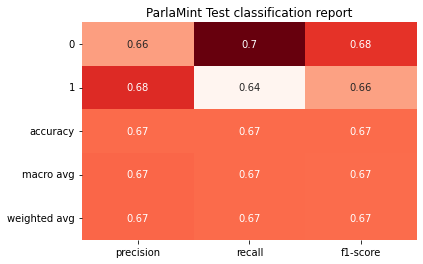


------------------------
  Confusion Matrix
------------------------


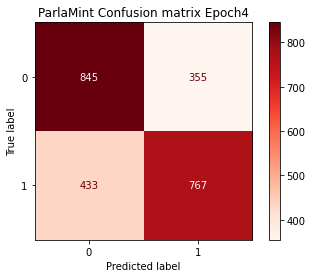

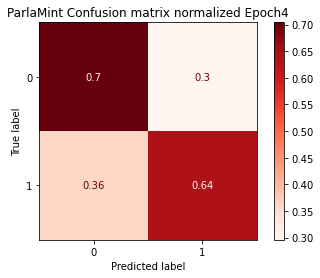

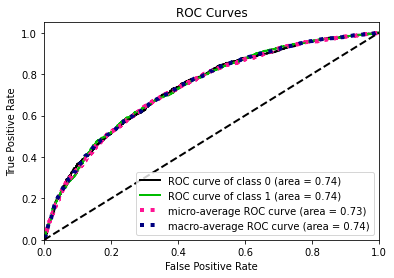

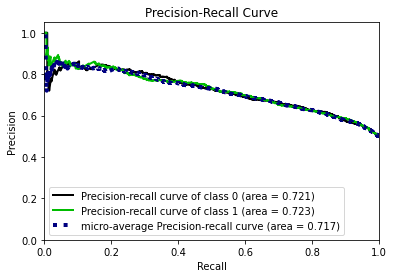

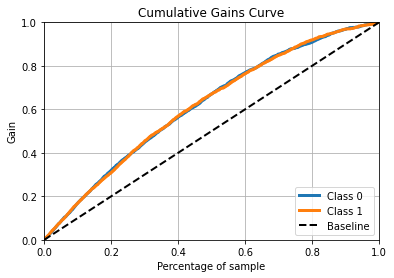

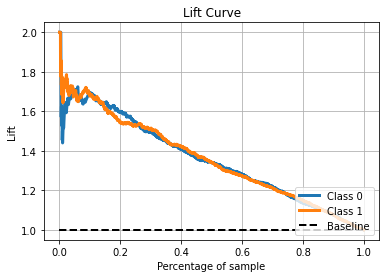

------------------------------------------------------------------------------------------------


In [48]:
lista_cm_normalizzate_bf_30, lista_clf_report_bf_30 = \
        plot_classification_results(diz_dist_30_bf['df_dist_30'], True, diz_cmap['30'])

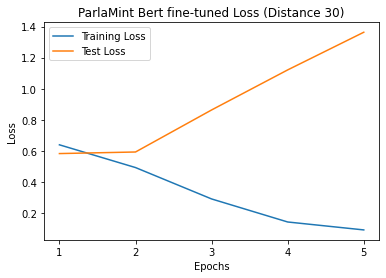

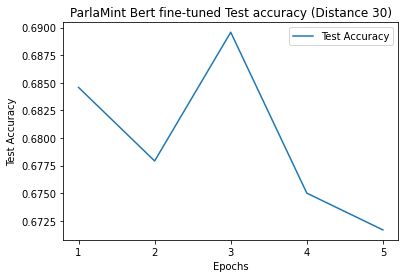

In [49]:
plot_loss_and_accuracy(diz_dist_30_bf['df_dist_30'], 30)

Epoch0
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      1200
           1       0.76      0.84      0.80      1200

    accuracy                           0.79      2400
   macro avg       0.79      0.79      0.79      2400
weighted avg       0.79      0.79      0.79      2400



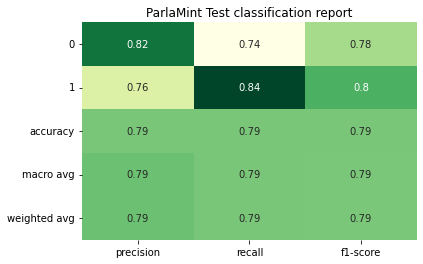


------------------------
  Confusion Matrix
------------------------


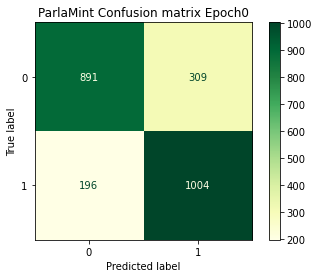

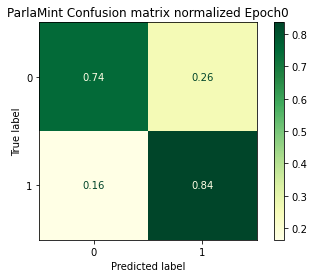

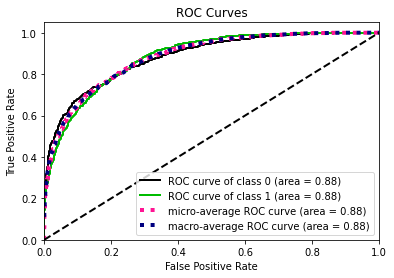

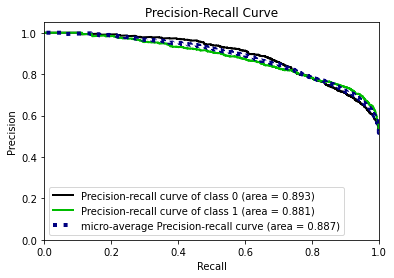

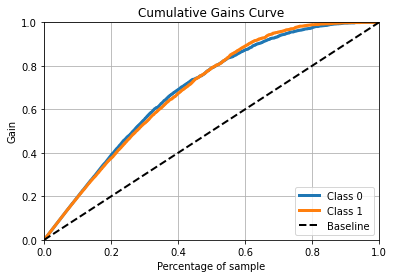

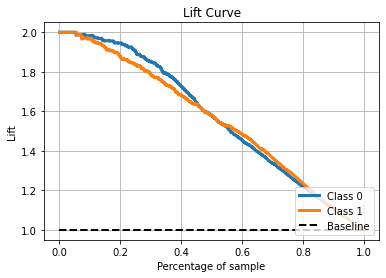

------------------------------------------------------------------------------------------------
Epoch1
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.84      0.69      0.76      1200
           1       0.73      0.87      0.80      1200

    accuracy                           0.78      2400
   macro avg       0.79      0.78      0.78      2400
weighted avg       0.79      0.78      0.78      2400



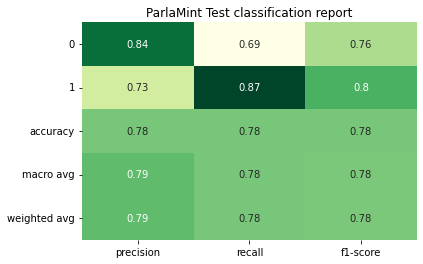


------------------------
  Confusion Matrix
------------------------


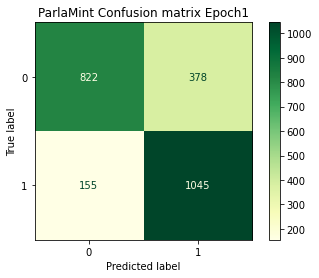

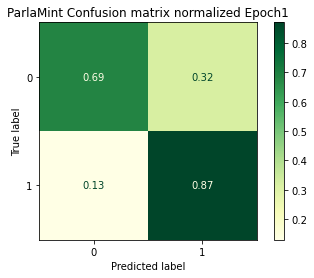

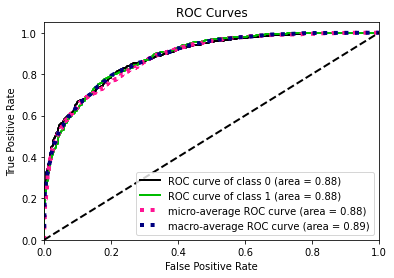

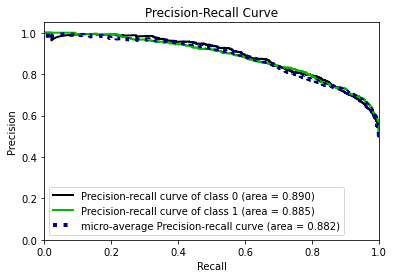

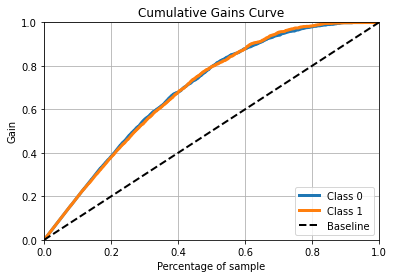

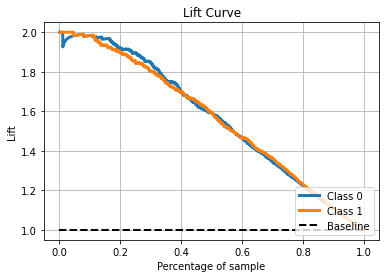

------------------------------------------------------------------------------------------------
Epoch2
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.80      0.81      0.81      1200
           1       0.81      0.80      0.80      1200

    accuracy                           0.80      2400
   macro avg       0.80      0.80      0.80      2400
weighted avg       0.80      0.80      0.80      2400



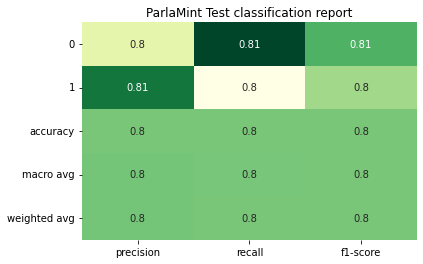


------------------------
  Confusion Matrix
------------------------


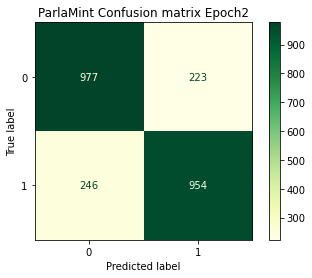

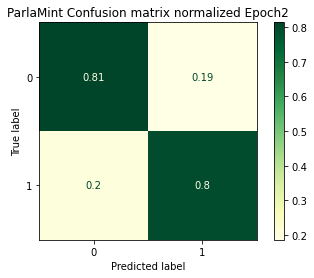

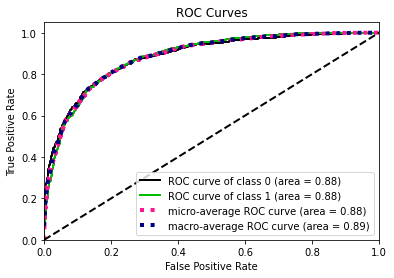

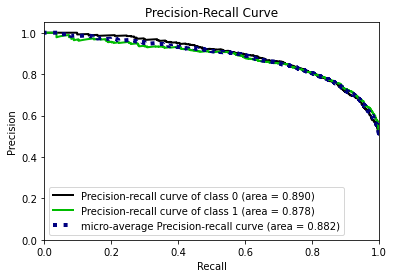

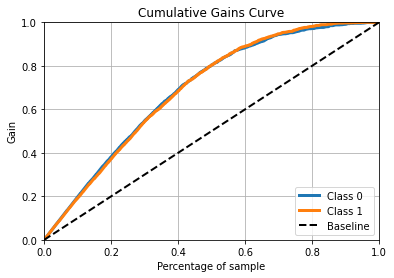

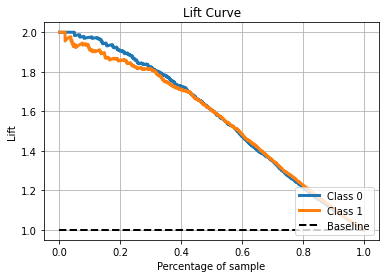

------------------------------------------------------------------------------------------------
Epoch3
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.78      0.84      0.81      1200
           1       0.83      0.76      0.79      1200

    accuracy                           0.80      2400
   macro avg       0.80      0.80      0.80      2400
weighted avg       0.80      0.80      0.80      2400



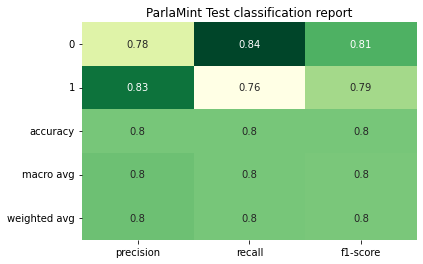


------------------------
  Confusion Matrix
------------------------


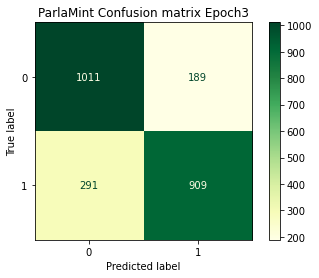

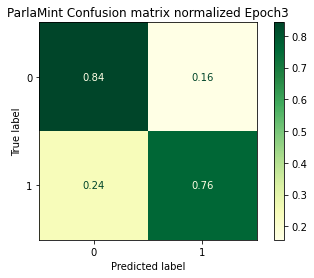

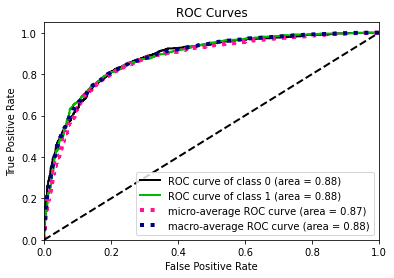

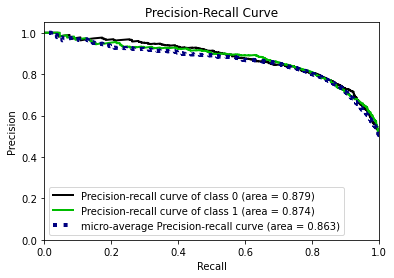

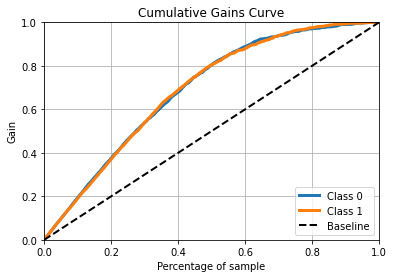

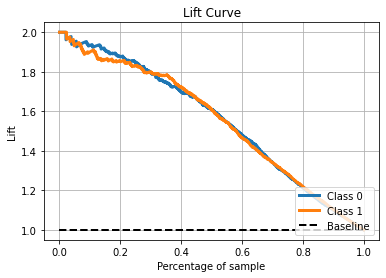

------------------------------------------------------------------------------------------------
Epoch4
------------------------
  Summary
------------------------
              precision    recall  f1-score   support

           0       0.79      0.83      0.81      1200
           1       0.82      0.78      0.80      1200

    accuracy                           0.80      2400
   macro avg       0.80      0.80      0.80      2400
weighted avg       0.80      0.80      0.80      2400



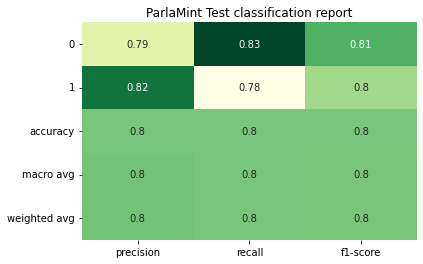


------------------------
  Confusion Matrix
------------------------


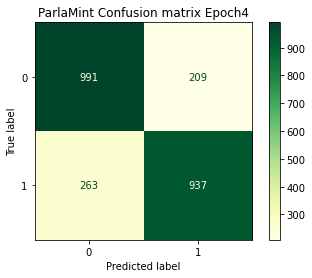

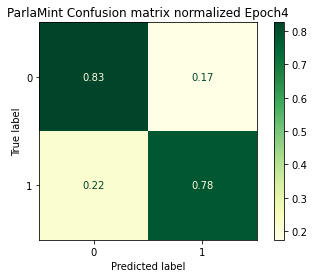

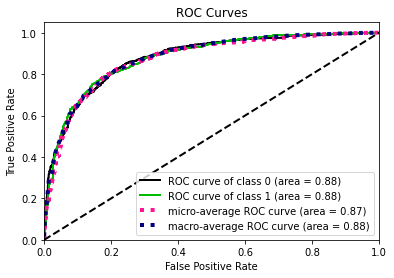

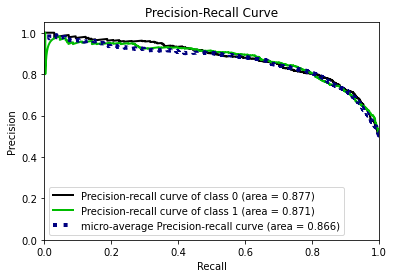

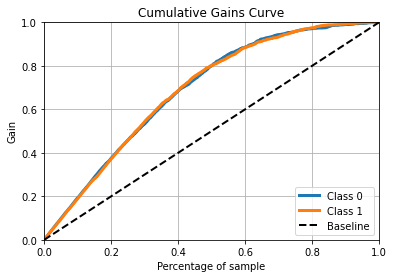

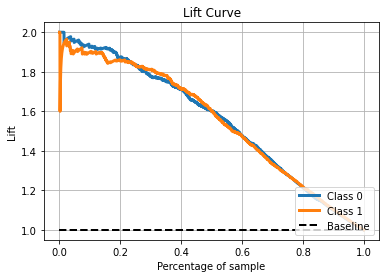

------------------------------------------------------------------------------------------------


In [50]:
lista_cm_normalizzate_bf_random_speech, lista_clf_report_bf_random_speech = \
        plot_classification_results(diz_random_speech_bf['df_random_speech'], True, diz_cmap['random_speech'])

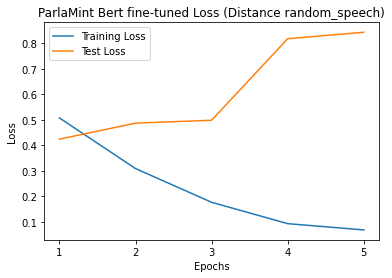

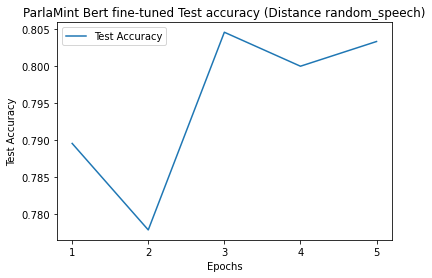

In [51]:
plot_loss_and_accuracy(diz_random_speech_bf['df_random_speech'], 'random_speech')

In [52]:
diz_dist_5_bf['df_dist_5']['Epoch0'].keys()

dict_keys(['accuracy', 'avg_loss', 'ids_proba', 'ids_preds', 'gold_classes', 'system_classes', 'label_list', 'probabilities', 'total_sentences_ids', 'training_loss', 'training_time', 'test_time'])

In [140]:
def plot_loss_and_accuracy_of_all_distances(list_of_diz):

    for diz, dist in zip(list_of_diz, ['5', '10', '20', '30', 'random_speech']):
        test_acc = []
        for epoch in diz:
            test_acc.append(diz[epoch]["accuracy"])

        plt.plot(range(1,len(num_epoch)+1), test_acc, label = "Distance {}".format(dist))
    
    plt.title("Bert fine-tuned Test accuracy summary".format(str(dist)))
    plt.xlabel("Epochs")
    plt.xticks(range(1,len(num_epoch)+1))
    plt.ylabel("Test Accuracy")
    plt.legend(bbox_to_anchor=(1, 1.03))
    plt.show()

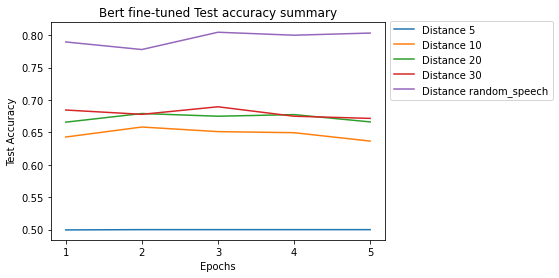

In [141]:
plot_loss_and_accuracy_of_all_distances([diz_dist_5_bf['df_dist_5'], diz_dist_10_bf['df_dist_10'], \
                                        diz_dist_20_bf['df_dist_20'], diz_dist_30_bf['df_dist_30'], \
                                        diz_random_speech_bf['df_random_speech']])

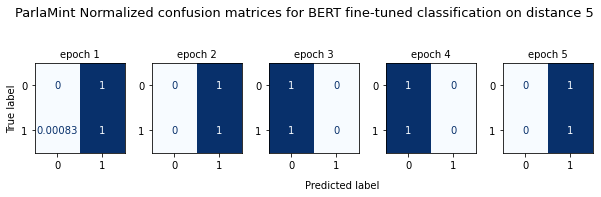

In [55]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_bf_5, 'BERT fine-tuned', '5', diz_cmap['5'])    

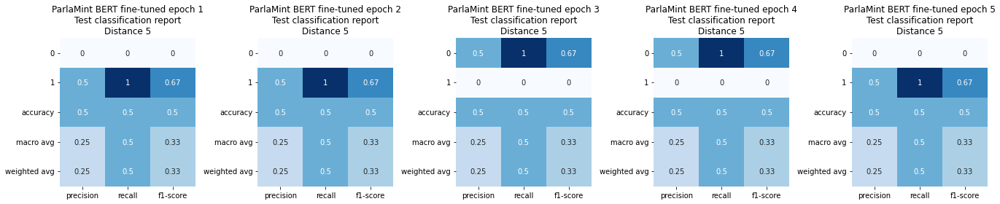

In [56]:
plot_all_classification_report(lista_clf_report_bf_5, '5', diz_cmap['5'], 'BERT fine-tuned')

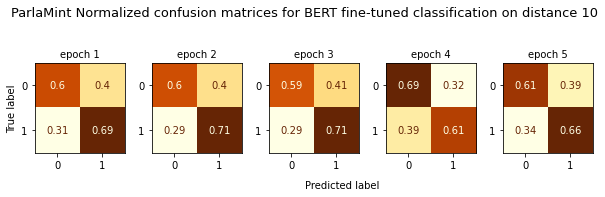

In [57]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_bf_10, 'BERT fine-tuned', '10', diz_cmap['10'])    

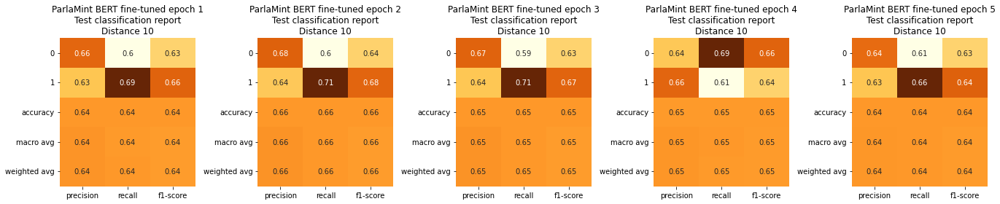

In [58]:
plot_all_classification_report(lista_clf_report_bf_10, '10', diz_cmap['10'], 'BERT fine-tuned')

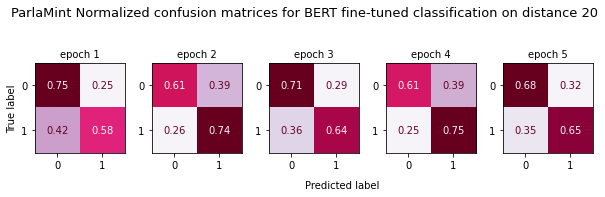

In [59]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_bf_20, 'BERT fine-tuned', '20', diz_cmap['20'])    

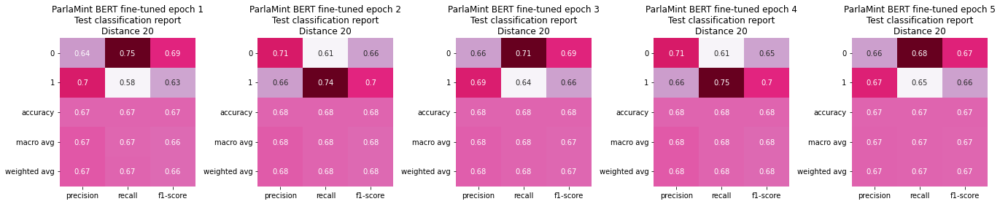

In [60]:
plot_all_classification_report(lista_clf_report_bf_20, '20', diz_cmap['20'], 'BERT fine-tuned')

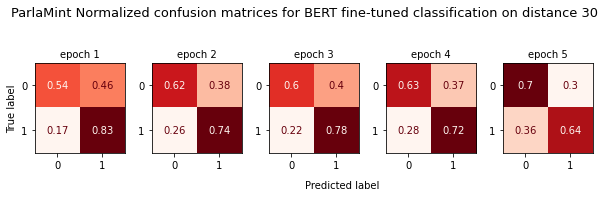

In [61]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_bf_30, 'BERT fine-tuned', '30', diz_cmap['30'])    

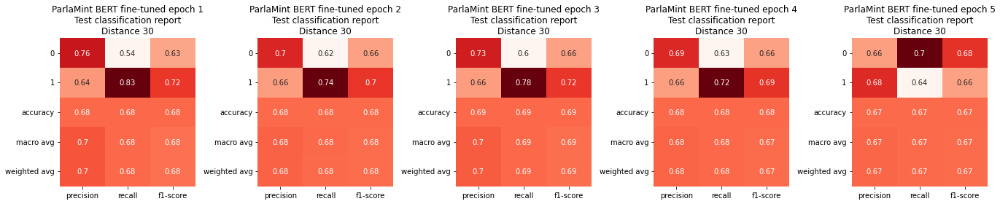

In [62]:
plot_all_classification_report(lista_clf_report_bf_30, '30', diz_cmap['30'], 'BERT fine-tuned')

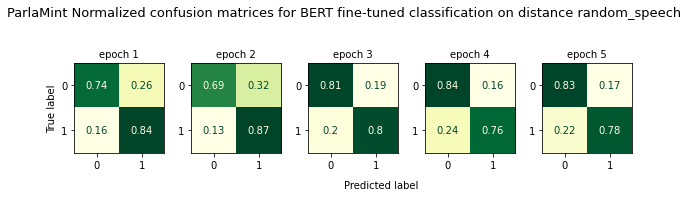

In [63]:
plot_all_normalized_confusion_matrices(lista_cm_normalizzate_bf_random_speech, 'BERT fine-tuned', \
                                       'random_speech', diz_cmap['random_speech'])

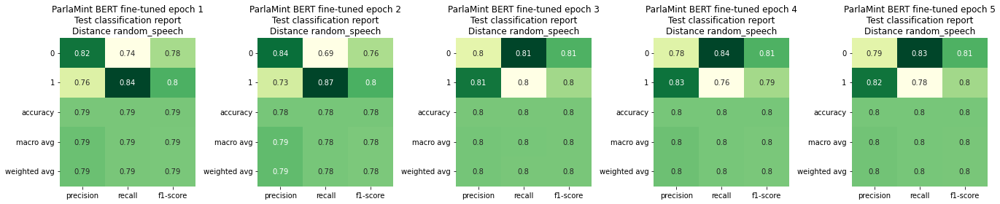

In [64]:
plot_all_classification_report(lista_clf_report_bf_random_speech, 'random_speech', diz_cmap['random_speech'], \
                               'BERT fine-tuned')

# Correlazione fra probabilità delle predizioni nei vari scenari di classificazione e le distanze coseniche

### Dataset con distanze coseniche

In [65]:
path_risorse = "../dataset/cosine_distances/"

In [66]:
df_dist_5_cosine_distance = pd.read_csv("{}df_dist_5_cosine_distance.csv".format(path_risorse), sep="\t")
df_dist_10_cosine_distance = pd.read_csv("{}df_dist_10_cosine_distance.csv".format(path_risorse), sep="\t")
df_dist_20_cosine_distance = pd.read_csv("{}df_dist_20_cosine_distance.csv".format(path_risorse), sep="\t")
df_dist_30_cosine_distance = pd.read_csv("{}df_dist_30_cosine_distance.csv".format(path_risorse), sep="\t")
df_random_speech_cosine_distance = pd.read_csv("{}df_random_speech_cosine_distance.csv".format(path_risorse), sep="\t")

In [67]:
df_dist_5_cosine_distance

,Id,Sentence_1,Sentence_2,Class,Cosine_distance_layer_1,Cosine_distance_layer_2,Cosine_distance_layer_3,Cosine_distance_layer_4,Cosine_distance_layer_5,Cosine_distance_layer_6,Cosine_distance_layer_7,Cosine_distance_layer_8,Cosine_distance_layer_9,Cosine_distance_layer_10,Cosine_distance_layer_11,Cosine_distance_layer_12
0,609543,"In conclusione, ai sensi della legge n. 196 de...",C'è però anche la parte relativa a cosa vuol f...,0,0.0147,0.0396,0.0268,0.0181,0.0193,0.0219,0.0272,0.0293,0.0197,0.0165,0.0206,0.0259
1,502050,Dovremo aumentare sempre di più la nostra capa...,Anche in questo caso i numeri sono netti e chi...,1,0.0397,0.0563,0.0466,0.0366,0.0428,0.0493,0.0554,0.0522,0.0600,0.0855,0.1056,0.1433
2,530468,"Signor Presidente, intervengo sui fatti che so...",Si tratta purtroppo di avvenimenti assai dolor...,0,0.0343,0.0475,0.0346,0.0299,0.0365,0.0470,0.0547,0.0723,0.0867,0.1253,0.1032,0.1737
3,353555,In alternativa alle comunicazioni tradizionali...,"Quindi, tra le questioni da affrontare ve ne s...",0,0.0184,0.0351,0.0535,0.0359,0.0309,0.0298,0.0296,0.0329,0.0593,0.1010,0.1385,0.0737
4,2969,Abbiamo marciato insieme a migliaia di persone...,"Ecco, le donne.",0,0.0424,0.0703,0.1094,0.0906,0.1019,0.1079,0.1218,0.1329,0.1596,0.2077,0.2909,0.2313
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2395,238536,L'articolo 28 costituisce un fondo finalizzato...,"In conclusione, auspico che questa Assemblea p...",1,0.0204,0.0573,0.0390,0.0276,0.0373,0.0437,0.0607,0.0594,0.0578,0.0608,0.0391,0.0320
2396,791915,"Non è vero, quindi, che si configura un doppio...","Infatti, se una persona fa retromarcia assolut...",0,0.0083,0.0173,0.0126,0.0105,0.0099,0.0090,0.0105,0.0096,0.0080,0.0093,0.0381,0.0991
2397,99749,Noi viviamo in una Nazione che ancora mantiene...,"Colleghi, questo è l'ultimo intervento.",1,0.0295,0.0406,0.0386,0.0316,0.0320,0.0367,0.0569,0.0526,0.0402,0.0444,0.0536,0.1033
2398,744069,Faccio riferimento a questo punto per far comp...,Abbiamo fatto anche un altro lavoro di merito ...,0,0.0167,0.0345,0.0216,0.0188,0.0254,0.0254,0.0301,0.0278,0.0244,0.0290,0.0378,0.0359


# Verifica della distribuzione delle distanze coseniche

**Per capire quale metodo di correlazione applicare fra probabilità e distanze coseniche, verifichiamo se le distanze coseniche sono normalmente distribuite oppure no**

-------------------------------------------------------------------------------------------------------------------
#### Pearson’s Correlation

The Pearson correlation coefficient (named for Karl Pearson) can be used to summarize the strength of the linear relationship between two data samples.

The Pearson’s correlation coefficient is calculated as the covariance of the two variables divided by the product of the standard deviation of each data sample. It is the normalization of the covariance between the two variables to give an interpretable score.

**The use of mean and standard deviation in the calculation suggests the need for the two data samples to have a Gaussian or Gaussian-like distribution.**

The result of the calculation, the correlation coefficient can be interpreted to understand the relationship.

The coefficient returns a value between -1 and 1 that represents the limits of correlation from a full negative correlation to a full positive correlation. A value of 0 means no correlation. The value must be interpreted, where often a value below -0.5 or above 0.5 indicates a notable correlation, and values below those values suggests a less notable correlation.



#### Spearman’s Correlation

Two variables may be related by a nonlinear relationship, such that the relationship is stronger or weaker across the distribution of the variables.

Further, the two variables being considered may have a non-Gaussian distribution.

In this case, the Spearman’s correlation coefficient (named for Charles Spearman) can be used to summarize the strength between the two data samples. This test of relationship can also be used if there is a linear relationship between the variables, but will have slightly less power (e.g. may result in lower coefficient scores).

As with the Pearson correlation coefficient, the scores are between -1 and 1 for perfectly negatively correlated variables and perfectly positively correlated respectively.

Instead of calculating the coefficient using covariance and standard deviations on the samples themselves, these statistics are calculated from the relative rank of values on each sample. **This is a common approach used in non-parametric statistics, e.g. statistical methods where we do not assume a distribution of the data such as Gaussian.**


Fonte: https://machinelearningmastery.com/how-to-use-correlation-to-understand-the-relationship-between-variables/

-------------------------------------------------------------------------------------------------------------------

Controlliamo dunque se la distribuzione delle distanze coseniche è simile a una gaussiana con i metodi **_shapiro_**, **_normaltest_** e **_kstes_t**

In [68]:
def controlla_distribuzione_distanze_coseniche(df):
    
    #Metodo shapiro
    for column_name in df.columns:
        if "Cosine_distance" in column_name:
            data = df[column_name]
            test_stat, pvalue = shapiro(data)
            if pvalue >= 0.05:
                print('The column {} is taken from a normally distributed population ({} method)'.format(column_name, "shapiro"))
                
    #Metodo normaltest
    for column_name in df.columns:
        if "Cosine_distance" in column_name:
            data = df[column_name]
            test_stat, pvalue = normaltest(data)
            if pvalue >= 0.05:
                print('The column {} is taken from a normally distributed population ({} method)'.format(column_name, "normaltest"))
            
    #Metodo kstest
    for column_name in df.columns:
        if "Cosine_distance" in column_name:
            data = df[column_name]
            test_stat, pvalue = kstest(data, 'norm')
            if pvalue >= 0.05:
                print('The column {} is taken from a normally distributed population ({} method)'.format(column_name, "kstest"))

In [69]:
controlla_distribuzione_distanze_coseniche(df_dist_5_cosine_distance)

In [70]:
controlla_distribuzione_distanze_coseniche(df_dist_10_cosine_distance)

In [71]:
controlla_distribuzione_distanze_coseniche(df_dist_20_cosine_distance)

In [72]:
controlla_distribuzione_distanze_coseniche(df_dist_30_cosine_distance)

In [73]:
controlla_distribuzione_distanze_coseniche(df_random_speech_cosine_distance)

**In nessuno dei dataset troviamo distanze coseniche normalmente distribuite, dunque useremo la Spearman’s Correlation**

**scipy.stats.spearmanr** (https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.spearmanr.html#scipy-stats-spearmanr)

Calculate a Spearman correlation coefficient with associated p-value.

The Spearman rank-order correlation coefficient is a nonparametric measure of the monotonicity of the relationship between two datasets. Unlike the Pearson correlation, the Spearman correlation does not assume that both datasets are normally distributed. Like other correlation coefficients, this one varies between -1 and +1 with 0 implying no correlation. Correlations of -1 or +1 imply an exact monotonic relationship. Positive correlations imply that as x increases, so does y. Negative correlations imply that as x increases, y decreases.

In [74]:
from scipy.stats import spearmanr

**Per ogni previsione delle coppie, correlare gli score di probabilità dei classificatori con le distanze dei coseni**, per vedere se correlano con la coerenza supervised o no.

## Correlazione BERT unsupervised (coseni) - SVM

**Controlliamo che gli id degli eventi di test di ogni classificatore svm corrispondano agli id di test dei dataset delle distanze coseniche**

In [75]:
def verifica_uguaglianza_ids_clf_df(clf_ids_proba, df):
    list_ids_clf = list(clf_ids_proba)
    list_ids_df_cos_dist = list(df.Id)

    for id_1, id_2 in zip(list_ids_clf, list_ids_df_cos_dist):
        if id_1 != id_2:
            print(id_1, id_2, "Diverso!")

In [76]:
def controlla_ids_clf(diz, df):
    
    for clf in diz:
        verifica_uguaglianza_ids_clf_df(diz[clf]['ids_proba'].keys(), df)   

In [77]:
controlla_ids_clf(diz_dist_5_svm['df_dist_5'], df_dist_5_cosine_distance)

In [78]:
controlla_ids_clf(diz_dist_10_svm['df_dist_10'], df_dist_10_cosine_distance)

In [79]:
controlla_ids_clf(diz_dist_20_svm['df_dist_20'], df_dist_20_cosine_distance)

In [80]:
controlla_ids_clf(diz_dist_30_svm['df_dist_30'], df_dist_30_cosine_distance)

In [81]:
controlla_ids_clf(diz_random_speech_svm['df_random_speech'], df_random_speech_cosine_distance)

In [83]:
pd.DataFrame.from_dict(diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba'], \
                                       columns=["proba_{}".format(k) for k in [0, 1]], orient='index')

,proba_0,proba_1
609543,0.499753,0.500247
502050,0.491225,0.508775
530468,0.508306,0.491694
353555,0.496251,0.503749
2969,0.480991,0.519009
...,...,...
238536,0.513085,0.486915
791915,0.500171,0.499829
99749,0.487853,0.512147
744069,0.481718,0.518282


In [84]:
def get_probabilities_dataset(diz, df_cosine_distance):
    
    dataset_complessivo = pd.DataFrame()
    
    #calcolo, per ogni livello, la correlazione fra le distanze coseniche di quel livello e le probabilità prodotte 
    #dal classificatore svm corrispondente 
    #Es.: le probabilità prodotte dal classificatore che ha utilizzato le features del livello 1 di BERT saranno 
    #correlate con le distanze coseniche calcolate sui vettori del il primo livello del BERT unsupervised
    
    for i in range(1,13):
        
        columns=["proba_{}".format(k) for k in [0, 1]]
        
        #formo un dataset prendo le probabilità del classificatore di un certo livello 
        #Es.: diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba']
        df_tmp = pd.DataFrame.from_dict(diz['clf_{}'.format(str(i))]['ids_proba'], \
                                       columns=columns, orient='index')
        
        ids = df_tmp.index
        
        #resetto l'indice
        df_tmp.reset_index(inplace=True, drop=True)

        #concateno il dataset delle probabilità con il dataset delle distanze coseniche dello stesso livello 
        df_proba_cosine_distances = pd.concat([df_tmp, df_cosine_distance[["Cosine_distance_layer_{}".format(i)]]], axis = 1)

        #dato che gli id degli eventi sono uguali inserisco la colonna degli id alla fine al dataset completo
        df_proba_cosine_distances.insert(0, 'Id', ids)
        
        #lista_dataset.append(df_proba_cosine_distances)
        
        #calcolo le correlazioni fra le probabilità del classificatore e le distanze coseniche dello stesso livello
        df_proba_cosine_distances_corr = df_proba_cosine_distances.corr(method='spearman')
        
        #display(df_proba_cosine_distances_corr)
        
        #elimino dal dataset della correlazione le autocorrelazioni
        columns.append('Id')
        df_proba_cosine_distances_corr.drop(columns, axis=1, inplace=True)
        df_proba_cosine_distances_corr.drop(["Id", "Cosine_distance_layer_{}".format(i)], axis=0, inplace=True)
        
        #display(df_proba_cosine_distances_corr)
        
        #aggiungo le correlazioni fra probabilità del classificatore e le distanze coseniche dello stesso livello
        #al dataset che contiene tutte le correlazioni fra probabilità dei classificatori e distanze coseniche 
        #del rispettivo livello
        dataset_complessivo = pd.concat([dataset_complessivo, df_proba_cosine_distances_corr.T])
                
        #plt.show()
        
    
    return dataset_complessivo

In [85]:
def plot_correlation_heatmap(df, dist, cmap):
    
    fig,bx = plt.subplots(1)
    heatmap = bx.pcolor(df, edgecolors='k', cmap=cmap, vmin=-1, vmax=1)

    '''for y in range(df_proba_cosine_distances_dist_5.shape[0]):
        for x in range(df_proba_cosine_distances_dist_5.shape[1]):
            print(x, y)
            plt.text(x + 0.5, y + 0.5, '%.4f' % df_proba_cosine_distances_dist_5[y, x],
                     horizontalalignment='center',
                     verticalalignment='center',
                     )'''

    cbar = plt.colorbar(heatmap, pad=0.5)

    ax = bx.twinx()

    ax.set_yticks(np.arange(0.5, len(df.index), 1))
    ax.set_xticks(np.arange(0.5, len(df.columns), 1), )
    ax.set_xticklabels(df.columns, rotation=10)
    ax.set_yticklabels(df.index,fontsize=10)
    bx.set_yticks(np.arange(0.5, len(df.index), 1))
    bx.set_yticklabels(["Clf_{}".format(i) for i in range(1,13)],fontsize=10)
    ax.set_ylim([0,12])
    bx.set_ylim([0,12])
    ax.invert_yaxis()
    bx.invert_yaxis()
    
    for y in range(df.shape[0]):
            for x in range(df.shape[1]):
                plt.text(x+ 0.5, y+ 0.5, '%.4f' % df.iloc[y, x],
                    horizontalalignment='center',
                    verticalalignment='center',
                         color = 'white',
                         fontsize = 10
              )
    
    plt.title("{} \nCosine distances - SVM's correlations \nDistance {}".format(risorsa, dist), fontsize=12)

    plt.show()

In [86]:
df_proba_cosine_distances_dist_5 = get_probabilities_dataset(diz_dist_5_svm['df_dist_5'], df_dist_5_cosine_distance)

In [87]:
df_proba_cosine_distances_dist_5

,proba_0,proba_1
Cosine_distance_layer_1,-0.071379,0.071379
Cosine_distance_layer_2,-0.013909,0.013909
Cosine_distance_layer_3,-0.012251,0.012251
Cosine_distance_layer_4,-0.040808,0.040808
Cosine_distance_layer_5,-0.016670,0.016670
Cosine_distance_layer_6,-0.035167,0.035167
Cosine_distance_layer_7,-0.037160,0.037160
Cosine_distance_layer_8,-0.039395,0.039395
Cosine_distance_layer_9,-0.037073,0.037073
Cosine_distance_layer_10,-0.045527,0.045527


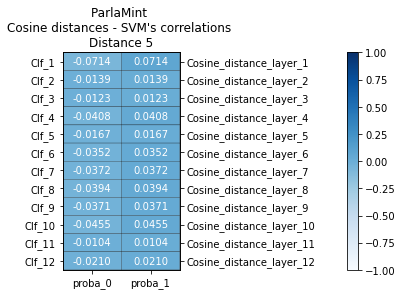

In [88]:
plot_correlation_heatmap(df_proba_cosine_distances_dist_5, "5", diz_cmap['5'])

In [89]:
#Esempio: prendo lista delle probabilità del clf_1 - distanza 5 per la classe 1 (non segue) e le distanze coseniche
#del livello 1
corr, _ = spearmanr([diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba'][i][1] \
                     for i in diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba']], \
                    df_dist_5_cosine_distance['Cosine_distance_layer_1'])

print(corr)

0.0713789197252815


In [90]:
df_proba_cosine_distances_dist_10 = get_probabilities_dataset(diz_dist_10_svm['df_dist_10'], df_dist_10_cosine_distance)

In [91]:
df_proba_cosine_distances_dist_10

,proba_0,proba_1
Cosine_distance_layer_1,-0.046199,0.046199
Cosine_distance_layer_2,0.013394,-0.013394
Cosine_distance_layer_3,-0.028827,0.028827
Cosine_distance_layer_4,-0.016698,0.016698
Cosine_distance_layer_5,-0.010902,0.010902
Cosine_distance_layer_6,-0.020615,0.020615
Cosine_distance_layer_7,0.001761,-0.001761
Cosine_distance_layer_8,-0.025627,0.025627
Cosine_distance_layer_9,-0.029378,0.029378
Cosine_distance_layer_10,-0.031137,0.031137


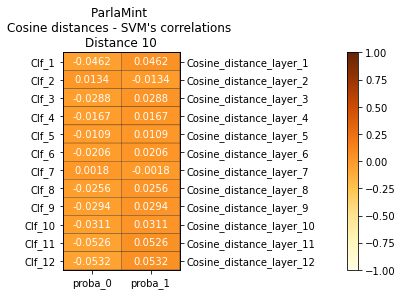

In [92]:
plot_correlation_heatmap(df_proba_cosine_distances_dist_10, "10", diz_cmap['10'])

In [93]:
df_proba_cosine_distances_dist_20 = get_probabilities_dataset(diz_dist_20_svm['df_dist_20'], df_dist_20_cosine_distance)

In [94]:
df_proba_cosine_distances_dist_20

,proba_0,proba_1
Cosine_distance_layer_1,-0.091285,0.091285
Cosine_distance_layer_2,-0.046529,0.046529
Cosine_distance_layer_3,-0.050857,0.050857
Cosine_distance_layer_4,-0.019884,0.019884
Cosine_distance_layer_5,-0.051240,0.051240
Cosine_distance_layer_6,-0.075392,0.075392
Cosine_distance_layer_7,-0.051241,0.051241
Cosine_distance_layer_8,-0.043679,0.043679
Cosine_distance_layer_9,-0.054481,0.054481
Cosine_distance_layer_10,-0.076740,0.076740


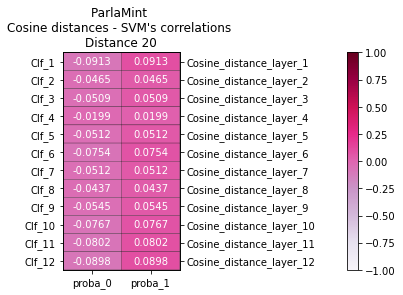

In [95]:
plot_correlation_heatmap(df_proba_cosine_distances_dist_20, "20", diz_cmap['20'])

In [96]:
df_proba_cosine_distances_dist_30 = get_probabilities_dataset(diz_dist_30_svm['df_dist_30'], df_dist_30_cosine_distance)

In [97]:
df_proba_cosine_distances_dist_30

,proba_0,proba_1
Cosine_distance_layer_1,-0.032372,0.032372
Cosine_distance_layer_2,0.021750,-0.021750
Cosine_distance_layer_3,-0.028441,0.028441
Cosine_distance_layer_4,-0.030665,0.030665
Cosine_distance_layer_5,-0.033114,0.033114
Cosine_distance_layer_6,-0.044176,0.044176
Cosine_distance_layer_7,-0.036245,0.036245
Cosine_distance_layer_8,-0.034883,0.034883
Cosine_distance_layer_9,-0.022953,0.022953
Cosine_distance_layer_10,-0.053718,0.053718


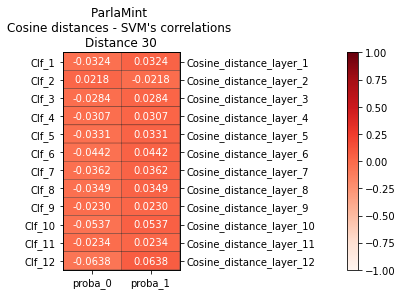

In [98]:
plot_correlation_heatmap(df_proba_cosine_distances_dist_30, "30", diz_cmap['30'])

In [99]:
#Esempio: prendo lista delle probabilità del clf_1 - distanza 5 per la classe 1 (non segue) e le distanze coseniche
#del livello 1
corr, _ = spearmanr([diz_dist_30_svm['df_dist_30']['clf_11']['ids_proba'][i][0] \
                     for i in diz_dist_30_svm['df_dist_30']['clf_11']['ids_proba']], \
                    df_dist_30_cosine_distance['Cosine_distance_layer_11'])

print(corr)

-0.023408017187858045


In [100]:
df_proba_cosine_distances_random_speech = get_probabilities_dataset(diz_random_speech_svm['df_random_speech'], \
                                                        df_random_speech_cosine_distance)

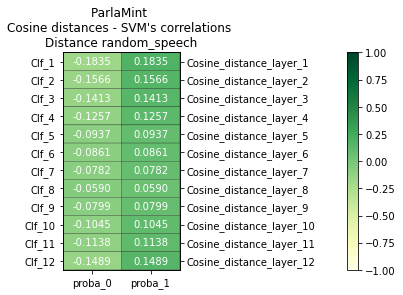

In [101]:
plot_correlation_heatmap(df_proba_cosine_distances_random_speech, "random_speech", diz_cmap['random_speech'])

## Correlazione BERT unsupervised (coseni) -  Bert finetunato

In [102]:
def get_probabilities_dataset_for_comparison_with_finetuning(diz, df_cosine_distance):
    
    df_proba = pd.DataFrame()
    
    for i in range(0,5):
        df_tmp = pd.DataFrame.from_dict(diz['Epoch{}'.format(str(i))]['ids_proba'], \
                                       columns=["Epoch{}_proba_{}".format(i, k) for k in [0, 1]], orient='index')
        
        df_proba = pd.concat([df_proba, df_tmp], axis = 1)
        
    ids = df_proba.index

    df_proba.reset_index(inplace=True, drop=True)

    df_proba_cosine_distances = pd.concat([df_proba, df_cosine_distance[[col for col in df_cosine_distance if "Cosine_distance" in col]]], axis = 1)

    df_proba_cosine_distances.insert(0, 'Id', ids)
    
    return df_proba_cosine_distances

In [103]:
def get_correlation_matrix(df, dist, cmap):
    
    df_corr_orig = df.corr(method='spearman')
    
    df_corr = df_corr_orig.copy()
    
    cols = [col for col in df_corr.columns if 'Epoch' in col]
    cols.append('Id')

    df_corr.drop(cols, axis=1, inplace=True)
    
    rows = [col for col in df_corr.columns if 'Cosine' in col]
    rows.append('Id')

    df_corr.drop(rows, axis = 0, inplace=True)
    
    fig, ax = plt.subplots(figsize=(12,7))
    sns.heatmap(df_corr, cmap=cmap, annot = True, fmt = '.2f', vmin=-1, vmax=1)
    
    plt.title("{} Cosine distances - Bert fine-tuned's correlations \nDistance {}".format(risorsa, dist))
    
    plt.show()
    
    return df_corr_orig

In [104]:
#Esempio: prendo lista delle probabilità dell' Epoca 4 - distanza 5 per la classe 1 (non segue) e le distanze coseniche
#del livello 2
corr, _ = spearmanr([diz_dist_5_bf['df_dist_5']['Epoch4']['ids_proba'][i][1] \
                     for i in diz_dist_5_bf['df_dist_5']['Epoch4']['ids_proba']], \
                    df_dist_5_cosine_distance['Cosine_distance_layer_3'])

print("%.2f" %corr)

0.03


In [105]:
df_bert_finetuning_proba_cosine_distances_dist_5 = \
    get_probabilities_dataset_for_comparison_with_finetuning(diz_dist_5_bf['df_dist_5'], df_dist_5_cosine_distance)

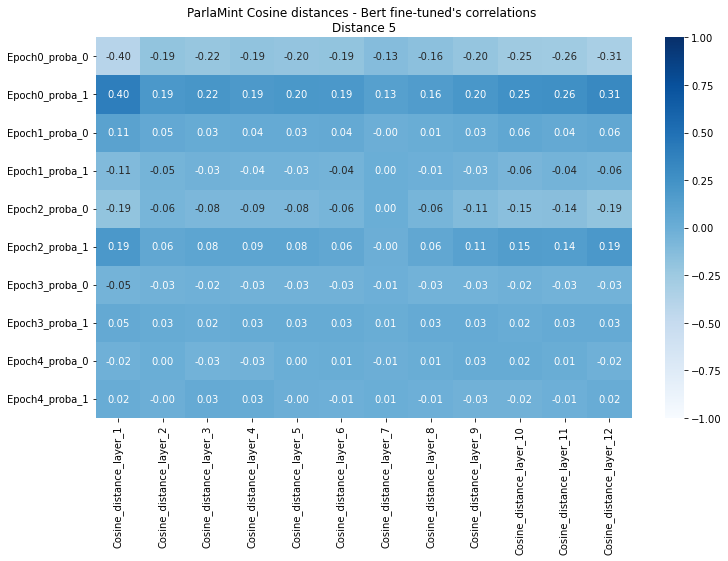

In [106]:
df_bert_finetuning_proba_cosine_distances_dist_5_corr_orig = \
        get_correlation_matrix(df_bert_finetuning_proba_cosine_distances_dist_5, '5', diz_cmap['5'])

In [107]:
df_bert_finetuning_proba_cosine_distances_dist_10 = \
    get_probabilities_dataset_for_comparison_with_finetuning(diz_dist_10_bf['df_dist_10'], \
                                                             df_dist_10_cosine_distance)

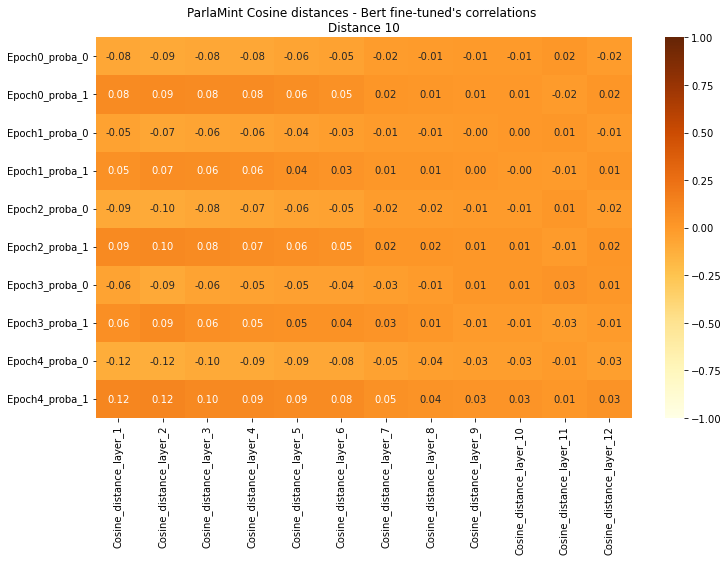

In [108]:
df_bert_finetuning_proba_cosine_distances_dist_10_corr_orig = \
        get_correlation_matrix(df_bert_finetuning_proba_cosine_distances_dist_10, '10', diz_cmap['10'])

In [109]:
df_bert_finetuning_proba_cosine_distances_dist_20 = \
    get_probabilities_dataset_for_comparison_with_finetuning(diz_dist_20_bf['df_dist_20'], \
                                                             df_dist_20_cosine_distance)

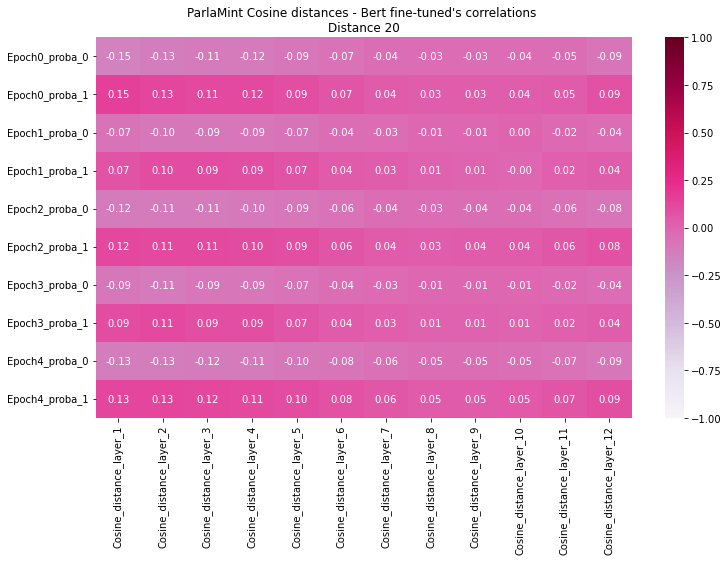

In [110]:
df_bert_finetuning_proba_cosine_distances_dist_20_corr_orig = \
        get_correlation_matrix(df_bert_finetuning_proba_cosine_distances_dist_20, '20', diz_cmap['20'])

In [111]:
df_bert_finetuning_proba_cosine_distances_dist_30 = \
    get_probabilities_dataset_for_comparison_with_finetuning(diz_dist_30_bf['df_dist_30'], \
                                                             df_dist_30_cosine_distance)

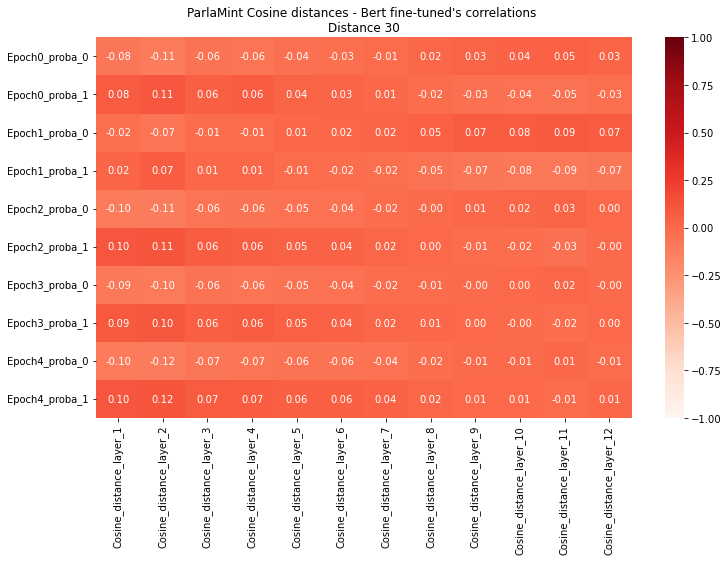

In [112]:
df_bert_finetuning_proba_cosine_distances_dist_30_corr_orig = \
        get_correlation_matrix(df_bert_finetuning_proba_cosine_distances_dist_30, '30', diz_cmap['30'])

In [113]:
df_bert_finetuning_proba_cosine_distances_random_speech = \
    get_probabilities_dataset_for_comparison_with_finetuning(diz_random_speech_bf['df_random_speech'], \
                                                             df_random_speech_cosine_distance)

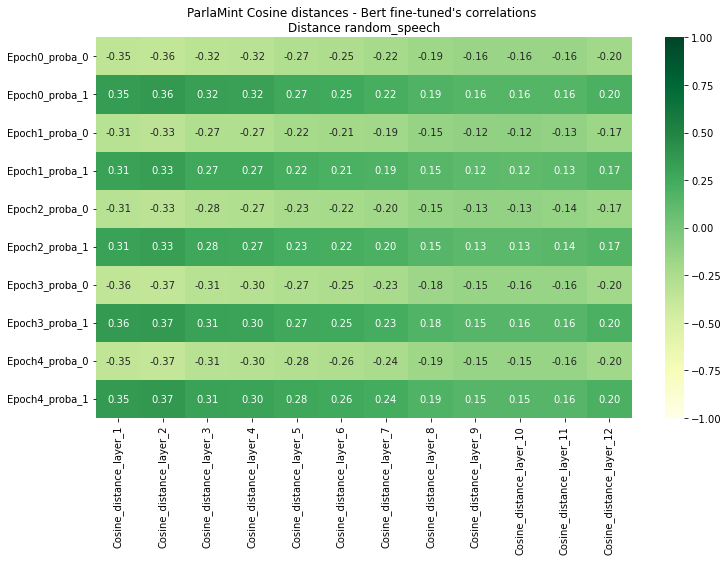

In [114]:
df_bert_finetuning_proba_cosine_distances_random_speech_corr_orig = \
        get_correlation_matrix(df_bert_finetuning_proba_cosine_distances_random_speech, 'random_speech', \
                               diz_cmap['random_speech'])


# Correlazione SVM - Bert finetunato

In [115]:
def get_proba_df_svm_bert_finetunato(diz_svm, diz_bert_finetuned, num_epoch):
    
    dataset_complessivo = pd.DataFrame(dtype=float)
    
    #calcolo, per ogni livello, la correlazione fra le distanze coseniche di quel livello e le probabilità prodotte 
    #dal classificatore svm corrispondente 
    #Es.: le probabilità prodotte dal classificatore che ha utilizzato le features del livello 1 di BERT saranno 
    #correlate con le distanze coseniche calcolate sui vettori del il primo livello del BERT unsupervised

        
    for i in range(1,13):
        
        df_tmp = pd.DataFrame(index=['clf_{}'.format(i)], columns=["proba_{}".format(k) for k in [0, 1]], \
                             dtype=float)
                
        #formo un dataset prendo le probabilità del classificatore di un certo livello 
        #Es.: diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba']
        
        clf = 'clf_{}'.format(str(i))
        epoch = 'Epoch{}'.format(str(num_epoch))
        
        proba_0_svm = [diz_svm[clf]['ids_proba'][i][0] for i in diz_svm[clf]['ids_proba']]
        
        proba_0_bert_finetuned = [diz_bert_finetuned[epoch]['ids_proba'][i][0] \
                     for i in diz_bert_finetuned[epoch]['ids_proba']]
        
        proba_1_svm = [diz_svm[clf]['ids_proba'][i][1] for i in diz_svm[clf]['ids_proba']]
        
        proba_1_bert_finetuned = [diz_bert_finetuned[epoch]['ids_proba'][i][1] \
                     for i in diz_bert_finetuned[epoch]['ids_proba']]
        
        corr_0, _ = spearmanr(proba_0_svm, proba_0_bert_finetuned)
        corr_1, _ = spearmanr(proba_1_svm, proba_1_bert_finetuned)
                
        df_tmp.loc[clf]['proba_0'] = corr_0
        df_tmp.loc[clf]['proba_1'] = corr_1
        
        dataset_complessivo = pd.concat([dataset_complessivo, df_tmp], axis = 0)
    
    return dataset_complessivo

In [116]:
def plot_correlation_heatmap_bert_svm(epoch_df_list, dist, cmap):
    
    fig,ax = plt.subplots(1, 5, figsize=(20,6), constrained_layout=True)
    
    for i, df in enumerate(epoch_df_list):
        heatmap = ax[i].pcolor(df, edgecolors='k', cmap=cmap, vmin=-1, vmax=1)

        #cbar = plt.colorbar(heatmap, pad=0.3, ax=ax[i])

        bx = ax[i].twinx()

        ax[i].set_yticks(np.arange(0.5, len(df.index), 1))
        ax[i].set_xticks(np.arange(0.5, len(df.columns), 1), )
        ax[i].set_xticklabels(df.columns,fontsize=13)
        ax[i].set_yticklabels(df.index,fontsize=13)
        bx.set_yticks(np.arange(0.5, len(df.index), 1))
        bx.set_yticklabels(["Epoch{}".format(i) for j in range(1,13)],fontsize=13)
        ax[i].set_ylim([0,12])
        bx.set_ylim([0,12])
        ax[i].invert_yaxis()
        bx.invert_yaxis()
        
        for y in range(df.shape[0]):
            for x in range(df.shape[1]):
                plt.text(x+ 0.5, y+ 0.5, '%.4f' % df.iloc[y, x],
                    horizontalalignment='center',
                    verticalalignment='center',
                         color = 'white',
                         fontsize = 13
              )

        plt.title("{} \nBert finetuned - \nSVM's correlations \nDistance {} - Epoch {}".format(risorsa, str(dist), i), fontsize=14)
    
    fig.colorbar(heatmap, pad=0.3)
    plt.show()

In [117]:
#Esempio
corr, _ = spearmanr([diz_dist_5_bf['df_dist_5']['Epoch0']['ids_proba'][i][0] \
                     for i in diz_dist_5_bf['df_dist_5']['Epoch0']['ids_proba']], \
                    
                    [diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba'][i][0] \
                     for i in diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba']])

corr1, _ = spearmanr([diz_dist_5_bf['df_dist_5']['Epoch0']['ids_proba'][i][1] \
                     for i in diz_dist_5_bf['df_dist_5']['Epoch0']['ids_proba']], \
                    
                    [diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba'][i][1] \
                     for i in diz_dist_5_svm['df_dist_5']['clf_1']['ids_proba']])

print(corr, corr1)

0.03750030255573069 0.03748578344949872


In [118]:
list_df_bert_finetuning_proba_svm_dist_5 = [] 

for i in num_epoch:
    list_df_bert_finetuning_proba_svm_dist_5.append(get_proba_df_svm_bert_finetunato(diz_dist_5_svm['df_dist_5'], \
                                                                  diz_dist_5_bf['df_dist_5'], i))

/var/folders/zr/x6zkwkj55dl2mb3rc8k8h1_h0000gn/T/ipykernel_59913/1074886370.py:34: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig.colorbar(heatmap, pad=0.3)


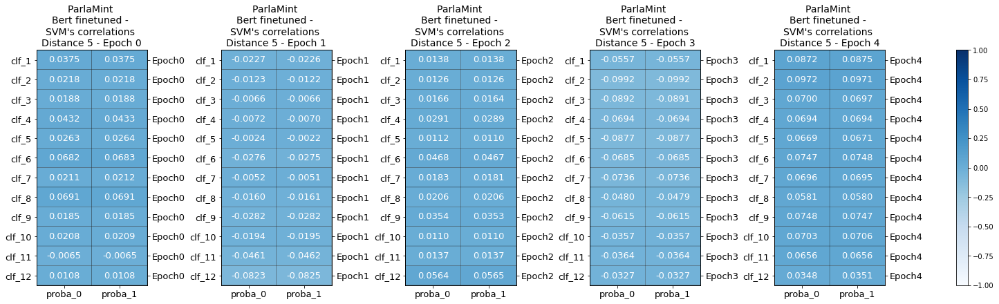

In [119]:
plot_correlation_heatmap_bert_svm(list_df_bert_finetuning_proba_svm_dist_5, 5, diz_cmap['5'])

In [120]:
list_df_bert_finetuning_proba_svm_dist_10 = [] 

for i in num_epoch:
    list_df_bert_finetuning_proba_svm_dist_10.append(get_proba_df_svm_bert_finetunato(diz_dist_10_svm['df_dist_10'],\
                                                                            diz_dist_10_bf['df_dist_10'], i))

/var/folders/zr/x6zkwkj55dl2mb3rc8k8h1_h0000gn/T/ipykernel_59913/1074886370.py:34: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig.colorbar(heatmap, pad=0.3)


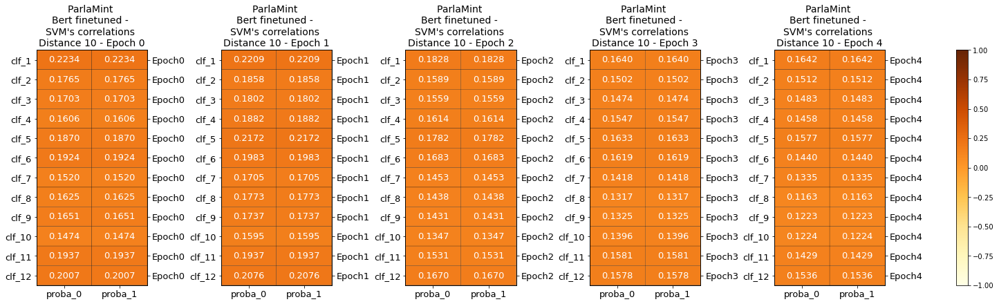

In [121]:
plot_correlation_heatmap_bert_svm(list_df_bert_finetuning_proba_svm_dist_10, 10, diz_cmap['10'])

In [122]:
list_df_bert_finetuning_proba_svm_dist_20 = []

for i in num_epoch:
    list_df_bert_finetuning_proba_svm_dist_20.append(get_proba_df_svm_bert_finetunato(diz_dist_20_svm['df_dist_20'],\
                                                                            diz_dist_20_bf['df_dist_20'], i))

/var/folders/zr/x6zkwkj55dl2mb3rc8k8h1_h0000gn/T/ipykernel_59913/1074886370.py:34: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig.colorbar(heatmap, pad=0.3)


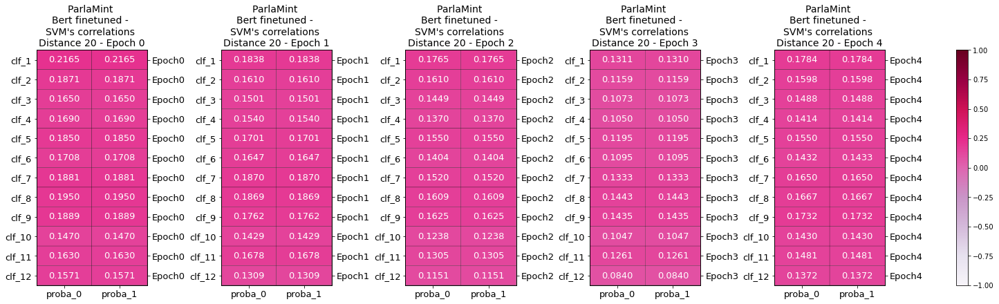

In [123]:
plot_correlation_heatmap_bert_svm(list_df_bert_finetuning_proba_svm_dist_20, 20, diz_cmap['20'])

In [124]:
#Esempio
corr, _ = spearmanr([diz_dist_20_bf['df_dist_20']['Epoch0']['ids_proba'][i][0] \
                     for i in diz_dist_20_bf['df_dist_20']['Epoch0']['ids_proba']], \
                    
                    [diz_dist_20_svm['df_dist_20']['clf_1']['ids_proba'][i][0] \
                     for i in diz_dist_20_svm['df_dist_20']['clf_1']['ids_proba']])

corr1, _ = spearmanr([diz_dist_20_bf['df_dist_20']['Epoch0']['ids_proba'][i][1] \
                     for i in diz_dist_20_bf['df_dist_20']['Epoch0']['ids_proba']], \
                    
                    [diz_dist_20_svm['df_dist_20']['clf_1']['ids_proba'][i][1] \
                     for i in diz_dist_20_svm['df_dist_20']['clf_1']['ids_proba']])

print(corr, corr1)

0.21652209406615283 0.21652238443079133


In [125]:
list_df_bert_finetuning_proba_svm_dist_30 = []

for i in num_epoch:    
    list_df_bert_finetuning_proba_svm_dist_30.append(get_proba_df_svm_bert_finetunato(diz_dist_30_svm['df_dist_30'],\
                                                                            diz_dist_30_bf['df_dist_30'], i))

/var/folders/zr/x6zkwkj55dl2mb3rc8k8h1_h0000gn/T/ipykernel_59913/1074886370.py:34: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig.colorbar(heatmap, pad=0.3)


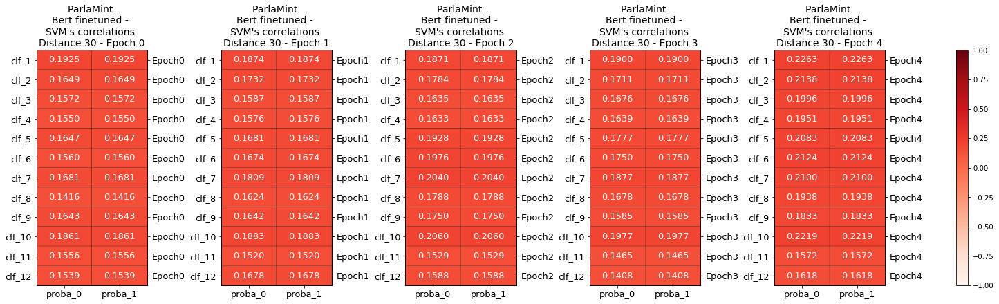

In [126]:
plot_correlation_heatmap_bert_svm(list_df_bert_finetuning_proba_svm_dist_30, 30, diz_cmap['30'])

In [127]:
corr, _ = spearmanr([diz_dist_30_bf['df_dist_30']['Epoch0']['ids_proba'][i][0] \
                     for i in diz_dist_30_bf['df_dist_30']['Epoch0']['ids_proba']], \
                    
                    [diz_dist_30_svm['df_dist_30']['clf_12']['ids_proba'][i][0] \
                     for i in diz_dist_30_svm['df_dist_30']['clf_12']['ids_proba']])

print(corr)

0.1539049812227911


In [128]:
list_df_bert_finetuning_proba_svm_random_speech = []

for i in num_epoch:    
    list_df_bert_finetuning_proba_svm_random_speech.append(get_proba_df_svm_bert_finetunato(diz_random_speech_svm['df_random_speech'],\
                                                                            diz_random_speech_bf['df_random_speech'], i))

/var/folders/zr/x6zkwkj55dl2mb3rc8k8h1_h0000gn/T/ipykernel_59913/1074886370.py:34: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  fig.colorbar(heatmap, pad=0.3)


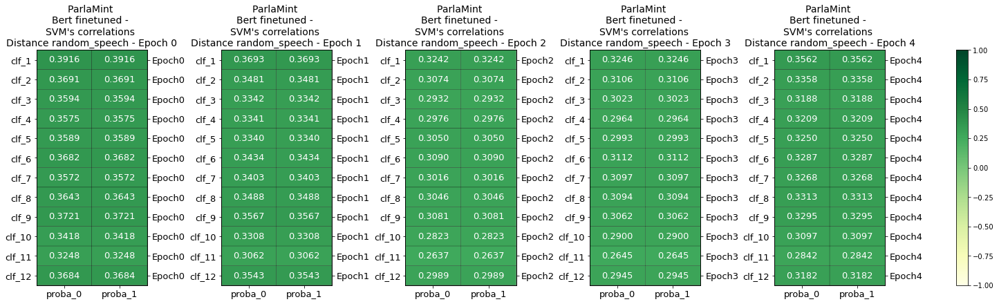

In [129]:
plot_correlation_heatmap_bert_svm(list_df_bert_finetuning_proba_svm_random_speech, 'random_speech', \
                                  diz_cmap['random_speech'])